>># **PROJET : Anticipez les besoins en consommation de batiments**

>>>Source du jeu de données : 	https://data.seattle.gov/dataset/2016-Building-Energy-Benchmarking/2bpz-gwpy


# **SOMMAIRE :**

<a href="#C1"> **PHASE 1 : Cleaning** </a>
- Importation des données

- Exploration des données

- Cleaning des données

- Visualisation des données sur carte géographique

- Sauvegarde du dataframe post-analyse

<a href="#C2"> **PHASE 2 : Analyse exploratoire** </a>
- Chargement des librairies importées

- Chargement des données

- Display

- Analyse exploratoire des données

  - Analyse univariée
  - Analyse bivariée

- Préparation des données avant la sauvegarde

- Sauvegarde du dataframe pour la modélisation

<a href="#C3"> **PHASE 3 : Traitement pré-prediction** </a>

- Chargement des données
- Vérifions qu'il existe bien une corrélation entre les variables continues et traget

- Vérifions s'il y a des variables avec une forte asymétrie
- Verifions s'il existe une corrélation entre les variables trop asymétrique et les variables targets
- Effectuons une transformation logarithmique des variables ayant une forte asymétyrie
- Encodons les variables qualitatives
- Préparons la dataframe avant la sauvegarde
- Sauvegarde du dataframe pour la prédiction






>>>>>># **TRAITE PROJET :**




># **Importation de librairies**

Importons dans un premier temps l'ensemble des librairies qui vont nous servir tout au long de l'étude :

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

**Reglages de quelques paramètres**

In [ ]:
#Formatons les colonnes en faisant en sorte que tous les décimaux soit affichés avec 3 chiffres après la virgule
pd.set_option('display.float_format', '{:.3f}'.format)

# Change les parametre de panda pour afficher toutes colonnes
pd.set_option('display.max_columns', None) 

# <a name="C1"> **PHASE DE CLEANING** </a>

>## **Exploration des données**


>>### **Chargement des données**

In [ ]:
data = pd.read_csv('2016_Building_Energy_Benchmarking.csv')

>>### **Display**

In [ ]:
data.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.000,0659000030,7,DOWNTOWN,47.612,-122.338,1927,1.000,12,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,60.000,81.700,84.300,182.500,189.000,7226362.500,7456910.000,2003882.000,1156514.250,3946027.000,12764.529,1276453.000,False,NaN,Compliant,NaN,249.980,2.830
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.000,0659000220,7,DOWNTOWN,47.613,-122.334,1996,1.000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,61.000,94.800,97.900,176.100,179.400,8387933.000,8664479.000,0.000,950425.188,3242851.000,51450.816,5145082.000,False,NaN,Compliant,NaN,295.860,2.860
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.000,0659000475,7,DOWNTOWN,47.614,-122.338,1969,1.000,41,956110,196718,759392,Hotel,Hotel,756493.000,NaN,NaN,NaN,NaN,NaN,43.000,96.000,97.700,241.900,244.100,72587024.000,73937112.000,21566554.000,14515435.000,49526664.000,14938.000,1493800.000,False,NaN,Compliant,NaN,2089.280,2.190
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.000,0659000640,7,DOWNTOWN,47.614,-122.337,1926,1.000,10,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,56.000,110.800,113.300,216.200,224.000,6794584.000,6946800.500,2214446.250,811525.312,2768924.000,18112.131,1811213.000,False,NaN,Compliant,NaN,286.430,4.670
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.000,0659000970,7,DOWNTOWN,47.614,-122.340,1980,1.000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,75.000,114.800,118.700,211.400,215.600,14172606.000,14656503.000,0.000,1573448.625,5368607.000,88039.984,8803998.000,False,NaN,Compliant,NaN,505.010,2.880


In [ ]:
data.tail()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.567,-122.312,1990,1.000,1,12294,0,12294,Office,Office,12294.000,NaN,NaN,NaN,NaN,NaN,46.000,69.100,76.700,161.700,176.100,849745.688,943003.188,0.000,153655.000,524270.860,3254.750,325475.024,True,NaN,Error - Correct Default Data,NaN,20.940,1.700
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.596,-122.323,2004,1.000,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.000,NaN,NaN,NaN,NaN,NaN,NaN,59.400,65.900,114.200,118.900,950276.188,1053705.750,0.000,116221.000,396546.052,5537.300,553729.980,False,NaN,Compliant,NaN,32.170,2.010
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.636,-122.358,1974,1.000,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.000,Fitness Center/Health Club/Gym,5574.000,Swimming Pool,0.000,NaN,NaN,438.200,460.100,744.800,767.800,5765898.000,6053764.500,0.000,525251.688,1792158.758,39737.391,3973739.063,False,NaN,Compliant,NaN,223.540,16.990
3374,50225,2016,Nonresidential COS,Mixed Use Property,South Park Community Center,8319 8th Ave S,Seattle,WA,NaN,7883603155,1,GREATER DUWAMISH,47.528,-122.324,1989,1.000,1,14101,0,14101,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,6601.000,Fitness Center/Health Club/Gym,6501.000,Pre-school/Daycare,484.000,NaN,NaN,51.000,55.500,105.300,110.800,719471.188,782841.312,0.000,102248.000,348870.176,3706.010,370601.001,False,NaN,Compliant,NaN,22.110,1.570
3375,50226,2016,Nonresidential COS,Mixed Use Property,Van Asselt Community Center,2820 S Myrtle St,Seattle,WA,NaN,7857002030,2,GREATER DUWAMISH,47.539,-122.295,1938,1.000,1,18258,0,18258,"Fitness Center/Health Club/Gym, Food Service, ...",Other - Recreation,8271.000,Fitness Center/Health Club/Gym,8000.000,Pre-school/Daycare,1108.000,NaN,NaN,63.100,70.900,115.800,123.900,1152896.250,1293722.375,0.000,126774.398,432554.247,7203.420,720341.992,False,NaN,Compliant,NaN,41.270,2.260


In [ ]:
data.sample(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
481,649,2016,NonResidential,Small- and Mid-Sized Office,INScape,815 Seattle Blvd S.,Seattle,WA,98134.000,7669800045,3,EAST,47.595,-122.327,1930,0.000,4,76624,0,76624,Office,Office,76624.000,NaN,NaN,NaN,NaN,NaN,91.000,36.200,41.300,105.300,121.500,2773647.500,3166841.750,0.000,723489.812,2468547.000,3051.000,305100.000,False,NaN,Compliant,NaN,33.410,0.440
2024,24170,2016,NonResidential,Small- and Mid-Sized Office,Willow Creek (Buildings 1 & 2),9700 Lake City Way NE,Seattle,WA,98115.000,5101405280,5,NORTH,47.700,-122.303,1974,1.000,2,24291,0,24291,Office,Office,24291.000,NaN,NaN,NaN,NaN,NaN,87.000,37.900,37.900,119.000,119.000,920430.625,920430.625,0.000,269762.688,920430.000,0.000,0.000,False,NaN,Compliant,NaN,6.420,0.260
1202,21234,2016,Multifamily LR (1-4),Low-Rise Multifamily,Bitter Lake Manor,620 N 130th St,Seattle,WA,98133.000,1926049389,5,NORTHWEST,47.724,-122.351,1983,1.000,3,59301,0,59301,Multifamily Housing,Multifamily Housing,59301.000,NaN,NaN,NaN,NaN,NaN,51.000,31.500,32.900,98.800,103.400,1866802.375,1952345.500,0.000,547128.375,1866802.000,0.000,0.000,False,NaN,Compliant,NaN,13.010,0.220
333,469,2016,NonResidential,Laboratory,Rosen Building - SEDO,960 Republican St.,Seattle,WA,98109.000,1983200160,7,LAKE UNION,47.623,-122.337,1928,1.000,3,55200,0,55200,"Data Center, Laboratory",Laboratory,54880.000,Data Center,320.000,NaN,NaN,NaN,NaN,210.000,218.700,504.500,509.000,11594121.000,12072969.000,0.000,2198235.000,7500378.000,40937.422,4093742.000,False,NaN,Compliant,NaN,269.710,4.890
1600,22739,2016,Multifamily LR (1-4),Low-Rise Multifamily,Greenhouse Condo HOA,2224 NE 92nd St.,Seattle,WA,98115.000,2909000000,5,NORTHEAST,47.696,-122.305,1979,1.000,4,75154,0,75154,Multifamily Housing,Multifamily Housing,75154.000,NaN,NaN,NaN,NaN,NaN,70.000,25.700,26.900,76.900,81.300,1930938.000,2018943.000,0.000,526276.312,1795655.000,1352.830,135283.000,False,NaN,Compliant,NaN,19.700,0.260


>>### **Structure des données**

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [ ]:
data.dtypes.value_counts()

float64    22
object     15
int64       8
bool        1
dtype: int64

In [ ]:
data.nunique()

OSEBuildingID                      3376
DataYear                              1
BuildingType                          8
PrimaryPropertyType                  24
PropertyName                       3362
Address                            3354
City                                  1
State                                 1
ZipCode                              55
TaxParcelIdentificationNumber      3268
CouncilDistrictCode                   7
Neighborhood                         19
Latitude                           2876
Longitude                          2656
YearBuilt                           113
NumberofBuildings                    17
NumberofFloors                       50
PropertyGFATotal                   3195
PropertyGFAParking                  496
PropertyGFABuilding(s)             3193
ListOfAllPropertyUseTypes           466
LargestPropertyUseType               56
LargestPropertyUseTypeGFA          3122
SecondLargestPropertyUseType         50
SecondLargestPropertyUseTypeGFA    1352


>>### **Inspectons des données**

>>>#### **Inspecter de la variables	YearBuilt**

In [ ]:
data['YearBuilt'].unique()

array([1927, 1996, 1969, 1926, 1980, 1999, 1904, 1910, 1998, 1928, 1922,
       2004, 1930, 1983, 1907, 1916, 1985, 1961, 2001, 1991, 1955, 1978,
       1949, 1989, 1906, 1994, 1992, 1990, 1950, 1900, 1954, 1911, 1973,
       1920, 1982, 1908, 1959, 2000, 1997, 1962, 1970, 2008, 1948, 1965,
       1929, 2010, 1938, 1986, 2002, 1923, 2003, 1957, 1964, 1941, 1963,
       2006, 1915, 1958, 2009, 2011, 1971, 2007, 1951, 1953, 1952, 1960,
       1937, 1966, 1968, 1925, 1924, 2005, 1909, 1931, 1972, 1914, 1913,
       1917, 1995, 1981, 1976, 1988, 1979, 1947, 1984, 1956, 1912, 1977,
       1921, 1945, 1974, 1975, 1946, 1967, 1987, 1940, 1932, 1993, 1918,
       1905, 1902, 1939, 1944, 1942, 1903, 2012, 2013, 2015, 1901, 1919,
       2014, 1936, 1935])

In [ ]:
data['YearBuilt'].value_counts()

2000    72
2014    67
1989    67
2008    66
1988    64
        ..
1942     3
1939     2
1944     2
1936     1
1935     1
Name: YearBuilt, Length: 113, dtype: int64

In [ ]:
data['YearBuilt'].value_counts(normalize=True).round(2)

2000   0.020
2014   0.020
1989   0.020
2008   0.020
1988   0.020
        ... 
1942   0.000
1939   0.000
1944   0.000
1936   0.000
1935   0.000
Name: YearBuilt, Length: 113, dtype: float64

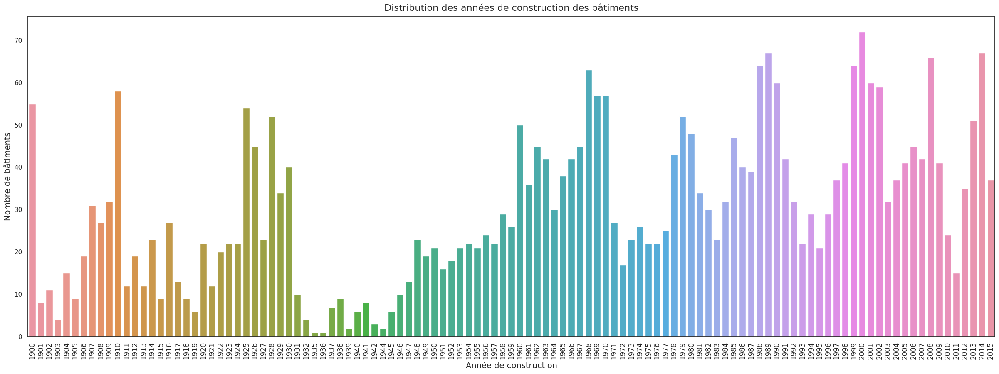

In [ ]:
plt.figure(figsize=(30, 10))
sorted_data = data['YearBuilt'].value_counts().sort_index()
sns.barplot(x=sorted_data.index, y=sorted_data.values)
plt.xticks(rotation=90, fontsize=12)
plt.xlabel('Année de construction', fontsize=14)
plt.ylabel('Nombre de bâtiments', fontsize=14)
plt.title('Distribution des années de construction des bâtiments', fontsize=16, pad=10)
plt.show()

>>>#### **Inspecter de la variables outliers**

In [ ]:
data['Outlier']

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
3371    NaN
3372    NaN
3373    NaN
3374    NaN
3375    NaN
Name: Outlier, Length: 3376, dtype: object

In [ ]:
data['Outlier'].nunique()

2

In [ ]:
data['Outlier'].unique()

array([nan, 'High outlier', 'Low outlier'], dtype=object)

In [ ]:
data['Outlier'].value_counts()

Low outlier     23
High outlier     9
Name: Outlier, dtype: int64

In [ ]:
data.loc[data['Outlier'] == 'Low outlier']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
384,539,2016,NonResidential,Retail Store,University Center,4501 Roosevelt Way NE,Seattle,WA,98105.000,5335200380,4,NORTHEAST,47.662,-122.318,1987,1.000,2,69492,0,69492,Retail Store,Retail Store,69800.000,Other,0.000,NaN,NaN,NaN,100.000,4.600,4.600,14.300,14.300,318962.812,318962.812,0.000,93482.602,318963.000,0.000,0.000,False,NaN,Non-Compliant,Low outlier,2.220,0.030
448,608,2016,NonResidential,Large Office,411 1ST AVE S (ID608),411 1ST AVE S,Seattle,WA,98104.000,5247800200,2,DOWNTOWN,47.599,-122.335,1913,5.000,7,154159,0,154159,Office,Office,193154.000,NaN,NaN,NaN,NaN,NaN,100.000,58.000,58.800,28.000,28.700,11195917.000,11348758.000,0.000,471503.000,1608768.000,3430.500,343050.000,False,NaN,Non-Compliant,Low outlier,29.430,0.190
720,19708,2016,Multifamily HR (10+),High-Rise Multifamily,Bay Vista,2821 2nd Ave,Seattle,WA,98121.000,0586400000,7,DOWNTOWN,47.617,-122.351,1982,1.000,24,167941,0,167941,"Multifamily Housing, Swimming Pool",Multifamily Housing,138787.000,Parking,99952.000,Swimming Pool,0.000,NaN,100.000,17.300,18.700,50.400,54.000,2407904.500,2589125.500,0.000,626561.625,2137828.000,2700.760,270076.000,False,NaN,Non-Compliant,Low outlier,29.250,0.170
834,19934,2016,Multifamily LR (1-4),Low-Rise Multifamily,Belmont Lofts,231 Belmont Ave E,Seattle,WA,98102.000,0704600000,3,EAST,47.621,-122.324,1989,1.000,4,31702,0,31702,"Multifamily Housing, Parking",Multifamily Housing,26418.000,Parking,14280.000,NaN,NaN,NaN,NaN,9.700,10.400,30.400,32.700,255971.203,275412.000,0.000,75020.898,255971.000,0.000,0.000,False,NaN,Non-Compliant,Low outlier,1.780,0.060
839,19967,2016,SPS-District K-12,K-12 School,Queen Anne Gym,1431 2nd Ave N,Seattle,WA,98109.000,0811000005,7,MAGNOLIA / QUEEN ANNE,47.632,-122.353,2001,1.000,1,35805,0,35805,K-12 School,K-12 School,35805.000,NaN,NaN,NaN,NaN,NaN,100.000,12.100,12.100,27.000,27.000,431471.688,431471.688,0.000,72282.398,246628.000,1848.440,184844.000,True,NaN,Error - Correct Default Data,Low outlier,11.540,0.320
962,20367,2016,Multifamily LR (1-4),Low-Rise Multifamily,City Lights on Harbor,2349 Harbor Ave. SW,Seattle,WA,98126.000,1595200000,1,SOUTHWEST,47.581,-122.375,1990,1.000,3,70207,0,70207,Multifamily Housing,Multifamily Housing,71273.000,NaN,NaN,NaN,NaN,NaN,100.000,9.900,9.900,30.900,30.900,702481.375,702481.375,0.000,205885.500,702481.000,0.000,0.000,False,NaN,Non-Compliant,Low outlier,4.900,0.070
1045,20617,2016,NonResidential,Retail Store,Seattle Habitat Store,21 S Nevada St,Seattle,WA,98134.000,1824049074,2,GREATER DUWAMISH,47.565,-122.341,1953,1.000,1,39900,0,39900,"Non-Refrigerated Warehouse, Retail Store",Retail Store,25000.000,Non-Refrigerated Warehouse,15000.000,NaN,NaN,NaN,100.000,3.600,3.600,6.400,6.400,145468.797,145468.797,0.000,14362.500,49005.000,964.640,96464.000,True,NaN,Error - Correct Default Data,Low outlier,5.460,0.140
1229,21315,2016,NonResidential,Small- and Mid-Sized Office,1518 Fifith Ave,1520 Fifth Ave,Seattle,WA,98101.000,1975700135,7,DOWNTOWN,47.611,-122.336,1903,1.000,3,57720,0,57720,Office,Office,25000.000,NaN,NaN,NaN,NaN,NaN,NaN,1.000,1.000,3.000,3.000,24105.500,24105.500,0.000,7064.900,24105.000,0.000,0.000,False,NaN,Non-Compliant,Low outlier,0.170,0.000
1295,21474,20

In [ ]:
data.loc[data['Outlier'] == 'High outlier']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
226,350,2016,NonResidential,Large Office,Second And Spring Building,1100 Second Avenue,Seattle,WA,98101.000,0942000045,7,DOWNTOWN,47.606,-122.336,1958,1.000,6,172842,25920,146922,"Data Center, Office, Parking",Office,99890.000,Data Center,39336.000,Parking,25000.000,NaN,NaN,297.400,299.200,909.600,911.500,41399504.000,41650404.000,0.000,11663150.000,39794668.000,16048.310,1604831.000,False,NaN,Non-Compliant,High outlier,362.660,2.100
517,704,2016,NonResidential,Large Office,401 Elliott Ave West,401 Elliot Ave West,Seattle,WA,98119.000,7666202110,7,MAGNOLIA / QUEEN ANNE,47.622,-122.364,2000,1.000,4,129551,42500,87051,"Data Center, Office, Parking",Office,82273.000,Parking,42500.000,Data Center,4778.000,NaN,1.000,311.700,311.700,978.900,978.900,27137190.000,27137190.000,0.000,7953454.500,27137187.000,0.000,0.000,False,NaN,Non-Compliant,High outlier,189.180,1.460
1707,23174,2016,Multifamily LR (1-4),Mid-Rise Multifamily,Taylor Anne Condominium,1730 Taylor Ave N,Seattle,WA,98109.000,8567250000,7,MAGNOLIA / QUEEN ANNE,47.634,-122.347,1969,1.000,5,30569,0,30569,Multifamily Housing,Multifamily Housing,30921.000,NaN,NaN,NaN,NaN,NaN,1.000,221.000,231.900,684.300,717.200,6834431.000,7169577.000,0.000,1961077.750,6691197.000,1432.330,143233.000,False,NaN,Non-Compliant,High outlier,54.250,1.770
2763,26852,2016,Multifamily LR (1-4),Low-Rise Multifamily,Atlas Building,420 Maynard Avenue South,Seattle,WA,98104.000,5247802315,2,DOWNTOWN,47.599,-122.325,1920,1.000,4,46560,0,46560,"Multifamily Housing, Restaurant, Retail Store",Multifamily Housing,46560.000,Retail Store,3000.000,Restaurant,2000.000,NaN,NaN,133.500,134.100,211.300,213.500,6881405.500,6916663.000,0.000,514840.688,1756636.000,51247.688,5124769.000,False,NaN,Non-Compliant,High outlier,284.420,6.110
2863,27245,2016,Multifamily LR (1-4),Low-Rise Multifamily,St. Johns Apartments,725 E. Pike Street,Seattle,WA,98122.000,7502500061,3,EAST,47.614,-122.322,1910,1.000,3,24682,0,24682,"Multifamily Housing, Retail Store",Multifamily Housing,17822.000,Retail Store,6085.000,NaN,NaN,NaN,74.000,112.200,113.400,205.400,206.700,2681771.000,2710595.000,0.000,293781.312,1002382.000,16793.891,1679389.000,False,NaN,Non-Compliant,High outlier,96.180,3.900
2922,27526,2016,Multifamily LR (1-4),Low-Rise Multifamily,Vali Hai,800 1st Ave N.,Seattle,WA,98112.000,5457300300,7,MAGNOLIA / QUEEN ANNE,47.627,-122.355,1959,2.000,4,43346,0,43346,"Multifamily Housing, Parking, Swimming Pool",Multifamily Housing,43346.000,Parking,12600.000,Swimming Pool,0.000,NaN,5.000,104.300,111.900,205.600,216.100,4519115.000,4850560.000,0.000,584334.688,1993750.000,25253.650,2525365.000,False,NaN,Non-Compliant,High outlier,148.020,3.410
3082,28735,2016,Multifamily LR (1-4),Low-Rise Multifamily,Building 4,400 NE Thornton Place,Seattle,WA,98125.000,8632880000,5,NORTH,47.702,-122.325,2008,1.000,4,46725,0,46725,Multifamily Housing,Multifamily Housing,102522.000,NaN,NaN,NaN,NaN,NaN,1.000,131.300,140.100,218.600,230.900,13459221.000,14360223.000,0.000,1161542.750,3963184.000,94960.359,9496036.000,False,NaN,Non-Compliant,High outlier,531.960,11.380
3092,29390,2016,Multifamily MR (5-9),Mid-Rise Multifamily,Commodore Duchess Apartments,4005 15th Av

>>>#### **Inspecter les types de batiments**

In [ ]:
data['BuildingType'].nunique()

8

In [ ]:
data['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Campus', 'Multifamily LR (1-4)',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [ ]:
data['BuildingType'].value_counts()

NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: BuildingType, dtype: int64

In [ ]:
data['BuildingType'].value_counts(normalize=True).round(2)

NonResidential         0.430
Multifamily LR (1-4)   0.300
Multifamily MR (5-9)   0.170
Multifamily HR (10+)   0.030
SPS-District K-12      0.030
Nonresidential COS     0.030
Campus                 0.010
Nonresidential WA      0.000
Name: BuildingType, dtype: float64

<Axes: ylabel='BuildingType'>

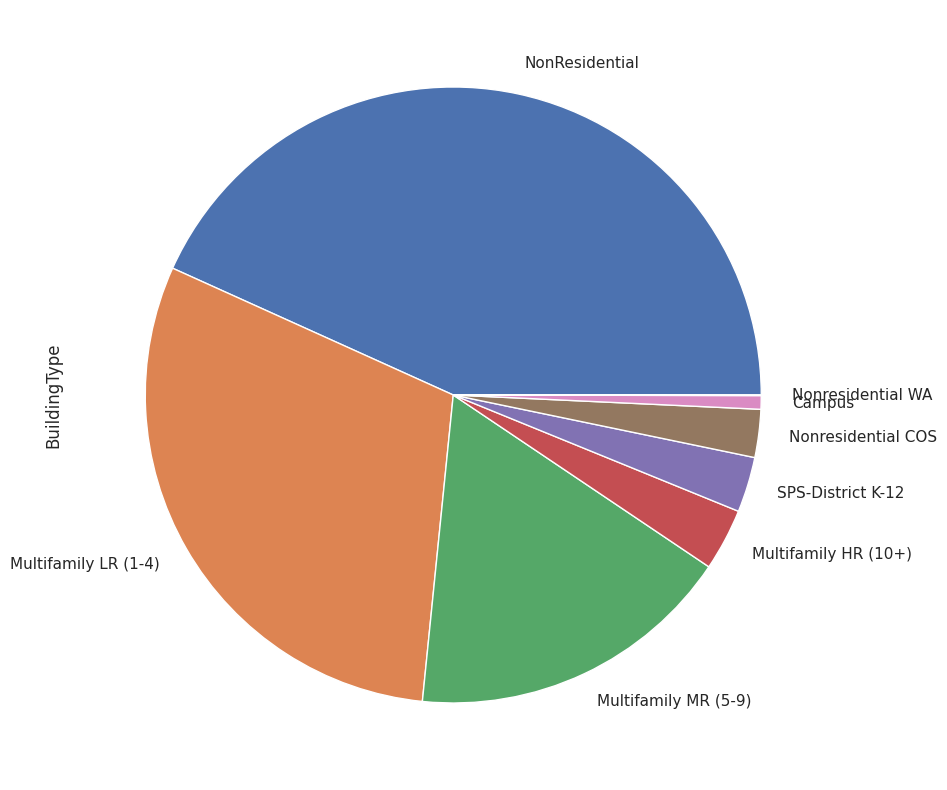

In [ ]:
plt.figure(figsize=(10, 10))
data['BuildingType'].value_counts().plot(kind='pie')

>>>#### **Inspecter les villes**

In [ ]:
data['City'].nunique()

1

In [ ]:
data['City'].value_counts()

Seattle    3376
Name: City, dtype: int64

>>>#### **Filtrons les batiments non residentiel**

In [ ]:
df_bat_nonResidentiel = data.loc[(data['BuildingType'] == 'NonResidential') | (data['BuildingType'] == 'Nonresidential COS') | (data['BuildingType'] == 'SPS-District K-12') | (data['BuildingType'] == 'Campus'), :]
df_bat_nonResidentiel

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.000,0659000030,7,DOWNTOWN,47.612,-122.338,1927,1.000,12,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,60.000,81.700,84.300,182.500,189.000,7226362.500,7456910.000,2003882.000,1156514.250,3946027.000,12764.529,1276453.000,False,NaN,Compliant,NaN,249.980,2.830
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.000,0659000220,7,DOWNTOWN,47.613,-122.334,1996,1.000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,61.000,94.800,97.900,176.100,179.400,8387933.000,8664479.000,0.000,950425.188,3242851.000,51450.816,5145082.000,False,NaN,Compliant,NaN,295.860,2.860
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.000,0659000475,7,DOWNTOWN,47.614,-122.338,1969,1.000,41,956110,196718,759392,Hotel,Hotel,756493.000,NaN,NaN,NaN,NaN,NaN,43.000,96.000,97.700,241.900,244.100,72587024.000,73937112.000,21566554.000,14515435.000,49526664.000,14938.000,1493800.000,False,NaN,Compliant,NaN,2089.280,2.190
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.000,0659000640,7,DOWNTOWN,47.614,-122.337,1926,1.000,10,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,56.000,110.800,113.300,216.200,224.000,6794584.000,6946800.500,2214446.250,811525.312,2768924.000,18112.131,1811213.000,False,NaN,Compliant,NaN,286.430,4.670
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.000,0659000970,7,DOWNTOWN,47.614,-122.340,1980,1.000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,75.000,114.800,118.700,211.400,215.600,14172606.000,14656503.000,0.000,1573448.625,5368607.000,88039.984,8803998.000,False,NaN,Compliant,NaN,505.010,2.880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,50222,2016,Nonresidential COS,Office,Horticulture building,1600 S Dakota St,Seattle,WA,NaN,1624049080,2,GREATER DUWAMISH,47.567,-122.312,1990,1.000,1,12294,0,12294,Office,Office,12294.000,NaN,NaN,NaN,NaN,NaN,46.000,69.100,76.700,161.700,176.100,849745.688,943003.188,0.000,153655.000,524270.860,3254.750,325475.024,True,NaN,Error - Correct Default Data,NaN,20.940,1.700
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.596,-122.323,2004,1.000,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.000,NaN,NaN,NaN,NaN,NaN,NaN,59.400,65.900,114.200,118.900,950276.188,1053705.750,0.000,116221.000,396546.052,5537.300,553729.980,False,NaN,Compliant,NaN,32.170,2.010
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.636,-122.358,1974,1.000,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.000,Fitness Center/Health Club/Gym,5574.000,Swimming Pool,0.000,NaN,NaN,438.200,460.100,744.800,767.800,5765898.000,6053764.500,0.000,525251.68

>>>#### **inspectons la colonnes 'compliances status'**

In [ ]:
df_bat_nonResidentiel['ComplianceStatus'].nunique()

4

In [ ]:
df_bat_nonResidentiel['ComplianceStatus'].unique()

array(['Compliant', 'Error - Correct Default Data', 'Missing Data',
       'Non-Compliant'], dtype=object)

In [ ]:
df_bat_nonResidentiel['ComplianceStatus'].value_counts()

Compliant                       1547
Error - Correct Default Data      88
Non-Compliant                     18
Missing Data                      14
Name: ComplianceStatus, dtype: int64

>>>>##### **Filtrons les batiments repondant à la norme 'compliance'**

In [ ]:
df_bat_nonRes_compliant = df_bat_nonResidentiel.loc[df_bat_nonResidentiel['ComplianceStatus'] == 'Compliant', :]
df_bat_nonRes_compliant

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.000,0659000030,7,DOWNTOWN,47.612,-122.338,1927,1.000,12,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,60.000,81.700,84.300,182.500,189.000,7226362.500,7456910.000,2003882.000,1156514.250,3946027.000,12764.529,1276453.000,False,NaN,Compliant,NaN,249.980,2.830
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.000,0659000220,7,DOWNTOWN,47.613,-122.334,1996,1.000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,61.000,94.800,97.900,176.100,179.400,8387933.000,8664479.000,0.000,950425.188,3242851.000,51450.816,5145082.000,False,NaN,Compliant,NaN,295.860,2.860
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.000,0659000475,7,DOWNTOWN,47.614,-122.338,1969,1.000,41,956110,196718,759392,Hotel,Hotel,756493.000,NaN,NaN,NaN,NaN,NaN,43.000,96.000,97.700,241.900,244.100,72587024.000,73937112.000,21566554.000,14515435.000,49526664.000,14938.000,1493800.000,False,NaN,Compliant,NaN,2089.280,2.190
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.000,0659000640,7,DOWNTOWN,47.614,-122.337,1926,1.000,10,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,56.000,110.800,113.300,216.200,224.000,6794584.000,6946800.500,2214446.250,811525.312,2768924.000,18112.131,1811213.000,False,NaN,Compliant,NaN,286.430,4.670
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.000,0659000970,7,DOWNTOWN,47.614,-122.340,1980,1.000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,75.000,114.800,118.700,211.400,215.600,14172606.000,14656503.000,0.000,1573448.625,5368607.000,88039.984,8803998.000,False,NaN,Compliant,NaN,505.010,2.880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3370,50221,2016,Nonresidential COS,Other,High Point Community Center,6920 34th Ave SW,Seattle,WA,NaN,2524039059,1,DELRIDGE NEIGHBORHOODS,47.541,-122.374,1982,1.000,1,18261,0,18261,Other - Recreation,Other - Recreation,18261.000,NaN,NaN,NaN,NaN,NaN,NaN,51.000,56.200,126.000,136.600,932082.125,1025432.125,0.000,185334.703,632362.007,2997.200,299719.995,False,NaN,Compliant,NaN,20.330,1.110
3372,50223,2016,Nonresidential COS,Other,International district/Chinatown CC,719 8th Ave S,Seattle,WA,NaN,3558300000,2,DOWNTOWN,47.596,-122.323,2004,1.000,1,16000,0,16000,Other - Recreation,Other - Recreation,16000.000,NaN,NaN,NaN,NaN,NaN,NaN,59.400,65.900,114.200,118.900,950276.188,1053705.750,0.000,116221.000,396546.052,5537.300,553729.980,False,NaN,Compliant,NaN,32.170,2.010
3373,50224,2016,Nonresidential COS,Other,Queen Anne Pool,1920 1st Ave W,Seattle,WA,NaN,1794501150,7,MAGNOLIA / QUEEN ANNE,47.636,-122.358,1974,1.000,1,13157,0,13157,"Fitness Center/Health Club/Gym, Other - Recrea...",Other - Recreation,7583.000,Fitness Center/Health Club/Gym,5574.000,Swimming Pool,0.000,NaN,NaN,438.200,460.100,744.800,767.800,5765898.000,6053764.500,

In [ ]:
df_bat_nonRes_compliant.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1547 entries, 0 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    1547 non-null   int64  
 1   DataYear                         1547 non-null   int64  
 2   BuildingType                     1547 non-null   object 
 3   PrimaryPropertyType              1547 non-null   object 
 4   PropertyName                     1547 non-null   object 
 5   Address                          1547 non-null   object 
 6   City                             1547 non-null   object 
 7   State                            1547 non-null   object 
 8   ZipCode                          1534 non-null   float64
 9   TaxParcelIdentificationNumber    1547 non-null   object 
 10  CouncilDistrictCode              1547 non-null   int64  
 11  Neighborhood                     1547 non-null   object 
 12  Latitude            

>>>#### Vérifions que toutes recueillies sur les batiments soient de 2016

In [ ]:
df_bat_nonRes_compliant['DataYear'].value_counts()

2016    1547
Name: DataYear, dtype: int64

In [ ]:
df_bat_nonRes_compliant['DataYear'].value_counts(normalize=True)

2016   1.000
Name: DataYear, dtype: float64

In [ ]:
df_bat_nonRes_compliant['BuildingType'].value_counts()

NonResidential        1432
Nonresidential COS      81
Campus                  24
SPS-District K-12       10
Name: BuildingType, dtype: int64

>>### **inspection Nan et doublons**

>>>#### **Taux Nan**

<Axes: >

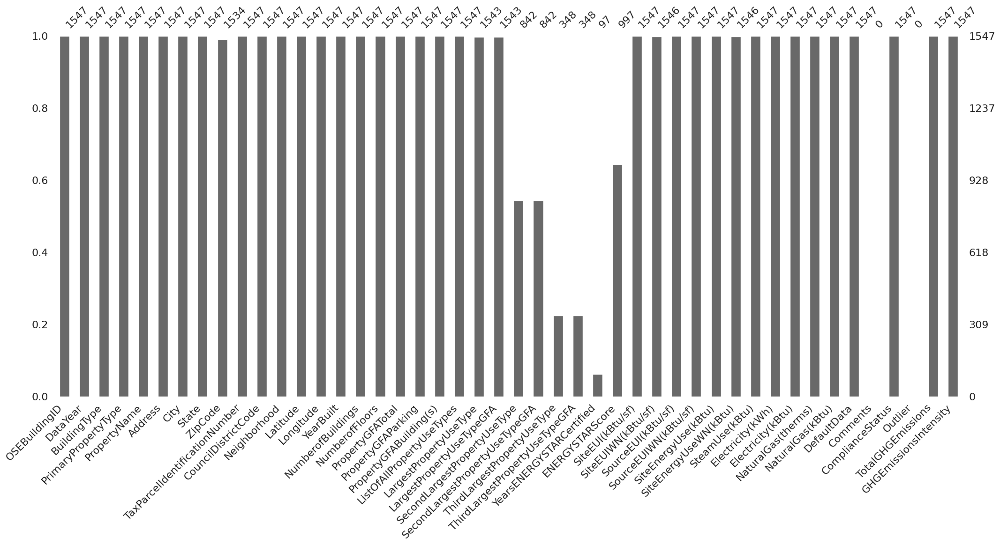

In [ ]:
msno.bar(df_bat_nonRes_compliant)

In [ ]:
df_bat_nonRes_compliant.isna().mean()[df_bat_nonRes_compliant.isna().mean() > 0]


ZipCode                           0.008
LargestPropertyUseType            0.003
LargestPropertyUseTypeGFA         0.003
SecondLargestPropertyUseType      0.456
SecondLargestPropertyUseTypeGFA   0.456
ThirdLargestPropertyUseType       0.775
ThirdLargestPropertyUseTypeGFA    0.775
YearsENERGYSTARCertified          0.937
ENERGYSTARScore                   0.356
SiteEUIWN(kBtu/sf)                0.001
SiteEnergyUseWN(kBtu)             0.001
Comments                          1.000
Outlier                           1.000
dtype: float64

>>>#### **Doublons**

In [ ]:
df_bat_nonRes_compliant.duplicated().sum()

0

>>>>##### Dans la variable '**PropertyName**'

In [ ]:
df_bat_nonRes_compliant['PropertyName'].duplicated().sum()

4

In [ ]:
duplicate_rows = df_bat_nonRes_compliant[df_bat_nonRes_compliant.duplicated(['PropertyName'])]
duplicate_rows

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1462,21893,2016,NonResidential,Warehouse,South Park,9125 10th Ave S,Seattle,WA,98108.000,2433700015,1,GREATER DUWAMISH,47.521,-122.322,1979,1.000,1,31600,0,31600,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,31600.000,NaN,NaN,NaN,NaN,NaN,3.000,106.400,118.100,219.800,232.000,3363535.500,3731853.250,0.000,478694.594,1633306.000,17302.291,1730229.000,False,NaN,Compliant,NaN,103.280,3.270
1566,22486,2016,NonResidential,Small- and Mid-Sized Office,Canal Building,3600 15th Ave W,Seattle,WA,98119.000,2770603315,7,MAGNOLIA / QUEEN ANNE,47.653,-122.376,1982,1.000,3,25859,0,25859,"Office, Parking",Office,25859.000,Parking,4000.000,NaN,NaN,NaN,88.000,33.200,35.400,88.700,91.000,858780.625,916019.375,0.000,195107.594,665707.000,1930.733,193073.000,False,NaN,Compliant,NaN,14.900,0.580
1965,23963,2016,NonResidential,Warehouse,Bayview Building,923 S. Bayview St.,Seattle,WA,98134.000,7666202991,2,GREATER DUWAMISH,47.581,-122.320,1936,1.000,1,38630,0,38630,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,38500.000,NaN,NaN,NaN,NaN,NaN,33.000,10.800,10.800,34.000,34.000,416885.594,416885.594,0.000,122182.203,416886.000,0.000,0.000,False,NaN,Compliant,NaN,2.910,0.080
1968,23971,2016,NonResidential,Refrigerated Warehouse,Airport Way,2415 Airport Way South,Seattle,WA,98134.000,7666203180,2,GREATER DUWAMISH,47.581,-122.322,1955,1.000,1,25375,0,25375,"Office, Refrigerated Warehouse",Refrigerated Warehouse,23419.000,Office,2266.000,NaN,NaN,NaN,NaN,158.400,158.400,497.500,497.500,4069301.500,4069301.500,0.000,1192643.875,4069301.000,0.000,0.000,False,NaN,Compliant,NaN,28.370,1.120


In [ ]:
duplicates = df_bat_nonRes_compliant[df_bat_nonRes_compliant['PropertyName'].duplicated()]
for index, row in duplicates.iterrows():
    duplicate_rows = df_bat_nonRes_compliant.loc[df_bat_nonRes_compliant['PropertyName'] == row["PropertyName"], : ]
    display("Lignes dupliquées pour :", row["PropertyName"])
    print('\n')
    print('--'*200)
    display(duplicate_rows)

'Lignes dupliquées pour :'

'South Park'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
162,261,2016,Campus,Large Office,South Park,1420 S Trenton,Seattle,WA,98108.000,7883608601,1,GREATER DUWAMISH,47.524,-122.312,1980,14.000,2,334368,31874,302494,"Laboratory, Non-Refrigerated Warehouse, Office...",Office,240984.000,Laboratory,72963.000,Other - Utility,16766.000,NaN,NaN,159.900,161.900,451.200,453.300,53466684.000,54136068.000,0.000,13282936.000,45321378.000,81453.000,8145300.000,False,NaN,Compliant,NaN,748.550,2.240
1462,21893,2016,NonResidential,Warehouse,South Park,9125 10th Ave S,Seattle,WA,98108.000,2433700015,1,GREATER DUWAMISH,47.521,-122.322,1979,1.000,1,31600,0,31600,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,31600.000,NaN,NaN,NaN,NaN,NaN,3.000,106.400,118.100,219.800,232.000,3363535.500,3731853.250,0.000,478694.594,1633306.000,17302.291,1730229.000,False,NaN,Compliant,NaN,103.280,3.270


'Lignes dupliquées pour :'

'Canal Building'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1158,21119,2016,NonResidential,Warehouse,Canal Building,712 N 34th St,Seattle,WA,98103.000,1972202680,6,LAKE UNION,47.650,-122.349,1927,1.000,2,33840,0,33840,"Non-Refrigerated Warehouse, Office, Retail Store",Non-Refrigerated Warehouse,18740.000,Office,13660.000,Retail Store,1440.000,NaN,NaN,65.800,69.100,146.000,149.500,2227638.250,2339649.750,0.000,364798.094,1244691.000,9829.471,982947.000,False,NaN,Compliant,NaN,60.880,1.800
1566,22486,2016,NonResidential,Small- and Mid-Sized Office,Canal Building,3600 15th Ave W,Seattle,WA,98119.000,2770603315,7,MAGNOLIA / QUEEN ANNE,47.653,-122.376,1982,1.000,3,25859,0,25859,"Office, Parking",Office,25859.000,Parking,4000.000,NaN,NaN,NaN,88.000,33.200,35.400,88.700,91.000,858780.625,916019.375,0.000,195107.594,665707.000,1930.733,193073.000,False,NaN,Compliant,NaN,14.900,0.580


'Lignes dupliquées pour :'

'Bayview Building'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1338,21550,2016,NonResidential,Small- and Mid-Sized Office,Bayview Building,129 1st Avenue West,Seattle,WA,98119.000,1992200400,7,MAGNOLIA / QUEEN ANNE,47.620,-122.358,1930,1.000,3,45864,0,45864,Office,Office,45864.000,NaN,NaN,NaN,NaN,NaN,94.000,56.500,66.200,81.200,91.400,2590622.000,3034554.500,0.000,140782.500,480350.000,21102.721,2110272.000,False,NaN,Compliant,NaN,115.430,2.520
1965,23963,2016,NonResidential,Warehouse,Bayview Building,923 S. Bayview St.,Seattle,WA,98134.000,7666202991,2,GREATER DUWAMISH,47.581,-122.320,1936,1.000,1,38630,0,38630,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,38500.000,NaN,NaN,NaN,NaN,NaN,33.000,10.800,10.800,34.000,34.000,416885.594,416885.594,0.000,122182.203,416886.000,0.000,0.000,False,NaN,Compliant,NaN,2.910,0.080


'Lignes dupliquées pour :'

'Airport Way'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1929,23867,2016,NonResidential,Small- and Mid-Sized Office,Airport Way,1700 Airport Way S,Seattle,WA,98134.000,7666202855,2,GREATER DUWAMISH,47.588,-122.321,1914,1.000,3,34425,0,34425,"Non-Refrigerated Warehouse, Office",Office,34425.000,Non-Refrigerated Warehouse,15536.000,NaN,NaN,NaN,84.000,40.400,42.900,94.200,96.800,2018385.750,2143122.250,0.000,362887.094,1238171.000,7802.150,780215.000,False,NaN,Compliant,NaN,50.070,1.450
1968,23971,2016,NonResidential,Refrigerated Warehouse,Airport Way,2415 Airport Way South,Seattle,WA,98134.000,7666203180,2,GREATER DUWAMISH,47.581,-122.322,1955,1.000,1,25375,0,25375,"Office, Refrigerated Warehouse",Refrigerated Warehouse,23419.000,Office,2266.000,NaN,NaN,NaN,NaN,158.400,158.400,497.500,497.500,4069301.500,4069301.500,0.000,1192643.875,4069301.000,0.000,0.000,False,NaN,Compliant,NaN,28.370,1.120


>>>>##### Dans la variable '**Address**'

In [ ]:
df_bat_nonRes_compliant['Address'].duplicated().sum()

21

In [ ]:
duplicates = df_bat_nonRes_compliant[df_bat_nonRes_compliant['Address'].duplicated()]
for index, row in duplicates.iterrows():
    duplicate_rows = df_bat_nonRes_compliant.loc[df_bat_nonRes_compliant['Address'] == row["Address"], : ]
    display("Lignes dupliquées pour l'adresse :", row["Address"])
    print('\n')
    print('--'*200)
    display(duplicate_rows)


"Lignes dupliquées pour l'adresse :"

'2600 SW Barton St'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
135,223,2016,NonResidential,Retail Store,Westwood Village - Building A,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1966,1.000,1,64984,0,64984,Retail Store,Retail Store,65425.000,NaN,NaN,NaN,NaN,NaN,72.000,45.000,46.100,130.700,130.700,2944296.250,3016373.500,0.000,766027.812,2613687.000,3306.090,330609.000,False,NaN,Compliant,NaN,35.780,0.550
136,224,2016,NonResidential,Retail Store,Westwood Village - Building B,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1965,1.000,1,67745,0,67745,Retail Store,Retail Store,67782.000,NaN,NaN,NaN,NaN,NaN,37.000,136.200,141.500,223.900,227.300,9230223.000,9589728.000,0.000,769080.312,2624102.000,66061.211,6606121.000,False,NaN,Compliant,NaN,369.140,5.450
2162,24636,2016,NonResidential,Retail Store,Westwood Village - Building E,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1990,1.000,1,40265,0,40265,Retail Store,Retail Store,40793.000,NaN,NaN,NaN,NaN,NaN,19.000,91.700,92.300,277.500,276.100,3740373.750,3766310.000,0.000,1036525.625,3536625.000,2037.480,203748.000,False,NaN,Compliant,NaN,35.480,0.880
2163,24640,2016,NonResidential,Retail Store,Westwood Village - Building F,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,2005,1.000,1,26208,0,26208,Retail Store,Retail Store,32427.000,NaN,NaN,NaN,NaN,NaN,79.000,49.600,54.300,118.900,123.600,1608884.250,1761050.125,0.000,303859.094,1036767.000,5721.170,572117.000,False,NaN,Compliant,NaN,37.610,1.440


"Lignes dupliquées pour l'adresse :"

'3613 4th Ave S'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
156,247,2016,Nonresidential COS,Distribution Center,SCL SSC Building A,3613 4th Ave S,Seattle,WA,98134.000,7666205660,2,GREATER DUWAMISH,47.572,-122.328,1924,1.000,2,179161,0,179161,"Data Center, Distribution Center, Office, Other",Distribution Center,117476.000,Office,37321.000,Other,25543.000,NaN,NaN,52.200,56.300,156.300,167.600,9436408.000,10168523.000,0.000,2570956.750,8772104.000,6643.020,664302.000,False,NaN,Compliant,NaN,96.430,0.540
157,248,2016,Nonresidential COS,Warehouse,SCL SSC Building B,3613 4th Ave S,Seattle,WA,98134.000,7666205660,2,GREATER DUWAMISH,47.572,-122.328,1965,1.000,2,58640,0,58640,"Non-Refrigerated Warehouse, Office, Other, Oth...",Non-Refrigerated Warehouse,40831.000,Other - Services,16735.000,Office,11533.000,NaN,NaN,55.900,61.500,175.400,193.200,3928695.250,4327563.500,0.000,1151434.625,3928695.000,0.000,0.000,False,NaN,Compliant,NaN,27.390,0.470


"Lignes dupliquées pour l'adresse :"

'100 West Harrison'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
348,490,2016,NonResidential,Small- and Mid-Sized Office,North Tower,100 West Harrison,Seattle,WA,98119.000,1989200720,7,MAGNOLIA / QUEEN ANNE,47.622,-122.359,1972,1.000,5,87178,20416,66762,"Office, Parking",Office,66648.000,Parking,15167.000,NaN,NaN,NaN,69.000,54.500,57.600,171.100,180.800,3632613.750,3838006.750,0.000,1064658.125,3632614.000,0.000,0.000,False,NaN,Compliant,NaN,25.320,0.290
349,491,2016,NonResidential,Small- and Mid-Sized Office,South Tower,100 West Harrison,Seattle,WA,98119.000,1989200740,7,MAGNOLIA / QUEEN ANNE,47.622,-122.359,1970,1.000,5,87178,20416,66762,"Office, Parking",Office,66747.000,Parking,28285.000,NaN,NaN,NaN,86.000,52.300,55.500,164.300,174.300,3493093.750,3705629.000,0.000,1023767.125,3493093.000,0.000,0.000,False,NaN,Compliant,NaN,24.350,0.280


"Lignes dupliquées pour l'adresse :"

'500 5TH AVE'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
21,27,2016,NonResidential,Other,King County Correctional Facility,500 5TH AVE,Seattle,WA,98104.000,0942001010,3,DOWNTOWN,47.604,-122.328,1985,1.000,19,385274,0,385274,Other,Other,385274.000,NaN,NaN,NaN,NaN,NaN,NaN,124.200,128.600,229.500,232.900,47859812.000,49539212.000,0.000,5351014.500,18257661.000,296021.500,29602150.000,False,NaN,Compliant,NaN,1699.450,4.410
582,779,2016,NonResidential,Large Office,Administration Building,500 5TH AVE,Seattle,WA,98104.000,0942000920,7,DOWNTOWN,47.603,-122.329,1971,1.000,9,224857,0,224857,Office,Office,204993.000,NaN,NaN,NaN,NaN,NaN,79.000,74.500,78.800,195.700,200.900,15272491.000,16162013.000,4047481.000,3289861.750,11225008.000,0.000,0.000,False,NaN,Compliant,NaN,390.670,1.740


"Lignes dupliquées pour l'adresse :"

'2203 Airport Way S'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
530,717,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg C,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,2,145158,0,145158,"Non-Refrigerated Warehouse, Office, Other",Non-Refrigerated Warehouse,101633.000,Office,48544.000,Other,10270.000,NaN,51.000,52.300,53.700,146.900,148.000,8384523.000,8615958.000,0.000,2069794.125,7062138.000,13223.848,1322385.000,False,NaN,Compliant,NaN,119.460,0.820
587,785,2016,Nonresidential COS,Other,Airport Way Ctr - Bldg A,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1944,1.000,4,99122,0,99122,"Office, Other",Other,50036.000,Office,49086.000,NaN,NaN,NaN,NaN,146.000,146.500,422.400,423.000,14469228.000,14522162.000,0.000,3741538.000,12766128.000,17030.980,1703098.000,False,NaN,Compliant,NaN,179.450,1.810
1969,23975,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg D,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,22803,0,22803,"Non-Refrigerated Warehouse, Other",Non-Refrigerated Warehouse,19373.000,Other,3430.000,NaN,NaN,NaN,78.000,33.500,37.700,73.100,77.000,764094.500,859387.188,0.000,121234.000,413650.000,3504.440,350444.000,False,NaN,Compliant,NaN,21.500,0.940
1970,23976,2016,Nonresidential COS,Mixed Use Property,Airport Way Ctr - Bldg E,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,23100,0,23100,"Office, Other - Public Services",Office,11550.000,Other - Public Services,11550.000,NaN,NaN,NaN,NaN,187.200,201.300,338.800,351.200,4323672.000,4649041.000,0.000,460915.594,1572644.000,27510.277,2751028.000,False,NaN,Compliant,NaN,157.070,6.800


"Lignes dupliquées pour l'adresse :"

'1100 Olive Way'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
245,370,2016,NonResidential,Large Office,Metropolitan Park West,1100 Olive Way,Seattle,WA,98101.000,0660002054,7,DOWNTOWN,47.616,-122.331,1980,1.000,18,413715,64660,349055,"Office, Parking",Office,348270.000,Parking,69634.000,NaN,NaN,20162015201320122010,79.000,69.600,69.600,218.400,218.400,24224888.000,24224888.000,0.000,7099908.000,24224886.000,0.000,0.000,False,NaN,Compliant,NaN,168.880,0.410
697,19654,2016,NonResidential,Laboratory,1100 Olive Lab,1100 Olive Way,Seattle,WA,98101.000,0660002030,7,DOWNTOWN,47.616,-122.331,1946,1.000,2,44588,22000,22588,Laboratory,Laboratory,69000.000,NaN,NaN,NaN,NaN,NaN,NaN,105.100,105.100,330.000,330.000,7251589.000,7251589.000,0.000,2125318.750,7251588.000,0.000,0.000,False,NaN,Compliant,NaN,50.550,1.130


"Lignes dupliquées pour l'adresse :"

'2400 11th Ave East'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1335,21795,2016,NonResidential,Other,Ignatius Hall,2400 11th Ave East,Seattle,WA,98102.000,2025049007,3,EAST,47.641,-122.316,1999,1.000,2,85750,65640,20110,"K-12 School, Parking",Parking,65000.000,K-12 School,20000.000,NaN,NaN,NaN,NaN,102.300,113.900,177.300,191.700,2045592.000,2278550.500,0.000,196193.703,669413.000,13761.790,1376179.000,False,NaN,Compliant,NaN,77.760,0.910
1436,21794,2016,NonResidential,K-12 School,Peyton,2400 11th Ave East,Seattle,WA,98102.000,2025049007,3,EAST,47.641,-122.316,1968,1.000,5,43594,0,43594,K-12 School,K-12 School,40809.000,NaN,NaN,NaN,NaN,NaN,38.000,60.700,66.200,128.500,134.200,2478045.500,2699616.000,0.000,370671.812,1264732.000,12133.130,1213313.000,False,NaN,Compliant,NaN,73.260,1.680


"Lignes dupliquées pour l'adresse :"

'4636 East Marginal Way South'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1922,23834,2016,NonResidential,Warehouse,South Seattle Business Park- Bldg A,4636 East Marginal Way South,Seattle,WA,98134.000,3573200250,2,GREATER DUWAMISH,47.561,-122.339,1953,1.000,1,26094,0,26094,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,26094.000,NaN,NaN,NaN,NaN,NaN,19.000,27.200,30.200,85.400,94.900,709990.812,788592.500,0.000,208086.406,709991.000,0.000,0.000,False,NaN,Compliant,NaN,4.950,0.190
1923,23835,2016,NonResidential,Small- and Mid-Sized Office,South Seattle Business Park - Bldg B,4636 East Marginal Way South,Seattle,WA,98134.000,3573200250,2,GREATER DUWAMISH,47.561,-122.339,1983,1.000,2,23687,0,23687,Office,Office,23687.000,NaN,NaN,NaN,NaN,NaN,68.000,45.800,49.600,143.800,155.900,1084553.750,1175914.875,0.000,317864.500,1084554.000,0.000,0.000,False,NaN,Compliant,NaN,7.560,0.320


"Lignes dupliquées pour l'adresse :"

'2203 Airport Way S'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
530,717,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg C,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,2,145158,0,145158,"Non-Refrigerated Warehouse, Office, Other",Non-Refrigerated Warehouse,101633.000,Office,48544.000,Other,10270.000,NaN,51.000,52.300,53.700,146.900,148.000,8384523.000,8615958.000,0.000,2069794.125,7062138.000,13223.848,1322385.000,False,NaN,Compliant,NaN,119.460,0.820
587,785,2016,Nonresidential COS,Other,Airport Way Ctr - Bldg A,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1944,1.000,4,99122,0,99122,"Office, Other",Other,50036.000,Office,49086.000,NaN,NaN,NaN,NaN,146.000,146.500,422.400,423.000,14469228.000,14522162.000,0.000,3741538.000,12766128.000,17030.980,1703098.000,False,NaN,Compliant,NaN,179.450,1.810
1969,23975,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg D,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,22803,0,22803,"Non-Refrigerated Warehouse, Other",Non-Refrigerated Warehouse,19373.000,Other,3430.000,NaN,NaN,NaN,78.000,33.500,37.700,73.100,77.000,764094.500,859387.188,0.000,121234.000,413650.000,3504.440,350444.000,False,NaN,Compliant,NaN,21.500,0.940
1970,23976,2016,Nonresidential COS,Mixed Use Property,Airport Way Ctr - Bldg E,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,23100,0,23100,"Office, Other - Public Services",Office,11550.000,Other - Public Services,11550.000,NaN,NaN,NaN,NaN,187.200,201.300,338.800,351.200,4323672.000,4649041.000,0.000,460915.594,1572644.000,27510.277,2751028.000,False,NaN,Compliant,NaN,157.070,6.800


"Lignes dupliquées pour l'adresse :"

'2203 Airport Way S'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
530,717,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg C,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,2,145158,0,145158,"Non-Refrigerated Warehouse, Office, Other",Non-Refrigerated Warehouse,101633.000,Office,48544.000,Other,10270.000,NaN,51.000,52.300,53.700,146.900,148.000,8384523.000,8615958.000,0.000,2069794.125,7062138.000,13223.848,1322385.000,False,NaN,Compliant,NaN,119.460,0.820
587,785,2016,Nonresidential COS,Other,Airport Way Ctr - Bldg A,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1944,1.000,4,99122,0,99122,"Office, Other",Other,50036.000,Office,49086.000,NaN,NaN,NaN,NaN,146.000,146.500,422.400,423.000,14469228.000,14522162.000,0.000,3741538.000,12766128.000,17030.980,1703098.000,False,NaN,Compliant,NaN,179.450,1.810
1969,23975,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg D,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,22803,0,22803,"Non-Refrigerated Warehouse, Other",Non-Refrigerated Warehouse,19373.000,Other,3430.000,NaN,NaN,NaN,78.000,33.500,37.700,73.100,77.000,764094.500,859387.188,0.000,121234.000,413650.000,3504.440,350444.000,False,NaN,Compliant,NaN,21.500,0.940
1970,23976,2016,Nonresidential COS,Mixed Use Property,Airport Way Ctr - Bldg E,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,23100,0,23100,"Office, Other - Public Services",Office,11550.000,Other - Public Services,11550.000,NaN,NaN,NaN,NaN,187.200,201.300,338.800,351.200,4323672.000,4649041.000,0.000,460915.594,1572644.000,27510.277,2751028.000,False,NaN,Compliant,NaN,157.070,6.800


"Lignes dupliquées pour l'adresse :"

'309 South Cloverdale Street'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
597,799,2016,NonResidential,Distribution Center,Cloverdale Business Park Building D,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,54880,0,54880,Distribution Center,Distribution Center,55000.000,NaN,NaN,NaN,NaN,NaN,32.000,50.200,54.800,99.900,104.700,2763597.000,3013861.500,0.000,363654.188,1240788.000,15228.090,1522809.000,False,NaN,Compliant,NaN,89.530,1.630
2123,24537,2016,NonResidential,Warehouse,Cloverdale Business Park Building B,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,33320,0,33320,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,32200.000,Office,1200.000,NaN,NaN,NaN,NaN,70.000,74.800,154.200,159.300,2339234.000,2499644.750,0.000,377852.594,1289233.000,10500.011,1050001.000,False,NaN,Compliant,NaN,64.750,1.940
2124,24538,2016,NonResidential,Warehouse,Cloverdale Business Park Building C,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,48020,0,48020,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,47800.000,NaN,NaN,NaN,NaN,NaN,71.000,49.700,53.700,115.600,119.800,2373568.250,2567827.750,0.000,425119.594,1450508.000,9230.600,923060.000,False,NaN,Compliant,NaN,59.140,1.230
2125,24539,2016,NonResidential,Warehouse,Cloverdale Business Park Building E,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,27420,0,27420,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,27850.000,NaN,NaN,NaN,NaN,NaN,55.000,42.200,48.100,82.500,88.600,1176342.250,1340563.125,0.000,148811.000,507743.000,6685.990,668599.000,False,NaN,Compliant,NaN,39.050,1.420


"Lignes dupliquées pour l'adresse :"

'309 South Cloverdale Street'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
597,799,2016,NonResidential,Distribution Center,Cloverdale Business Park Building D,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,54880,0,54880,Distribution Center,Distribution Center,55000.000,NaN,NaN,NaN,NaN,NaN,32.000,50.200,54.800,99.900,104.700,2763597.000,3013861.500,0.000,363654.188,1240788.000,15228.090,1522809.000,False,NaN,Compliant,NaN,89.530,1.630
2123,24537,2016,NonResidential,Warehouse,Cloverdale Business Park Building B,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,33320,0,33320,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,32200.000,Office,1200.000,NaN,NaN,NaN,NaN,70.000,74.800,154.200,159.300,2339234.000,2499644.750,0.000,377852.594,1289233.000,10500.011,1050001.000,False,NaN,Compliant,NaN,64.750,1.940
2124,24538,2016,NonResidential,Warehouse,Cloverdale Business Park Building C,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,48020,0,48020,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,47800.000,NaN,NaN,NaN,NaN,NaN,71.000,49.700,53.700,115.600,119.800,2373568.250,2567827.750,0.000,425119.594,1450508.000,9230.600,923060.000,False,NaN,Compliant,NaN,59.140,1.230
2125,24539,2016,NonResidential,Warehouse,Cloverdale Business Park Building E,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,27420,0,27420,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,27850.000,NaN,NaN,NaN,NaN,NaN,55.000,42.200,48.100,82.500,88.600,1176342.250,1340563.125,0.000,148811.000,507743.000,6685.990,668599.000,False,NaN,Compliant,NaN,39.050,1.420


"Lignes dupliquées pour l'adresse :"

'309 South Cloverdale Street'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
597,799,2016,NonResidential,Distribution Center,Cloverdale Business Park Building D,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,54880,0,54880,Distribution Center,Distribution Center,55000.000,NaN,NaN,NaN,NaN,NaN,32.000,50.200,54.800,99.900,104.700,2763597.000,3013861.500,0.000,363654.188,1240788.000,15228.090,1522809.000,False,NaN,Compliant,NaN,89.530,1.630
2123,24537,2016,NonResidential,Warehouse,Cloverdale Business Park Building B,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,33320,0,33320,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,32200.000,Office,1200.000,NaN,NaN,NaN,NaN,70.000,74.800,154.200,159.300,2339234.000,2499644.750,0.000,377852.594,1289233.000,10500.011,1050001.000,False,NaN,Compliant,NaN,64.750,1.940
2124,24538,2016,NonResidential,Warehouse,Cloverdale Business Park Building C,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,48020,0,48020,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,47800.000,NaN,NaN,NaN,NaN,NaN,71.000,49.700,53.700,115.600,119.800,2373568.250,2567827.750,0.000,425119.594,1450508.000,9230.600,923060.000,False,NaN,Compliant,NaN,59.140,1.230
2125,24539,2016,NonResidential,Warehouse,Cloverdale Business Park Building E,309 South Cloverdale Street,Seattle,WA,98108.000,3224049012,1,GREATER DUWAMISH,47.525,-122.331,1979,1.000,1,27420,0,27420,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,27850.000,NaN,NaN,NaN,NaN,NaN,55.000,42.200,48.100,82.500,88.600,1176342.250,1340563.125,0.000,148811.000,507743.000,6685.990,668599.000,False,NaN,Compliant,NaN,39.050,1.420


"Lignes dupliquées pour l'adresse :"

'2600 SW Holden St'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2148,24600,2016,NonResidential,Medical Office,Navos Psychiatric Hospital,2600 SW Holden St,Seattle,WA,98126.000,7985400265,1,DELRIDGE,47.534,-122.366,1970,1.000,1,43615,0,43615,Medical Office,Medical Office,43615.000,NaN,NaN,NaN,NaN,NaN,89.000,71.900,77.700,137.900,144.000,3133849.500,3389213.250,0.000,381727.312,1302454.000,18313.961,1831396.000,False,NaN,Compliant,NaN,106.350,2.440
2149,24601,2016,NonResidential,Small- and Mid-Sized Office,Navos Erlick Perez,2600 SW Holden St,Seattle,WA,98126.000,7985400265,1,DELRIDGE,47.534,-122.366,1970,1.000,3,36879,0,36879,Office,Office,16855.000,NaN,NaN,NaN,NaN,NaN,26.000,67.900,71.000,213.200,222.900,1144267.500,1196289.375,0.000,335365.594,1144267.000,0.000,0.000,False,NaN,Compliant,NaN,7.980,0.220


"Lignes dupliquées pour l'adresse :"

'2600 SW Barton St'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
135,223,2016,NonResidential,Retail Store,Westwood Village - Building A,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1966,1.000,1,64984,0,64984,Retail Store,Retail Store,65425.000,NaN,NaN,NaN,NaN,NaN,72.000,45.000,46.100,130.700,130.700,2944296.250,3016373.500,0.000,766027.812,2613687.000,3306.090,330609.000,False,NaN,Compliant,NaN,35.780,0.550
136,224,2016,NonResidential,Retail Store,Westwood Village - Building B,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1965,1.000,1,67745,0,67745,Retail Store,Retail Store,67782.000,NaN,NaN,NaN,NaN,NaN,37.000,136.200,141.500,223.900,227.300,9230223.000,9589728.000,0.000,769080.312,2624102.000,66061.211,6606121.000,False,NaN,Compliant,NaN,369.140,5.450
2162,24636,2016,NonResidential,Retail Store,Westwood Village - Building E,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1990,1.000,1,40265,0,40265,Retail Store,Retail Store,40793.000,NaN,NaN,NaN,NaN,NaN,19.000,91.700,92.300,277.500,276.100,3740373.750,3766310.000,0.000,1036525.625,3536625.000,2037.480,203748.000,False,NaN,Compliant,NaN,35.480,0.880
2163,24640,2016,NonResidential,Retail Store,Westwood Village - Building F,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,2005,1.000,1,26208,0,26208,Retail Store,Retail Store,32427.000,NaN,NaN,NaN,NaN,NaN,79.000,49.600,54.300,118.900,123.600,1608884.250,1761050.125,0.000,303859.094,1036767.000,5721.170,572117.000,False,NaN,Compliant,NaN,37.610,1.440


"Lignes dupliquées pour l'adresse :"

'2600 SW Barton St'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
135,223,2016,NonResidential,Retail Store,Westwood Village - Building A,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1966,1.000,1,64984,0,64984,Retail Store,Retail Store,65425.000,NaN,NaN,NaN,NaN,NaN,72.000,45.000,46.100,130.700,130.700,2944296.250,3016373.500,0.000,766027.812,2613687.000,3306.090,330609.000,False,NaN,Compliant,NaN,35.780,0.550
136,224,2016,NonResidential,Retail Store,Westwood Village - Building B,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1965,1.000,1,67745,0,67745,Retail Store,Retail Store,67782.000,NaN,NaN,NaN,NaN,NaN,37.000,136.200,141.500,223.900,227.300,9230223.000,9589728.000,0.000,769080.312,2624102.000,66061.211,6606121.000,False,NaN,Compliant,NaN,369.140,5.450
2162,24636,2016,NonResidential,Retail Store,Westwood Village - Building E,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1990,1.000,1,40265,0,40265,Retail Store,Retail Store,40793.000,NaN,NaN,NaN,NaN,NaN,19.000,91.700,92.300,277.500,276.100,3740373.750,3766310.000,0.000,1036525.625,3536625.000,2037.480,203748.000,False,NaN,Compliant,NaN,35.480,0.880
2163,24640,2016,NonResidential,Retail Store,Westwood Village - Building F,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,2005,1.000,1,26208,0,26208,Retail Store,Retail Store,32427.000,NaN,NaN,NaN,NaN,NaN,79.000,49.600,54.300,118.900,123.600,1608884.250,1761050.125,0.000,303859.094,1036767.000,5721.170,572117.000,False,NaN,Compliant,NaN,37.610,1.440


"Lignes dupliquées pour l'adresse :"

'2309 S Jackson St'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
2235,24895,2016,NonResidential,Supermarket / Grocery Store,Promenade South 1,2309 S Jackson St,Seattle,WA,98144.000,3646100390,3,CENTRAL,47.599,-122.302,1980,1.000,1,30630,0,30630,"Other, Supermarket/Grocery Store",Supermarket/Grocery Store,28470.000,Other,2442.000,NaN,NaN,NaN,27.000,196.000,200.400,615.400,629.200,6058494.000,6194518.000,0.000,1775642.750,6058493.000,0.000,0.000,False,NaN,Compliant,NaN,42.240,1.380
2236,24896,2016,NonResidential,Retail Store,Promenade South 2,2309 S Jackson St,Seattle,WA,98144.000,3646100390,3,CENTRAL,47.599,-122.302,1980,1.000,2,23421,0,23421,"Bank Branch, Retail Store",Retail Store,19271.000,Bank Branch,4150.000,NaN,NaN,NaN,25.000,81.000,83.500,254.300,262.100,1896626.375,1955353.000,0.000,555869.312,1896626.000,0.000,0.000,False,NaN,Compliant,NaN,13.220,0.560


"Lignes dupliquées pour l'adresse :"

'516 1st Ave W'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
164,264,2016,NonResidential,Mixed Use Property,TriBeCa,516 1st Ave W,Seattle,WA,98119.000,8681450000,7,MAGNOLIA / QUEEN ANNE,47.624,-122.358,2002,1.000,4,110785,0,110785,"Financial Office, Multifamily Housing, Parking...",Multifamily Housing,58563.000,Supermarket/Grocery Store,48520.000,Parking,29839.000,NaN,NaN,95.300,98.100,291.400,299.000,10557910.000,10864032.000,0.000,2971733.500,10139555.000,4183.540,418354.000,False,NaN,Compliant,NaN,92.910,0.840
3160,49687,2016,NonResidential,Supermarket / Grocery Store,Safeway 1885 - 1st Ave,516 1st Ave W,Seattle,WA,98119.000,8681450000,7,MAGNOLIA / QUEEN ANNE,47.624,-122.358,2003,1.000,4,33997,0,33997,"Parking, Supermarket/Grocery Store",Supermarket/Grocery Store,33997.000,Parking,30000.000,NaN,NaN,NaN,23.000,262.600,267.300,781.300,796.100,8926736.000,9086338.000,0.000,2410499.750,8224625.000,7021.100,702110.000,False,NaN,Compliant,NaN,94.630,2.780


"Lignes dupliquées pour l'adresse :"

'14050 1st Ave NE'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1609,22810,2016,NonResidential,K-12 School,Bliss Hall,14050 1st Ave NE,Seattle,WA,98125.000,2832100190,5,NORTHWEST,47.731,-122.328,1930,1.000,3,23983,0,23983,K-12 School,K-12 School,23983.000,NaN,NaN,NaN,NaN,NaN,61.000,48.500,53.000,104.900,110.600,1164364.750,1270514.750,0.000,181417.797,618998.000,5453.670,545367.000,False,NaN,Compliant,NaN,33.280,1.390
3230,49850,2016,NonResidential,K-12 School,Paul G Allen Athletic Center,14050 1st Ave NE,Seattle,WA,98125.000,2832100190,5,NORTHWEST,47.731,-122.328,2014,1.000,2,48925,0,48925,K-12 School,K-12 School,63500.000,NaN,NaN,NaN,NaN,NaN,82.000,26.200,26.700,73.000,73.600,1662054.125,1695022.250,0.000,405739.312,1384383.000,2469.070,246907.000,False,NaN,Compliant,NaN,22.760,0.470


"Lignes dupliquées pour l'adresse :"

'201 Thomas St.'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1280,21436,2016,Nonresidential COS,Other,Seattle Children's Theatre,201 Thomas St.,Seattle,WA,98109.000,1985200550,7,MAGNOLIA / QUEEN ANNE,47.621,-122.353,1992,1.000,2,40600,0,40600,Other,Other,33000.000,NaN,NaN,NaN,NaN,NaN,NaN,56.400,56.000,174.600,174.400,2485521.000,2470816.000,137900.000,442413.188,1509514.000,3745.370,374537.000,False,NaN,Compliant,NaN,41.060,1.010
3232,49862,2016,Nonresidential COS,Other,SCT Technical Pavilion,201 Thomas St.,Seattle,WA,98109.000,1985200130,7,MAGNOLIA / QUEEN ANNE,47.621,-122.353,1962,0.000,1,29000,0,29000,Other,Other,25100.000,NaN,NaN,NaN,NaN,NaN,NaN,83.400,90.800,235.200,245.900,2429214.000,2642231.750,0.000,470313.312,1604709.000,8245.050,824505.000,False,NaN,Compliant,NaN,54.980,1.900


"Lignes dupliquées pour l'adresse :"

'10510 5th Ave NE'



----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
1659,23022,2016,Nonresidential COS,Other,Northgate Campus,10510 5th Ave NE,Seattle,WA,98125.000,2926049431,5,NORTH,47.705,-122.322,2005,2.000,1,30498,0,30498,Other - Recreation,Other - Recreation,30498.000,NaN,NaN,NaN,NaN,NaN,NaN,79.900,87.000,156.900,164.400,2436063.000,2652254.500,0.000,312492.906,1066226.000,13698.370,1369837.000,False,NaN,Compliant,NaN,80.190,2.630
3360,50196,2016,Nonresidential COS,Mixed Use Property,Northgate Community Center,10510 5th Ave NE,Seattle,WA,NaN,2926049431,5,NORTH,47.705,-122.322,2005,1.000,1,20616,0,20616,"Fitness Center/Health Club/Gym, Office, Other ...",Other - Recreation,9900.000,Fitness Center/Health Club/Gym,8577.000,Pre-school/Daycare,1364.000,NaN,NaN,30.900,30.900,97.000,97.000,636965.500,636965.500,0.000,186683.906,636965.488,0.000,0.000,False,NaN,Compliant,NaN,4.440,0.220


In [ ]:
# lister deux fois dans la boucle

duplicate_3 = df_bat_nonRes_compliant.loc[df_bat_nonRes_compliant['Address'] == '2203 Airport Way S', : ]
duplicate_3 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
530,717,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg C,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,2,145158,0,145158,"Non-Refrigerated Warehouse, Office, Other",Non-Refrigerated Warehouse,101633.000,Office,48544.000,Other,10270.000,NaN,51.000,52.300,53.700,146.900,148.000,8384523.000,8615958.000,0.000,2069794.125,7062138.000,13223.848,1322385.000,False,NaN,Compliant,NaN,119.460,0.820
587,785,2016,Nonresidential COS,Other,Airport Way Ctr - Bldg A,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1944,1.000,4,99122,0,99122,"Office, Other",Other,50036.000,Office,49086.000,NaN,NaN,NaN,NaN,146.000,146.500,422.400,423.000,14469228.000,14522162.000,0.000,3741538.000,12766128.000,17030.980,1703098.000,False,NaN,Compliant,NaN,179.450,1.810
1969,23975,2016,Nonresidential COS,Warehouse,Airport Way Ctr - Bldg D,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,22803,0,22803,"Non-Refrigerated Warehouse, Other",Non-Refrigerated Warehouse,19373.000,Other,3430.000,NaN,NaN,NaN,78.000,33.500,37.700,73.100,77.000,764094.500,859387.188,0.000,121234.000,413650.000,3504.440,350444.000,False,NaN,Compliant,NaN,21.500,0.940
1970,23976,2016,Nonresidential COS,Mixed Use Property,Airport Way Ctr - Bldg E,2203 Airport Way S,Seattle,WA,98134.000,7666203240,2,GREATER DUWAMISH,47.583,-122.324,1985,1.000,1,23100,0,23100,"Office, Other - Public Services",Office,11550.000,Other - Public Services,11550.000,NaN,NaN,NaN,NaN,187.200,201.300,338.800,351.200,4323672.000,4649041.000,0.000,460915.594,1572644.000,27510.277,2751028.000,False,NaN,Compliant,NaN,157.070,6.800


In [ ]:
# voir la colonne 'PropertyName'
duplicate_1 = df_bat_nonRes_compliant.loc[df_bat_nonRes_compliant['Address'] == '2600 SW Barton St', : ]
duplicate_1 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
135,223,2016,NonResidential,Retail Store,Westwood Village - Building A,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1966,1.000,1,64984,0,64984,Retail Store,Retail Store,65425.000,NaN,NaN,NaN,NaN,NaN,72.000,45.000,46.100,130.700,130.700,2944296.250,3016373.500,0.000,766027.812,2613687.000,3306.090,330609.000,False,NaN,Compliant,NaN,35.780,0.550
136,224,2016,NonResidential,Retail Store,Westwood Village - Building B,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1965,1.000,1,67745,0,67745,Retail Store,Retail Store,67782.000,NaN,NaN,NaN,NaN,NaN,37.000,136.200,141.500,223.900,227.300,9230223.000,9589728.000,0.000,769080.312,2624102.000,66061.211,6606121.000,False,NaN,Compliant,NaN,369.140,5.450
2162,24636,2016,NonResidential,Retail Store,Westwood Village - Building E,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,1990,1.000,1,40265,0,40265,Retail Store,Retail Store,40793.000,NaN,NaN,NaN,NaN,NaN,19.000,91.700,92.300,277.500,276.100,3740373.750,3766310.000,0.000,1036525.625,3536625.000,2037.480,203748.000,False,NaN,Compliant,NaN,35.480,0.880
2163,24640,2016,NonResidential,Retail Store,Westwood Village - Building F,2600 SW Barton St,Seattle,WA,98126.000,3624039009,1,DELRIDGE,47.523,-122.366,2005,1.000,1,26208,0,26208,Retail Store,Retail Store,32427.000,NaN,NaN,NaN,NaN,NaN,79.000,49.600,54.300,118.900,123.600,1608884.250,1761050.125,0.000,303859.094,1036767.000,5721.170,572117.000,False,NaN,Compliant,NaN,37.610,1.440


In [ ]:
#Duplicata potentiel
duplicate_2 = df_bat_nonRes_compliant.loc[df_bat_nonRes_compliant['Address'] == '100 West Harrison', : ]
duplicate_2 

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
348,490,2016,NonResidential,Small- and Mid-Sized Office,North Tower,100 West Harrison,Seattle,WA,98119.000,1989200720,7,MAGNOLIA / QUEEN ANNE,47.622,-122.359,1972,1.000,5,87178,20416,66762,"Office, Parking",Office,66648.000,Parking,15167.000,NaN,NaN,NaN,69.000,54.500,57.600,171.100,180.800,3632613.750,3838006.750,0.000,1064658.125,3632614.000,0.000,0.000,False,NaN,Compliant,NaN,25.320,0.290
349,491,2016,NonResidential,Small- and Mid-Sized Office,South Tower,100 West Harrison,Seattle,WA,98119.000,1989200740,7,MAGNOLIA / QUEEN ANNE,47.622,-122.359,1970,1.000,5,87178,20416,66762,"Office, Parking",Office,66747.000,Parking,28285.000,NaN,NaN,NaN,86.000,52.300,55.500,164.300,174.300,3493093.750,3705629.000,0.000,1023767.125,3493093.000,0.000,0.000,False,NaN,Compliant,NaN,24.350,0.280


>## **Cleaning des données**

>>### **Débarassons-nous des colonnes non-necessaires**

>>>#### inspection avant l'opération

In [ ]:
df_bat_nonRes_compliant.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.000,0659000030,7,DOWNTOWN,47.612,-122.338,1927,1.000,12,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,60.000,81.700,84.300,182.500,189.000,7226362.500,7456910.000,2003882.000,1156514.250,3946027.000,12764.529,1276453.000,False,NaN,Compliant,NaN,249.980,2.830
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.000,0659000220,7,DOWNTOWN,47.613,-122.334,1996,1.000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,61.000,94.800,97.900,176.100,179.400,8387933.000,8664479.000,0.000,950425.188,3242851.000,51450.816,5145082.000,False,NaN,Compliant,NaN,295.860,2.860
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.000,0659000475,7,DOWNTOWN,47.614,-122.338,1969,1.000,41,956110,196718,759392,Hotel,Hotel,756493.000,NaN,NaN,NaN,NaN,NaN,43.000,96.000,97.700,241.900,244.100,72587024.000,73937112.000,21566554.000,14515435.000,49526664.000,14938.000,1493800.000,False,NaN,Compliant,NaN,2089.280,2.190
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.000,0659000640,7,DOWNTOWN,47.614,-122.337,1926,1.000,10,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,56.000,110.800,113.300,216.200,224.000,6794584.000,6946800.500,2214446.250,811525.312,2768924.000,18112.131,1811213.000,False,NaN,Compliant,NaN,286.430,4.670
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.000,0659000970,7,DOWNTOWN,47.614,-122.340,1980,1.000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,75.000,114.800,118.700,211.400,215.600,14172606.000,14656503.000,0.000,1573448.625,5368607.000,88039.984,8803998.000,False,NaN,Compliant,NaN,505.010,2.880


In [ ]:
df_bat_nonRes_compliant.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier

In [ ]:
df_bat_nonRes_compliant['State'].unique()

array(['WA'], dtype=object)

In [ ]:
df_bat_nonRes_compliant['State'].value_counts()

WA    1547
Name: State, dtype: int64

In [ ]:
df_bat_nonRes_compliant['DefaultData'].unique()

array([False])

In [ ]:
df_bat_nonRes_compliant['DefaultData'].value_counts()

False    1547
Name: DefaultData, dtype: int64

In [ ]:
df_bat_nonRes_compliant['CouncilDistrictCode'].value_counts()

7    513
2    366
3    188
4    158
5    120
6    102
1    100
Name: CouncilDistrictCode, dtype: int64

In [ ]:
df_bat_nonRes_compliant['TaxParcelIdentificationNumber'].value_counts()

1625049001    7
3224049012    5
0925049346    5
0002400002    4
3624039009    4
             ..
7666202480    1
0939000485    1
1975200015    1
1975200005    1
7857002030    1
Name: TaxParcelIdentificationNumber, Length: 1468, dtype: int64

>>>#### Elimination des colonnes sans intérêt

In [ ]:
# Liste des noms de colonnes à supprimer
cols_to_drop = ['DataYear', 'Address', 'ZipCode', 'CouncilDistrictCode', 'Comments', 
                'ComplianceStatus', 'DefaultData', 'TaxParcelIdentificationNumber', 
                'State', 'Outlier','OSEBuildingID']
df_data = df_bat_nonRes_compliant.drop(cols_to_drop, axis=1)

In [ ]:
df_data.head()

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,47.612,-122.338,1927,1.000,12,88434,0,88434,Hotel,Hotel,88434.000,NaN,NaN,NaN,NaN,NaN,60.000,81.700,84.300,182.500,189.000,7226362.500,7456910.000,2003882.000,1156514.250,3946027.000,12764.529,1276453.000,249.980,2.830
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,47.613,-122.334,1996,1.000,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.000,Parking,15064.000,Restaurant,4622.000,NaN,61.000,94.800,97.900,176.100,179.400,8387933.000,8664479.000,0.000,950425.188,3242851.000,51450.816,5145082.000,295.860,2.860
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,47.614,-122.338,1969,1.000,41,956110,196718,759392,Hotel,Hotel,756493.000,NaN,NaN,NaN,NaN,NaN,43.000,96.000,97.700,241.900,244.100,72587024.000,73937112.000,21566554.000,14515435.000,49526664.000,14938.000,1493800.000,2089.280,2.190
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,47.614,-122.337,1926,1.000,10,61320,0,61320,Hotel,Hotel,61320.000,NaN,NaN,NaN,NaN,NaN,56.000,110.800,113.300,216.200,224.000,6794584.000,6946800.500,2214446.250,811525.312,2768924.000,18112.131,1811213.000,286.430,4.670
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,47.614,-122.340,1980,1.000,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.000,Parking,68009.000,Swimming Pool,0.000,NaN,75.000,114.800,118.700,211.400,215.600,14172606.000,14656503.000,0.000,1573448.625,5368607.000,88039.984,8803998.000,505.010,2.880


>>### **Supprimons les variables trop corrélées**

>>>#### **Matrice de corrélation entre les variables quantitatives**

In [ ]:
df_data.dtypes.value_counts()

float64    20
object     10
int64       5
dtype: int64

Choisir entre :

>>>>>> Methode A  ou

In [ ]:
# sélectionner les variables numériques
vars_numeriques = [col for col in df_data.columns if df_data[col].dtype in ['int64', 'float64']]
vars_numeriques

['Latitude',
 'Longitude',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseTypeGFA',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']

>>>>>> ou Methode B

In [ ]:
# sélectionner les variables numériques
vars_numeriques =df_data.select_dtypes(include=[np.number]).columns.tolist()
vars_numeriques

['Latitude',
 'Longitude',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseTypeGFA',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']

Ce code commence par sélectionner les variables numériques à partir du DataFrame d'origine, puis il crée un sous-DataFrame avec ces variables.

In [ ]:
# créer un sous-DataFrame avec les variables sélectionnées
df_vars_numeriques = df_data[vars_numeriques]

# calculer la matrice de corrélation
corr_matrix = df_vars_numeriques.corr()

<ipython-input-375-0e859d9f8d90>:9: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr_matrix.round(2), dtype=np.bool)),


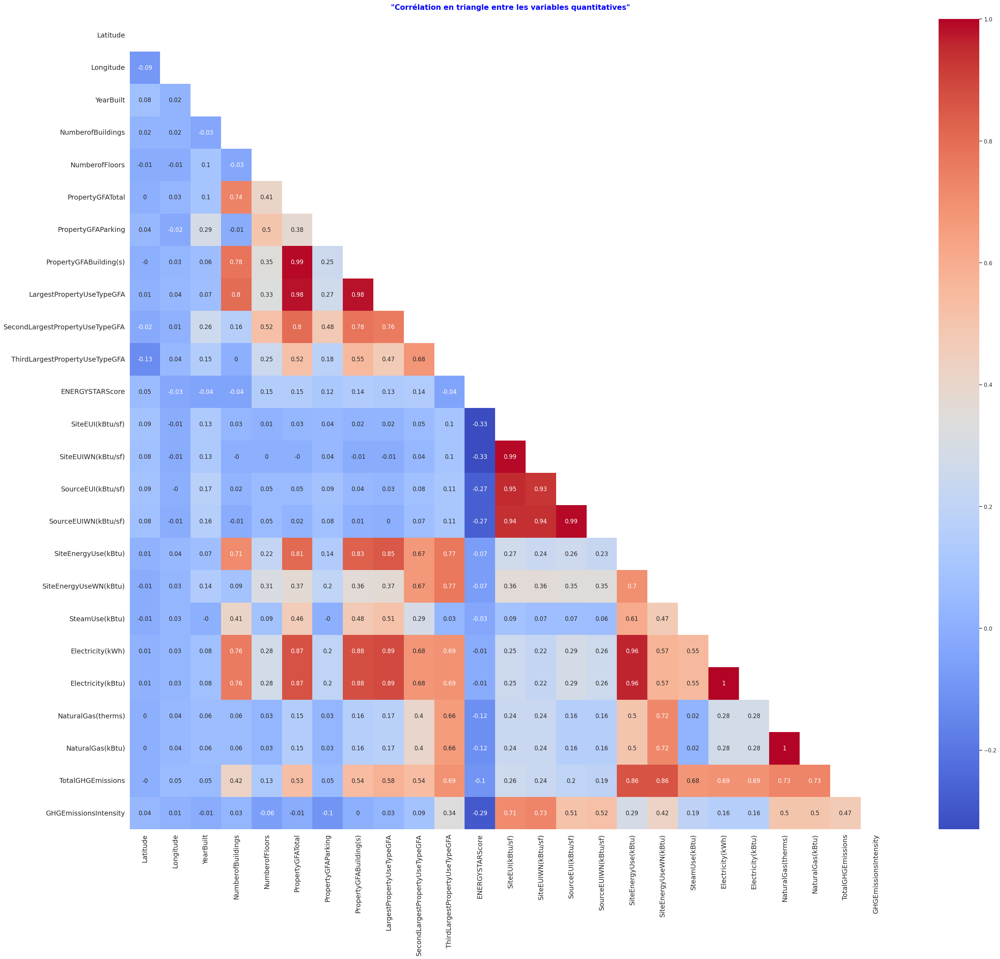

In [ ]:
# Visualisation de la corrélation en triangle
plt.figure(figsize=(35,30))
sns.heatmap(corr_matrix.round(2), annot=True, cmap='coolwarm',
            
#augmenter la taille du texte dans les annotations
annot_kws={"size": 12}, 

# masquer la moitié supérieure de la matrice de corrélation
mask = np.triu(np.ones_like(corr_matrix.round(2), dtype=np.bool)), 
ax=plt.gca())

plt.title("Corrélation en triangle entre les variables quantitatives")

# obtenir l'axe actuel
ax = plt.gca() 
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)
ax.set_title('"Corrélation en triangle entre les variables quantitatives"', fontsize=15, fontweight='bold', color='blue', pad=20)
plt.show()

>>>#### **Supprimons les variables trop corrélées entre elles (plus de 0.9)**

Ce code calcule la matrice de corrélation de ce sous-DataFrame et crée une liste de paires de variables corrélées à plus de 0.9. 

In [ ]:
# créer une liste de paires de variables corrélées à plus de 0.9
corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > 0.9:
            pair = (corr_matrix.columns[i], corr_matrix.columns[j])
            corr_pairs.append(pair)

In [ ]:
corr_pairs

[('PropertyGFABuilding(s)', 'PropertyGFATotal'),
 ('LargestPropertyUseTypeGFA', 'PropertyGFATotal'),
 ('LargestPropertyUseTypeGFA', 'PropertyGFABuilding(s)'),
 ('SiteEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)'),
 ('SourceEUI(kBtu/sf)', 'SiteEUI(kBtu/sf)'),
 ('SourceEUI(kBtu/sf)', 'SiteEUIWN(kBtu/sf)'),
 ('SourceEUIWN(kBtu/sf)', 'SiteEUI(kBtu/sf)'),
 ('SourceEUIWN(kBtu/sf)', 'SiteEUIWN(kBtu/sf)'),
 ('SourceEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)'),
 ('Electricity(kWh)', 'SiteEnergyUse(kBtu)'),
 ('Electricity(kBtu)', 'SiteEnergyUse(kBtu)'),
 ('Electricity(kBtu)', 'Electricity(kWh)'),
 ('NaturalGas(kBtu)', 'NaturalGas(therms)')]

Variables à reinsérer plus tard dans la dataframe, après l'opération de suppression des variables qui ont des corrélations élevées 

In [ ]:
var_electricity = df_data['Electricity(kWh)']

Enfin, il supprime les variables qui ont des corrélations élevées avec d'autres variables et affiche le DataFrame final qui contient les variables non corrélées à plus de 0.9.

In [ ]:
# supprimer les variables qui ont des corrélations élevées avec d'autres variables
for pair in corr_pairs:
    if pair[0] in df_vars_numeriques.columns:
        df_vars_numeriques.drop(pair[0], axis=1, inplace=True)

# afficher le DataFrame final
df_vars_numeriques.head()

<ipython-input-379-36affcff228a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vars_numeriques.drop(pair[0], axis=1, inplace=True)
<ipython-input-379-36affcff228a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vars_numeriques.drop(pair[0], axis=1, inplace=True)
<ipython-input-379-36affcff228a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_vars_numeriques.drop(pair[0], axis=1, inplace=True)
<ipython-input-379-36affcff2

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,GHGEmissionsIntensity
0,47.612,-122.338,1927,1.000,12,88434,0,NaN,NaN,60.000,81.700,7226362.500,7456910.000,2003882.000,12764.529,249.980,2.830
1,47.613,-122.334,1996,1.000,11,103566,15064,15064.000,4622.000,61.000,94.800,8387933.000,8664479.000,0.000,51450.816,295.860,2.860
2,47.614,-122.338,1969,1.000,41,956110,196718,NaN,NaN,43.000,96.000,72587024.000,73937112.000,21566554.000,14938.000,2089.280,2.190
3,47.614,-122.337,1926,1.000,10,61320,0,NaN,NaN,56.000,110.800,6794584.000,6946800.500,2214446.250,18112.131,286.430,4.670
4,47.614,-122.340,1980,1.000,18,175580,62000,68009.000,0.000,75.000,114.800,14172606.000,14656503.000,0.000,88039.984,505.010,2.880


In [ ]:
# calculer la matrice de corrélation
corr_matrix = df_vars_numeriques.corr()

**Vérifions que l'opération de suppression des variables fortement correlées fonctionne :**

<ipython-input-381-fecd166ca0fb>:9: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(corr_matrix, dtype=np.bool)),


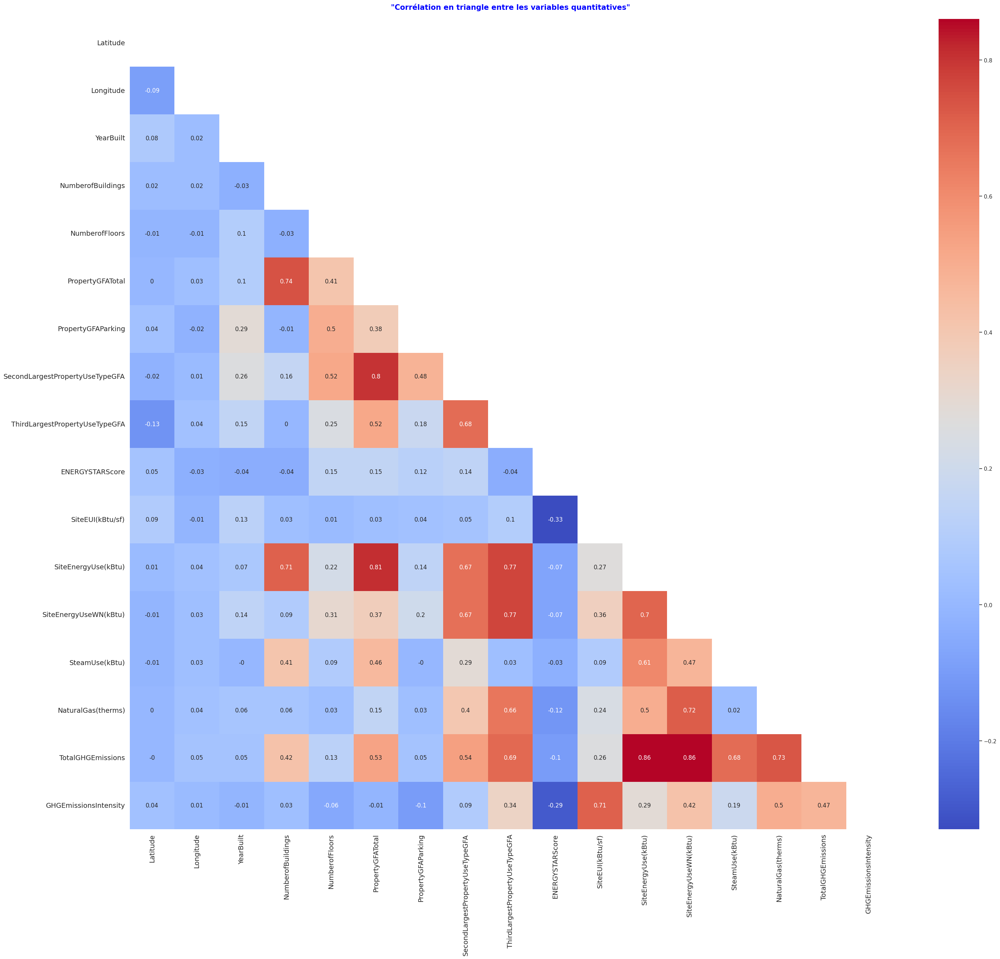

In [ ]:
# Visualisation de la corrélation en triangle
plt.figure(figsize=(35,30))
sns.heatmap(corr_matrix.round(2), annot=True, cmap='coolwarm',
            
#augmenter la taille du texte dans les annotations
annot_kws={"size": 12}, 

# masquer la moitié supérieure de la matrice de corrélation
mask = np.triu(np.ones_like(corr_matrix, dtype=np.bool)), 
ax=plt.gca())

plt.title("Corrélation en triangle entre les variables quantitatives")

# obtenir l'axe actuel
ax = plt.gca() 
ax.set_xticklabels(ax.get_xticklabels(), fontsize=14)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=14)
ax.set_title('"Corrélation en triangle entre les variables quantitatives"', fontsize=15, fontweight='bold', color='blue', pad=20)
plt.show()

>>### **Reconstrusons notre dataframe**

In [ ]:
# sélectionner les variables qualitatives
vars_quali = [col for col in df_data.columns if df_data[col].dtype in ['object']]
display(vars_quali)

print('\n')
# créer un sous-DataFrame avec les variables sélectionnées
df_vars_quali = df_data[vars_quali]
df_vars_quali.head()

['BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'City',
 'Neighborhood',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'SecondLargestPropertyUseType',
 'ThirdLargestPropertyUseType',
 'YearsENERGYSTARCertified']

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,YearsENERGYSTARCertified
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",Hotel,Parking,Restaurant,NaN
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool,NaN


In [ ]:
print(f'df_vars_quali : {df_vars_quali.shape}')
print('\n')
print(f'df_vars_numeriques : {df_vars_numeriques.shape}')

df_vars_quali : (1547, 10)


df_vars_numeriques : (1547, 17)


Fusionnons df_vars_quali, df_vars_numeriques et var_electricity

In [ ]:
merged_df = pd.merge(df_vars_quali, df_vars_numeriques, left_index=True, right_index=True)
df_merge = pd.merge(merged_df, var_electricity, left_index=True, right_index=True)

# Afficher le dataframe fusionné
df_merge.head()


,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType,YearsENERGYSTARCertified,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,GHGEmissionsIntensity,Electricity(kWh)
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,47.612,-122.338,1927,1.000,12,88434,0,NaN,NaN,60.000,81.700,7226362.500,7456910.000,2003882.000,12764.529,249.980,2.830,1156514.250
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",Hotel,Parking,Restaurant,NaN,47.613,-122.334,1996,1.000,11,103566,15064,15064.000,4622.000,61.000,94.800,8387933.000,8664479.000,0.000,51450.816,295.860,2.860,950425.188
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,47.614,-122.338,1969,1.000,41,956110,196718,NaN,NaN,43.000,96.000,72587024.000,73937112.000,21566554.000,14938.000,2089.280,2.190,14515435.000
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,Hotel,NaN,NaN,NaN,47.614,-122.337,1926,1.000,10,61320,0,NaN,NaN,56.000,110.800,6794584.000,6946800.500,2214446.250,18112.131,286.430,4.670,811525.312
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",Hotel,Parking,Swimming Pool,NaN,47.614,-122.340,1980,1.000,18,175580,62000,68009.000,0.000,75.000,114.800,14172606.000,14656503.000,0.000,88039.984,505.010,2.880,1573448.625


**Verification :**

In [ ]:
print(f'df_data : {df_data.shape}')
print('\n')
print(f'df_merged : {df_merge.shape}')

df_data : (1547, 35)


df_merged : (1547, 28)


>>### **Retirons les variables trop ressemblantes aux variables cibles**

Les variables cibles sont : 'SiteEnergyUse(kBtu)' et 'TotalGHGEmissions'

- 'SiteEUI(kBtu/sf)' et 'SiteEnergyUseWN(kBtu)' ressemblent à  'SiteEnergyUse(kBtu)'

- 'GHGEmissionsIntensity ressemble à 'TotalGHGEmissions'



Donc il serait préférable de les supprimer

In [ ]:
vars_to_drop = ['SiteEUI(kBtu/sf)', 'SiteEnergyUseWN(kBtu)', 'GHGEmissionsIntensity', 'LargestPropertyUseType', 'SecondLargestPropertyUseType', 
                'ThirdLargestPropertyUseType', 'YearsENERGYSTARCertified', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseTypeGFA']

df_final = df_merge.drop(vars_to_drop, axis=1)
df_final.head()

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,47.612,-122.338,1927,1.000,12,88434,0,60.000,7226362.500,2003882.000,12764.529,249.980,1156514.250
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",47.613,-122.334,1996,1.000,11,103566,15064,61.000,8387933.000,0.000,51450.816,295.860,950425.188
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,47.614,-122.338,1969,1.000,41,956110,196718,43.000,72587024.000,21566554.000,14938.000,2089.280,14515435.000
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,47.614,-122.337,1926,1.000,10,61320,0,56.000,6794584.000,2214446.250,18112.131,286.430,811525.312
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",47.614,-122.340,1980,1.000,18,175580,62000,75.000,14172606.000,0.000,88039.984,505.010,1573448.625


In [ ]:
print(f'- Taille de notre Dataframe final : {df_final.shape}')
print('\n')
print(f'- la liste des differentes variables de notre dataframe "df_data" : \n {df_final.columns}')

- Taille de notre Dataframe final : (1547, 19)


- la liste des differentes variables de notre dataframe "df_data" : 
 Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'NaturalGas(therms)', 'TotalGHGEmissions',
       'Electricity(kWh)'],
      dtype='object')


>>### **Nettoyons les valeurs NaN**

In [ ]:
df_final.isna().sum()

BuildingType                   0
PrimaryPropertyType            0
PropertyName                   0
City                           0
Neighborhood                   0
ListOfAllPropertyUseTypes      0
Latitude                       0
Longitude                      0
YearBuilt                      0
NumberofBuildings              0
NumberofFloors                 0
PropertyGFATotal               0
PropertyGFAParking             0
ENERGYSTARScore              550
SiteEnergyUse(kBtu)            0
SteamUse(kBtu)                 0
NaturalGas(therms)             0
TotalGHGEmissions              0
Electricity(kWh)               0
dtype: int64

>>>#### Imputation par mediane de la variable ENERGYSTARScore

Sélectionnons la variable à modifier

In [ ]:
energy_score = df_final["ENERGYSTARScore"]

Calculons la médiane qui servira d'imputeur

In [ ]:
median_score = energy_score.median()

Remplaçons les valeurs manquantes par la médiane

In [ ]:
energy_score.fillna(median_score, inplace=True)

**Verification :**

In [ ]:
df_final.isna().sum()

BuildingType                 0
PrimaryPropertyType          0
PropertyName                 0
City                         0
Neighborhood                 0
ListOfAllPropertyUseTypes    0
Latitude                     0
Longitude                    0
YearBuilt                    0
NumberofBuildings            0
NumberofFloors               0
PropertyGFATotal             0
PropertyGFAParking           0
ENERGYSTARScore              0
SiteEnergyUse(kBtu)          0
SteamUse(kBtu)               0
NaturalGas(therms)           0
TotalGHGEmissions            0
Electricity(kWh)             0
dtype: int64

>>### **Nettoyons les outliers**

In [ ]:
df_final.describe()

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
count,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000,1547.000
mean,47.616,-122.334,1961.644,1.179,4.279,121366.525,13851.285,66.254,8863729.601,551539.347,20396.145,193.720,1800338.163
std,0.047,0.023,32.898,3.040,6.782,306390.491,43734.542,23.404,31315465.832,5720334.368,97136.683,779.345,6306429.688
min,47.510,-122.412,1900.000,0.000,0.000,11285.000,0.000,1.000,57133.199,0.000,0.000,-0.800,-33826.801
25%,47.588,-122.343,1930.000,1.000,1.000,28842.500,0.000,60.000,1249842.938,0.000,0.000,20.650,214082.555
50%,47.613,-122.333,1966.000,1.000,2.000,48139.000,0.000,71.000,2729167.750,0.000,4902.260,49.900,511195.594
75%,47.649,-122.323,1989.000,1.000,4.000,107751.000,0.000,79.000,7298149.250,0.000,15309.366,147.315,1543201.000
max,47.734,-122.262,2015.000,111.000,99.000,9320156.000,512608.000,100.000,873923712.000,134943456.000,2979090.000,16870.980,192577488.000


>>>#### **Inspectons les présumés outliers :**

In [ ]:
#calculer les quartiles Q1 et Q3
Q1 = df_final['SiteEnergyUse(kBtu)'].quantile(0.25)
Q3 = df_final['SiteEnergyUse(kBtu)'].quantile(0.75)

#calculer l'intervalle interquartile (IQR)
IQR = Q3 - Q1

#définir les bornes inférieure et supérieure pour détecter les outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR


In [ ]:
#filtrer les valeurs qui sont en dehors de l'intervalle [lower_bound, upper_bound]
outliers = df_final[(df_final['SiteEnergyUse(kBtu)'] < lower_bound) | (df_final['SiteEnergyUse(kBtu)'] > upper_bound)]
outliers

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,47.614,-122.338,1969,1.000,41,956110,196718,43.000,72587024.000,21566554.000,14938.000,2089.280,14515435.000
11,NonResidential,Hotel,5679-W Seattle,Seattle,DOWNTOWN,Hotel,47.607,-122.333,1998,1.000,25,333176,61161,36.000,26941110.000,5999360.500,28586.998,740.970,5299838.500
13,NonResidential,Hotel,Crowne Plaza Hotel Seattle,Seattle,DOWNTOWN,"Hotel, Parking",47.608,-122.332,1980,1.000,33,315952,57600,58.000,22325364.000,4337738.500,40834.398,648.620,4075083.000
15,Nonresidential COS,Other,The Seattle Public Library - Central Library,Seattle,DOWNTOWN,"Data Center, Library, Parking",47.606,-122.333,2004,1.000,11,412000,57000,71.000,18588860.000,737559.500,0.000,181.380,5231916.000
17,NonResidential,Hotel,Renaissance Seattle Hotel,Seattle,DOWNTOWN,"Hotel, Parking",47.607,-122.331,1983,1.000,28,416281,85000,31.000,33556756.000,0.000,123314.750,802.890,6220773.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3274,Campus,University,University of Washington - Seattle Campus,Seattle,NORTHEAST,College/University,47.656,-122.310,1900,111.000,0,9320156,0,71.000,873923712.000,84985240.000,0.000,11140.560,192577488.000
3277,NonResidential,University,Computer Science and Electrical Engineering,Seattle,NORTHEAST,College/University,47.654,-122.306,1998,1.000,6,203030,0,71.000,51168308.000,0.000,0.000,199.480,8386463.500
3281,NonResidential,Large Office,Amazon Phase VI,Seattle,LAKE UNION,"Office, Parking",47.624,-122.339,2014,1.000,6,427181,0,99.000,16371039.000,0.000,21579.984,213.700,4165603.500
3317,NonResidential,Large Office,Dexter Station,Seattle,MAGNOLIA / QUEEN ANNE,"Office, Parking, Restaurant",47.629,-122.343,2015,1.000,10,513816,0,71.000,18760766.000,0.000,18076.549,214.190,4968672.000


In [ ]:
df_final[df_final['SiteEnergyUse(kBtu)'] == df_final['SiteEnergyUse(kBtu)'].max()]

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
3274,Campus,University,University of Washington - Seattle Campus,Seattle,NORTHEAST,College/University,47.656,-122.310,1900,111.000,0,9320156,0,71.000,873923712.000,84985240.000,0.000,11140.560,192577488.000


>>>>##### **Inspectons les presumés outliers identifier**

In [ ]:
outliers['PrimaryPropertyType'].value_counts()

Large Office                   63
Other                          33
Mixed Use Property             16
Hotel                          13
Medical Office                 11
Hospital                        9
University                      8
Retail Store                    6
Laboratory                      6
Senior Care Community           5
Warehouse                       1
Distribution Center             1
Refrigerated Warehouse          1
Supermarket / Grocery Store     1
Small- and Mid-Sized Office     1
Name: PrimaryPropertyType, dtype: int64

In [ ]:
outliers['ListOfAllPropertyUseTypes'].value_counts()

Office, Parking                                                     18
Other                                                               10
Hotel                                                                6
Office                                                               6
College/University                                                   6
                                                                    ..
Office, Other - Education, Parking                                   1
Office, Other - Restaurant/Bar, Parking                              1
Office, Other - Restaurant/Bar, Retail Store, Single Family Home     1
Laboratory, Office, Other, Parking                                   1
Data Center, Laboratory, Museum, Office, Other, Parking              1
Name: ListOfAllPropertyUseTypes, Length: 98, dtype: int64

>>>>>###### Inspection des Hospital

In [ ]:
outliers_Hospital = outliers.loc[outliers['ListOfAllPropertyUseTypes'].str.contains('Hospital'), :]
outliers_Hospital

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
98,NonResidential,Hospital,Swedish Ballard,Seattle,BALLARD,"Hospital (General Medical & Surgical), Parking",47.667,-122.380,1954,4.000,5,285333,0,14.000,68090728.000,0.000,328535.125,1990.500,10327434.000
124,NonResidential,Hospital,Seattle Children's Hospital Main Campus,Seattle,NORTHEAST,Hospital (General Medical & Surgical),47.662,-122.281,1953,6.000,10,879000,0,10.000,253832464.000,0.000,1381912.375,8145.520,33892500.000
167,NonResidential,Hospital,Swedish Cherry Hill,Seattle,CENTRAL,"Hospital (General Medical & Surgical), Parking",47.607,-122.310,1990,6.000,5,597519,0,34.000,143423024.000,0.000,846680.938,4906.330,17220084.000
170,NonResidential,Hospital,Harborview Medical Center,Seattle,EAST,"Hospital (General Medical & Surgical), Parking",47.604,-122.324,2000,9.000,8,1158691,0,29.000,293090784.000,122575032.000,18321.291,10734.570,49438336.000
355,NonResidential,Hospital,SCCA,Seattle,LAKE UNION,Hospital (General Medical & Surgical),47.627,-122.330,2000,1.000,7,351530,150455,23.000,42709624.000,0.000,159277.281,1032.630,7849323.500
618,NonResidential,Hospital,Swedish First Hill,Seattle,EAST,"Hospital (General Medical & Surgical), Parking",47.609,-122.322,1994,7.000,14,1765970,0,54.000,291614432.000,134943456.000,173161.203,12307.160,40842564.000
1672,NonResidential,Hospital,Main Hospital - All Wings,Seattle,NORTHWEST,"Hospital (General Medical & Surgical), Parking",47.714,-122.337,1966,8.000,1,415632,0,85.000,98960776.000,0.000,560966.125,3278.110,12562766.000
1690,NonResidential,Medical Office,Central Campus,Seattle,EAST,"Medical Office, Other/Specialty Hospital, Outp...",47.620,-122.312,1964,1.000,3,591981,0,60.000,102673696.000,0.000,546713.938,3238.240,14068667.000
3182,NonResidential,Other,VM Seattle Hospital & Medical Center - Jones P...,Seattle,EAST,"Hospital (General Medical & Surgical), Other",47.610,-122.327,2012,1.000,7,267470,0,71.000,42584028.000,18547858.000,0.000,1597.560,6974182.500
3187,NonResidential,Hospital,Seattle Children's Hospital Building Hope,Seattle,NORTHEAST,Hospital (General Medical & Surgical),47.662,-122.284,2013,1.000,8,330000,0,58.000,57764408.000,0.000,300613.250,1789.690,8119308.500


In [ ]:
surface_bâtiment_et_parking = outliers_Hospital[['ListOfAllPropertyUseTypes', 'NumberofFloors','PropertyGFATotal', 'SiteEnergyUse(kBtu)']]
surface_bâtiment_et_parking

,ListOfAllPropertyUseTypes,NumberofFloors,PropertyGFATotal,SiteEnergyUse(kBtu)
98,"Hospital (General Medical & Surgical), Parking",5,285333,68090728.000
124,Hospital (General Medical & Surgical),10,879000,253832464.000
167,"Hospital (General Medical & Surgical), Parking",5,597519,143423024.000
170,"Hospital (General Medical & Surgical), Parking",8,1158691,293090784.000
355,Hospital (General Medical & Surgical),7,351530,42709624.000
618,"Hospital (General Medical & Surgical), Parking",14,1765970,291614432.000
1672,"Hospital (General Medical & Surgical), Parking",1,415632,98960776.000
1690,"Medical Office, Other/Specialty Hospital, Outp...",3,591981,102673696.000
3182,"Hospital (General Medical & Surgical), Other",7,267470,42584028.000
3187,Hospital (General Medical & Surgical),8,330000,57764408.000


Les index des outliers avérés sont :

- 98
- 3264


>>>>>###### Inspection des College/University 

In [ ]:
outliers_College_University = outliers.loc[outliers['ListOfAllPropertyUseTypes'].str.contains('College/University'), :]
outliers_College_University

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
105,Campus,University,SSCC MAIN CAMPUS,Seattle,DELRIDGE,College/University,47.547,-122.353,1970,27.000,2,441071,0,71.000,38301744.000,0.000,129871.664,866.230,7419277.500
128,Campus,University,NSCC MAIN CAMPUS,Seattle,NORTHWEST,College/University,47.699,-122.334,1970,11.000,2,694072,111625,71.000,35891484.000,0.000,24406.479,362.820,9803878.000
270,NonResidential,Large Office,2601 Elliott Avenue,Seattle,DOWNTOWN,"College/University, Office, Restaurant",47.614,-122.353,1916,1.000,6,350310,0,90.000,18102026.000,0.000,21276.564,224.360,4681819.000
1494,Campus,University,Entire Campus,Seattle,EAST,"College/University, Parking",47.611,-122.317,1939,1.000,2,2200000,0,71.000,114648520.000,0.000,529756.938,3243.480,18075270.000
2324,NonResidential,University,Student Union Building / Royal Brougham Pavilion,Seattle,MAGNOLIA / QUEEN ANNE,"College/University, Restaurant",47.650,-122.362,1959,1.000,2,122679,0,71.000,16378152.000,0.000,102748.352,588.250,1788779.625
2325,Campus,University,5th Avenue Master Meter,Seattle,MAGNOLIA / QUEEN ANNE,College/University,47.650,-122.362,1945,14.000,2,537000,0,71.000,90609640.000,0.000,679905.375,3768.660,6629278.000
3261,NonResidential,University,SCCC MAIN BROADWAY/EDISON,Seattle,EAST,College/University,47.617,-122.322,1925,1.000,3,428347,0,71.000,37022180.000,13556219.000,15353.410,1280.810,6427496.500
3274,Campus,University,University of Washington - Seattle Campus,Seattle,NORTHEAST,College/University,47.656,-122.310,1900,111.000,0,9320156,0,71.000,873923712.000,84985240.000,0.000,11140.560,192577488.000
3277,NonResidential,University,Computer Science and Electrical Engineering,Seattle,NORTHEAST,College/University,47.654,-122.306,1998,1.000,6,203030,0,71.000,51168308.000,0.000,0.000,199.480,8386463.500


In [ ]:
surface_bâtiment_et_parking = outliers_College_University[['ListOfAllPropertyUseTypes', 'NumberofFloors','PropertyGFATotal', 'SiteEnergyUse(kBtu)']]
surface_bâtiment_et_parking

,ListOfAllPropertyUseTypes,NumberofFloors,PropertyGFATotal,SiteEnergyUse(kBtu)
105,College/University,2,441071,38301744.000
128,College/University,2,694072,35891484.000
270,"College/University, Office, Restaurant",6,350310,18102026.000
1494,"College/University, Parking",2,2200000,114648520.000
2324,"College/University, Restaurant",2,122679,16378152.000
2325,College/University,2,537000,90609640.000
3261,College/University,3,428347,37022180.000
3274,College/University,0,9320156,873923712.000
3277,College/University,6,203030,51168308.000


Les index des outliers avérés sont :

- 2325

>>>>>###### Inspection des Hotel

In [ ]:
outliers_Hotel = outliers.loc[outliers['ListOfAllPropertyUseTypes'].str.contains('Hotel'), :]
outliers_Hotel

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,47.614,-122.338,1969,1.000,41,956110,196718,43.000,72587024.000,21566554.000,14938.000,2089.280,14515435.000
11,NonResidential,Hotel,5679-W Seattle,Seattle,DOWNTOWN,Hotel,47.607,-122.333,1998,1.000,25,333176,61161,36.000,26941110.000,5999360.500,28586.998,740.970,5299838.500
13,NonResidential,Hotel,Crowne Plaza Hotel Seattle,Seattle,DOWNTOWN,"Hotel, Parking",47.608,-122.332,1980,1.000,33,315952,57600,58.000,22325364.000,4337738.500,40834.398,648.620,4075083.000
17,NonResidential,Hotel,Renaissance Seattle Hotel,Seattle,DOWNTOWN,"Hotel, Parking",47.607,-122.331,1983,1.000,28,416281,85000,31.000,33556756.000,0.000,123314.750,802.890,6220773.000
49,NonResidential,Hotel,Sheraton Seattle Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",47.611,-122.333,1982,1.000,34,994212,146694,63.000,80469216.000,11598686.000,233249.922,2451.580,13348631.000
68,NonResidential,Hotel,Residence Inn Seattle - Lake Union,Seattle,LAKE UNION,"Hotel, Parking",47.626,-122.333,1990,1.000,7,282863,44766,37.000,19459304.000,0.000,84786.508,526.850,3218245.000
166,NonResidential,Hotel,Grand Hyatt Seattle,Seattle,DOWNTOWN,"Hotel, Other, Parking, Restaurant, Retail Store",47.613,-122.333,1999,1.000,0,934292,0,71.000,65047284.000,0.000,256831.625,1638.460,11536962.000
194,NonResidential,Hotel,Edgewater Seattle,Seattle,DOWNTOWN,Hotel,47.612,-122.351,1961,1.000,4,122309,0,8.000,25453690.000,0.000,191311.547,1060.130,1853028.500
196,NonResidential,Hotel,337v2-Seattle Waterfront Marriott,Seattle,DOWNTOWN,Hotel,47.611,-122.347,2003,1.000,8,254273,38800,29.000,26659244.000,0.000,128957.000,780.840,4033863.500
262,NonResidential,Hotel,Fairmont Olympic Seattle,Seattle,DOWNTOWN,"Hotel, Swimming Pool",47.608,-122.334,1923,1.000,12,542305,0,45.000,56485204.000,28438884.000,39682.113,2573.750,7056889.500


In [ ]:
surface_bâtiment_et_parking = outliers_Hotel[['ListOfAllPropertyUseTypes', 'NumberofFloors','PropertyGFATotal', 'SiteEnergyUse(kBtu)']]
surface_bâtiment_et_parking

,ListOfAllPropertyUseTypes,NumberofFloors,PropertyGFATotal,SiteEnergyUse(kBtu)
2,Hotel,41,956110,72587024.000
11,Hotel,25,333176,26941110.000
13,"Hotel, Parking",33,315952,22325364.000
17,"Hotel, Parking",28,416281,33556756.000
49,"Hotel, Parking, Swimming Pool",34,994212,80469216.000
68,"Hotel, Parking",7,282863,19459304.000
166,"Hotel, Other, Parking, Restaurant, Retail Store",0,934292,65047284.000
194,Hotel,4,122309,25453690.000
196,Hotel,8,254273,26659244.000
262,"Hotel, Swimming Pool",12,542305,56485204.000


>>>>>###### Inspection des data center

In [ ]:
outliers_Data_center = outliers.loc[outliers['ListOfAllPropertyUseTypes'].str.contains('Data Center'), :]
outliers_Data_center

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
15,Nonresidential COS,Other,The Seattle Public Library - Central Library,Seattle,DOWNTOWN,"Data Center, Library, Parking",47.606,-122.333,2004,1.000,11,412000,57000,71.000,18588860.000,737559.500,0.000,181.380,5231916.000
230,NonResidential,Large Office,Fourth & Madison,Seattle,DOWNTOWN,"Convenience Store without Gas Station, Data Ce...",47.605,-122.333,2002,1.000,37,1052469,164420,93.000,41213584.000,0.000,0.000,287.320,12079009.000
234,Nonresidential COS,Large Office,Justice Center,Seattle,DOWNTOWN,"Data Center, Office, Other",47.604,-122.329,2001,1.000,14,310490,0,71.000,21169502.000,0.000,50454.648,380.370,4725684.500
240,NonResidential,Other,UW Tower Data Center,Seattle,NORTHEAST,Data Center,47.661,-122.315,1969,1.000,5,36000,0,96.000,30038490.000,0.000,0.000,209.410,8803777.000
301,Campus,Mixed Use Property,Securities Building Campus,Seattle,DOWNTOWN,"Data Center, Office, Parking, Restaurant, Reta...",47.612,-122.339,1913,3.000,10,258497,0,71.000,20779796.000,3902781.250,0.000,418.900,4946369.500
308,NonResidential,Mixed Use Property,Fisher Plaza - East Building,Seattle,LAKE UNION,"Data Center, Office, Parking, Performing Arts,...",47.619,-122.349,2001,1.000,6,378443,177660,100.000,55073120.000,0.000,15665.939,456.220,15681864.000
309,NonResidential,Mixed Use Property,Fisher Plaza - West Building,Seattle,LAKE UNION,"Data Center, Financial Office, Office, Other, ...",47.619,-122.349,2001,1.000,6,213834,104922,100.000,75073888.000,0.000,1565.250,530.590,21957020.000
328,NonResidential,Large Office,1000 Denny Building,Seattle,LAKE UNION,"Data Center, Office, Other, Restaurant",47.619,-122.337,1929,1.000,8,287819,0,71.000,48406556.000,0.000,2515.110,349.070,14113435.000
373,NonResidential,Mixed Use Property,Seattle Art Museum,Seattle,DOWNTOWN,"Data Center, Library, Non-Refrigerated Warehou...",47.607,-122.338,1991,1.000,6,154660,0,71.000,52960796.000,17548416.000,4755.600,1623.340,10239394.000
489,NonResidential,Large Office,505 Union Station - SEDO,Seattle,DOWNTOWN,"Data Center, Office, Restaurant",47.598,-122.328,2000,1.000,11,312512,0,71.000,25747022.000,0.000,1278.550,185.390,7508547.500


In [ ]:
outliers_Data_center['ListOfAllPropertyUseTypes'].tolist()

['Data Center, Library, Parking',
 'Convenience Store without Gas Station, Data Center, Financial Office, Fitness Center/Health Club/Gym, Office, Other, Parking, Personal Services (Health/Beauty, Dry Cleaning, etc), Restaurant',
 'Data Center, Office, Other',
 'Data Center',
 'Data Center, Office, Parking, Restaurant, Retail Store',
 'Data Center, Office, Parking, Performing Arts, Restaurant, Retail Store',
 'Data Center, Financial Office, Office, Other, Parking, Restaurant',
 'Data Center, Office, Other, Restaurant',
 'Data Center, Library, Non-Refrigerated Warehouse, Office, Other - Entertainment/Public Assembly, Other - Recreation, Other - Services, Restaurant, Social/Meeting Hall',
 'Data Center, Office, Restaurant',
 'Data Center, Financial Office, Office, Parking, Restaurant',
 'Data Center, Office, Parking',
 'Data Center, Office',
 'Data Center, Office, Other, Parking',
 'Data Center, Office',
 'Data Center, Medical Office, Office, Parking, Restaurant',
 'Data Center, Non-Refri

In [ ]:
surface_bâtiment_et_parking = outliers_Data_center[['ListOfAllPropertyUseTypes', 'NumberofFloors', 'PropertyGFATotal', 'SiteEnergyUse(kBtu)']]
surface_bâtiment_et_parking

,ListOfAllPropertyUseTypes,NumberofFloors,PropertyGFATotal,SiteEnergyUse(kBtu)
15,"Data Center, Library, Parking",11,412000,18588860.000
230,"Convenience Store without Gas Station, Data Ce...",37,1052469,41213584.000
234,"Data Center, Office, Other",14,310490,21169502.000
240,Data Center,5,36000,30038490.000
301,"Data Center, Office, Parking, Restaurant, Reta...",10,258497,20779796.000
308,"Data Center, Office, Parking, Performing Arts,...",6,378443,55073120.000
309,"Data Center, Financial Office, Office, Other, ...",6,213834,75073888.000
328,"Data Center, Office, Other, Restaurant",8,287819,48406556.000
373,"Data Center, Library, Non-Refrigerated Warehou...",6,154660,52960796.000
489,"Data Center, Office, Restaurant",11,312512,25747022.000


In [ ]:
#NumberofFloors_inf_egal_6 = surface_bâtiment_et_parking.loc[surface_bâtiment_et_parking['NumberofFloors'] > 6, :]
#NumberofFloors_inf_egal_6

In [ ]:
#PropertyGFATotal_inf_egal_412000 = surface_bâtiment_et_parking.loc[surface_bâtiment_et_parking['PropertyGFATotal'] <= 412000, :]
#PropertyGFATotal_inf_egal_412000

Les index des outliers avérés sont :

- 309
- 489
- 3203

>>>>>###### Inspection des others

In [ ]:
outliers_Others = outliers.loc[outliers['ListOfAllPropertyUseTypes'] == 'Other', :]
outliers_Others

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
21,NonResidential,Other,King County Correctional Facility,Seattle,DOWNTOWN,Other,47.604,-122.328,1985,1.000,19,385274,0,71.000,47859812.000,0.000,296021.500,1699.450,5351014.500
69,Nonresidential COS,Other,Key Arena,Seattle,MAGNOLIA / QUEEN ANNE,Other,47.622,-122.354,1962,1.000,1,389000,0,71.000,23658978.000,6093150.000,6886.800,607.410,4226010.000
71,Nonresidential COS,Other,Armory,Seattle,MAGNOLIA / QUEEN ANNE,Other,47.622,-122.354,1938,1.000,5,396085,0,71.000,20955026.000,9763690.000,0.000,804.200,2125534.750
75,Nonresidential COS,Other,McCaw Hall,Seattle,MAGNOLIA / QUEEN ANNE,Other,47.624,-122.351,1928,1.000,2,262048,0,71.000,20723248.000,5137220.000,0.000,490.730,3960341.750
119,NonResidential,Other,Jack R. McDonald Building,Seattle,DOWNTOWN,Other,47.616,-122.334,2004,1.000,11,299070,68432,71.000,65336980.000,0.000,346853.312,2055.820,8983483.000
187,NonResidential,Other,1122 3rd Ave,Seattle,DOWNTOWN,Other,47.607,-122.335,1955,1.000,15,230880,0,71.000,62197176.000,0.000,0.000,433.600,18228948.000
195,Campus,Other,P66 Bell Harbor International Conference Cente...,Seattle,DOWNTOWN,Other,47.611,-122.349,1995,4.000,3,215476,0,71.000,24017770.000,0.000,102289.164,639.390,4041281.750
303,NonResidential,Other,Benaroya Research Institute at Virginia Mason,Seattle,EAST,Other,47.610,-122.329,1999,1.000,5,206950,97400,71.000,19295226.000,1631750.250,0.000,249.090,5176868.500
1276,NonResidential,Other,Pacific Science Center,Seattle,MAGNOLIA / QUEEN ANNE,Other,47.620,-122.351,1962,1.000,1,155795,0,71.000,17673018.000,0.000,28744.646,255.830,4337207.500
1862,Campus,Other,FT C15 Fishermen's Center,Seattle,MAGNOLIA / QUEEN ANNE,Other,47.656,-122.381,1955,23.000,1,260241,0,71.000,34012980.000,0.000,71183.617,565.550,7882361.000


In [ ]:
surface_bâtiment_et_parking = outliers_Others[['ListOfAllPropertyUseTypes', 'NumberofFloors','PropertyGFATotal', 'SiteEnergyUse(kBtu)']]
surface_bâtiment_et_parking

,ListOfAllPropertyUseTypes,NumberofFloors,PropertyGFATotal,SiteEnergyUse(kBtu)
21,Other,19,385274,47859812.000
69,Other,1,389000,23658978.000
71,Other,5,396085,20955026.000
75,Other,2,262048,20723248.000
119,Other,11,299070,65336980.000
187,Other,15,230880,62197176.000
195,Other,3,215476,24017770.000
303,Other,5,206950,19295226.000
1276,Other,1,155795,17673018.000
1862,Other,1,260241,34012980.000


Les index des outliers avérés sont :

- 187
- 119



>>>>##### **Supprimons les outliers averés de la dataframe**

Récuperons les index des outliers avérés de mon dataframe :

In [ ]:
outlier_index = [187, 119, 309, 489, 3203, 2325, 98, 3264]

In [ ]:
outlier_data = df_final.loc[outlier_index]
outlier_data

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
187,NonResidential,Other,1122 3rd Ave,Seattle,DOWNTOWN,Other,47.607,-122.335,1955,1.000,15,230880,0,71.000,62197176.000,0.000,0.000,433.600,18228948.000
119,NonResidential,Other,Jack R. McDonald Building,Seattle,DOWNTOWN,Other,47.616,-122.334,2004,1.000,11,299070,68432,71.000,65336980.000,0.000,346853.312,2055.820,8983483.000
309,NonResidential,Mixed Use Property,Fisher Plaza - West Building,Seattle,LAKE UNION,"Data Center, Financial Office, Office, Other, ...",47.619,-122.349,2001,1.000,6,213834,104922,100.000,75073888.000,0.000,1565.250,530.590,21957020.000
489,NonResidential,Large Office,505 Union Station - SEDO,Seattle,DOWNTOWN,"Data Center, Office, Restaurant",47.598,-122.328,2000,1.000,11,312512,0,71.000,25747022.000,0.000,1278.550,185.390,7508547.500
3203,NonResidential,Other,2020 Fifth Avenue Dat Center,Seattle,DOWNTOWN,"Data Center, Parking",47.614,-122.340,1975,1.000,7,90679,35120,100.000,41680640.000,0.000,0.000,290.570,12215895.000
2325,Campus,University,5th Avenue Master Meter,Seattle,MAGNOLIA / QUEEN ANNE,College/University,47.650,-122.362,1945,14.000,2,537000,0,71.000,90609640.000,0.000,679905.375,3768.660,6629278.000
98,NonResidential,Hospital,Swedish Ballard,Seattle,BALLARD,"Hospital (General Medical & Surgical), Parking",47.667,-122.380,1954,4.000,5,285333,0,14.000,68090728.000,0.000,328535.125,1990.500,10327434.000
3264,NonResidential,Hospital,Virginia Mason Medical Center - 2149,Seattle,EAST,Hospital (General Medical & Surgical),47.610,-122.328,1920,1.000,8,374466,0,74.000,163945984.000,73885472.000,0.000,6330.910,26395222.000


In [ ]:
outlier_data.shape

(8, 19)

In [ ]:
df_final.shape

(1547, 19)

Supprimons les outliers avérés

In [ ]:
df_final.drop(outlier_index, inplace=True)


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1539 entries, 0 to 3375
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   BuildingType               1539 non-null   object 
 1   PrimaryPropertyType        1539 non-null   object 
 2   PropertyName               1539 non-null   object 
 3   City                       1539 non-null   object 
 4   Neighborhood               1539 non-null   object 
 5   ListOfAllPropertyUseTypes  1539 non-null   object 
 6   Latitude                   1539 non-null   float64
 7   Longitude                  1539 non-null   float64
 8   YearBuilt                  1539 non-null   int64  
 9   NumberofBuildings          1539 non-null   float64
 10  NumberofFloors             1539 non-null   int64  
 11  PropertyGFATotal           1539 non-null   int64  
 12  PropertyGFAParking         1539 non-null   int64  
 13  ENERGYSTARScore            1539 non-null   float

>>>>>###### **Vérifions que l'opération fonctionnent**

**Avant le cleaning des outilers**

In [ ]:
df_final.describe()

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
count,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000
mean,47.616,-122.333,1961.604,1.170,4.259,120474.490,13787.826,66.227,8524696.319,506397.594,19619.687,184.599,1736762.385
std,0.047,0.023,32.913,3.030,6.789,306810.891,43753.946,23.393,30914757.451,5421470.890,95230.762,757.089,6241250.665
min,47.510,-122.412,1900.000,0.000,0.000,11285.000,0.000,1.000,57133.199,0.000,0.000,-0.800,-33826.801
25%,47.588,-122.343,1930.000,1.000,1.000,28814.000,0.000,60.000,1245555.625,0.000,0.000,20.395,213479.297
50%,47.613,-122.333,1966.000,1.000,2.000,48001.000,0.000,71.000,2701872.000,0.000,4910.900,49.620,499824.906
75%,47.649,-122.323,1989.000,1.000,4.000,105080.500,0.000,79.000,7233318.250,0.000,15297.811,144.950,1504930.562
max,47.734,-122.262,2015.000,111.000,99.000,9320156.000,512608.000,100.000,873923712.000,134943456.000,2979090.000,16870.980,192577488.000


**Après le cleaning des outilers**

In [ ]:
df_final.describe()

,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
count,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000,1539.000
mean,47.616,-122.333,1961.604,1.170,4.259,120474.490,13787.826,66.227,8524696.319,506397.594,19619.687,184.599,1736762.385
std,0.047,0.023,32.913,3.030,6.789,306810.891,43753.946,23.393,30914757.451,5421470.890,95230.762,757.089,6241250.665
min,47.510,-122.412,1900.000,0.000,0.000,11285.000,0.000,1.000,57133.199,0.000,0.000,-0.800,-33826.801
25%,47.588,-122.343,1930.000,1.000,1.000,28814.000,0.000,60.000,1245555.625,0.000,0.000,20.395,213479.297
50%,47.613,-122.333,1966.000,1.000,2.000,48001.000,0.000,71.000,2701872.000,0.000,4910.900,49.620,499824.906
75%,47.649,-122.323,1989.000,1.000,4.000,105080.500,0.000,79.000,7233318.250,0.000,15297.811,144.950,1504930.562
max,47.734,-122.262,2015.000,111.000,99.000,9320156.000,512608.000,100.000,873923712.000,134943456.000,2979090.000,16870.980,192577488.000


>## **Visualisation des données sur carte géographique**

installons et importons la librairie folium

In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import folium

In [ ]:
from folium.plugins import HeatMap

In [ ]:
df_final.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'NaturalGas(therms)', 'TotalGHGEmissions',
       'Electricity(kWh)'],
      dtype='object')

In [ ]:
# Sélectionner les colonnes nécessaires
map_df = df_final[['Latitude', 'Longitude', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'Electricity(kWh)']]

>>### Map avec pop-up

Créons la carte de base:

In [ ]:
# Créer la carte centrée sur la première latitude et longitude du dataframe
map = folium.Map(location=[map_df['Latitude'].iloc[0], map_df['Longitude'].iloc[0]], zoom_start=12)

Ajoutons des marqueurs à la carte pour représenter les données:

In [ ]:
# Ajouter des marqueurs pour chaque ligne du dataframe
for index, row in map_df.iterrows():
    # Créer un popup qui affiche les valeurs de chaque colonne
    popup = folium.Popup(f"Site Energy Use: {row['SiteEnergyUse(kBtu)']}<br>Electricity (kWh): {row['Electricity(kWh)']}<br>Total GHG Emissions: {row['TotalGHGEmissions']}")
    
    # Ajouter le marqueur à la carte
    folium.Marker(location=[row['Latitude'], row['Longitude']], popup=popup).add_to(map)


Affichons la carte:

In [ ]:
map

>>### Heatmap

>>>#### **La carte de chaleur pour la concentration d'énergie**

In [ ]:
# Création de la carte de chaleur pour la concentration d'énergie
mapEnergie = folium.Map(location=[map_df['Latitude'].mean(), map_df['Longitude'].mean()], zoom_start=11.5, tiles='Stamen Terrain')
heat_data_energie = map_df[['Latitude', 'Longitude', 'SiteEnergyUse(kBtu)']].values.tolist()
folium.plugins.HeatMap(heat_data_energie, gradient={0.2: 'blue', 0.4: 'green', 0.6: 'yellow', 1: 'red'}).add_to(mapEnergie)

In [ ]:
# Affichage de la carte de chaleur pour la concentration d'énergie
mapEnergie

>>>#### **La carte de chaleur pour la concentration d'émissions de CO2**

In [ ]:
# Création de la carte de chaleur pour la concentration d'émissions de CO2
mapCO2 = folium.Map(location=[map_df['Latitude'].mean(), map_df['Longitude'].mean()], zoom_start=11.5, tiles='Stamen Terrain')
heat_data_co2 = map_df[['Latitude', 'Longitude', 'TotalGHGEmissions']].values.tolist()

folium.plugins.HeatMap(heat_data_co2, gradient={0.2: 'yellow', 0.4: 'green', 1: 'purple'}).add_to(mapCO2)

In [ ]:
# Affichage de la carte de chaleur pour la concentration d'émissions de CO2
mapCO2

>## **Matrice de corrélation**

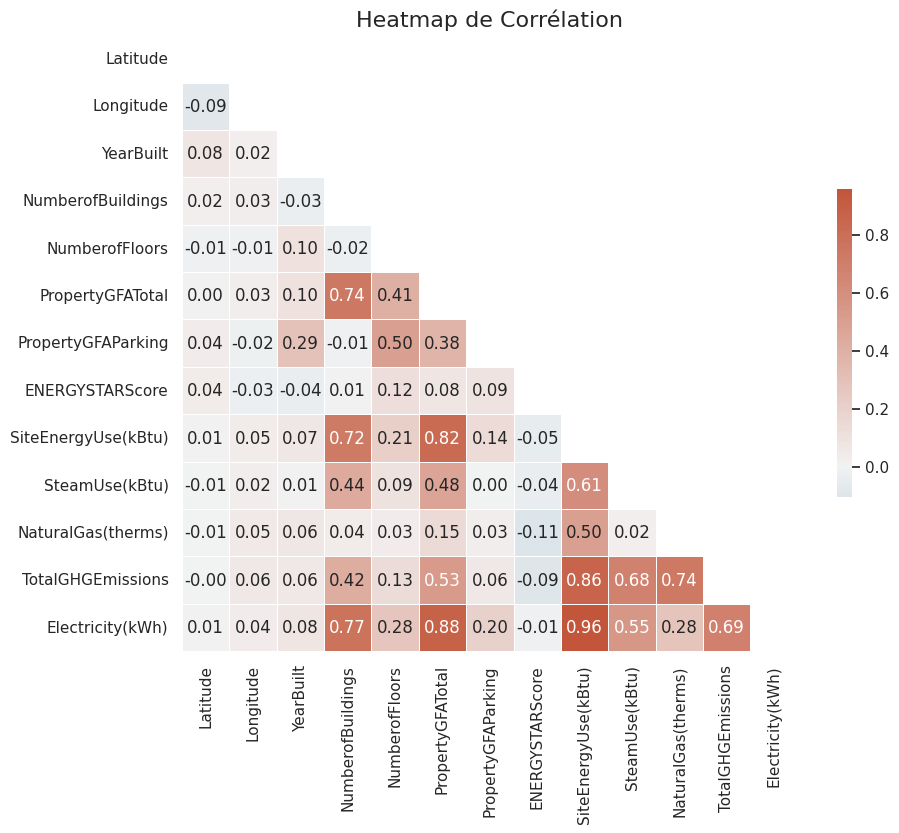

In [ ]:
# créer une matrice de corrélation pour les colonnes sélectionnées
corr_matrix = df_final.corr()

# créer une heatmap de corrélation en triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.set(style="white")
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f",
            xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns, ax=ax)

plt.title('Heatmap de Corrélation', fontsize=16)
plt.show()


>## **Sauvegarde du dataframe post-analyse**

In [ ]:
df_final.to_csv('df_cleaned.csv', index=False)

# <a name="C2"> **PHASE EXPLORATOIRE** </a>

>> ## **Chargement des ibrairies à importées**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats as stats
import statsmodels.api as sm

>> ## **Chargement des données**

In [ ]:
df_for_exploration = pd.read_csv('df_cleaned.csv')

>> ## **Display**

In [ ]:
df_for_exploration.head()

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,47.61220,-122.33799,1927,1.0,12,88434,0,60.0,7226362.5,2003882.00,12764.52930,249.98,1.156514e+06
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",47.61317,-122.33393,1996,1.0,11,103566,15064,61.0,8387933.0,0.00,51450.81641,295.86,9.504252e+05
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,47.61393,-122.33810,1969,1.0,41,956110,196718,43.0,72587024.0,21566554.00,14938.00000,2089.28,1.451544e+07
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,47.61412,-122.33664,1926,1.0,10,61320,0,56.0,6794584.0,2214446.25,18112.13086,286.43,8.115253e+05
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",47.61375,-122.34047,1980,1.0,18,175580,62000,75.0,14172606.0,0.00,88039.98438,505.01,1.573449e+06


In [ ]:
df_for_exploration.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1539 entries, 0 to 1538
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   BuildingType               1539 non-null   object 
 1   PrimaryPropertyType        1539 non-null   object 
 2   PropertyName               1539 non-null   object 
 3   City                       1539 non-null   object 
 4   Neighborhood               1539 non-null   object 
 5   ListOfAllPropertyUseTypes  1539 non-null   object 
 6   Latitude                   1539 non-null   float64
 7   Longitude                  1539 non-null   float64
 8   YearBuilt                  1539 non-null   int64  
 9   NumberofBuildings          1539 non-null   float64
 10  NumberofFloors             1539 non-null   int64  
 11  PropertyGFATotal           1539 non-null   int64  
 12  PropertyGFAParking         1539 non-null   int64  
 13  ENERGYSTARScore            1539 non-null   float

>> ## **Analyse exploratoire des données**

>>> ### **Analyse univariée**

In [ ]:
df_for_exploration.loc[: , ['PrimaryPropertyType', 'ListOfAllPropertyUseTypes', 'PropertyName', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]

,PrimaryPropertyType,ListOfAllPropertyUseTypes,PropertyName,NumberofBuildings,NumberofFloors,PropertyGFATotal,ENERGYSTARScore,SiteEnergyUse(kBtu),TotalGHGEmissions
0,Hotel,Hotel,Mayflower park hotel,1.000,12,88434,60.000,7226362.500,249.980
1,Hotel,"Hotel, Parking, Restaurant",Paramount Hotel,1.000,11,103566,61.000,8387933.000,295.860
2,Hotel,Hotel,5673-The Westin Seattle,1.000,41,956110,43.000,72587024.000,2089.280
3,Hotel,Hotel,HOTEL MAX,1.000,10,61320,56.000,6794584.000,286.430
4,Hotel,"Hotel, Parking, Swimming Pool",WARWICK SEATTLE HOTEL (ID8),1.000,18,175580,75.000,14172606.000,505.010
...,...,...,...,...,...,...,...,...,...
1534,Other,Other - Recreation,High Point Community Center,1.000,1,18261,71.000,932082.125,20.330
1535,Other,Other - Recreation,International district/Chinatown CC,1.000,1,16000,71.000,950276.188,32.170
1536,Other,"Fitness Center/Health Club/Gym, Other - Recrea...",Queen Anne Pool,1.000,1,13157,71.000,5765898.000,223.540
1537,Mixed Use Property,"Fitness Center/Health Club/Gym, Food Service, ...",South Park Community Center,1.000,1,14101,71.000,719471.188,22.110


>>>> #### **Les types de bâtiments dans le dataset**

In [ ]:
df_for_exploration['BuildingType'].value_counts()

NonResidential        1425
Nonresidential COS      81
Campus                  23
SPS-District K-12       10
Name: BuildingType, dtype: int64

In [ ]:
df_for_exploration['BuildingType'].value_counts(normalize=True).round(2)

NonResidential       0.930
Nonresidential COS   0.050
Campus               0.010
SPS-District K-12    0.010
Name: BuildingType, dtype: float64

Text(0.5, 1.0, 'Les types de batiments analysés')

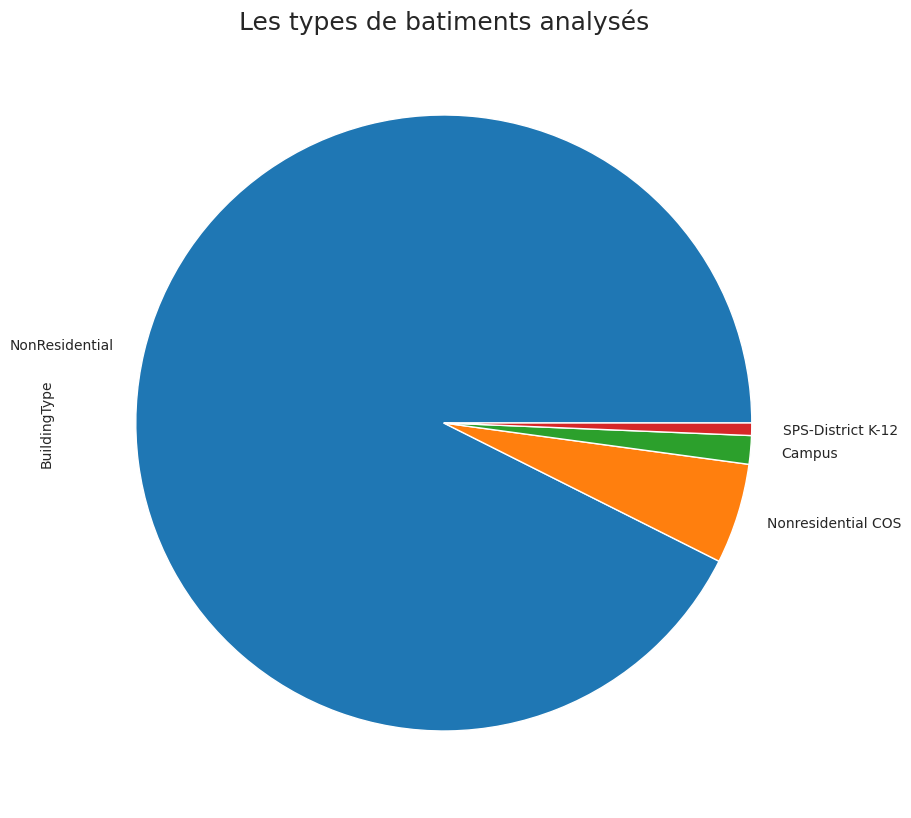

In [ ]:
plt.figure(figsize=(10,10))
df_for_exploration['BuildingType'].value_counts().plot(kind='pie')

plt.title('Les types de batiments analysés', fontsize=18)

>>>> #### **Nombre de bâtiments inclus dans le rapport de la propriété**

In [ ]:
nb_bat_lister_par_propriete = df_for_exploration['NumberofBuildings'].value_counts().reset_index()
nb_bat_lister_par_propriete = nb_bat_lister_par_propriete.rename(columns={'index': 'Nbre de bâtiments', 'NumberofBuildings': 'Nbre de propriétés listés'})
nb_bat_lister_par_propriete

,Nbre de bâtiments,Nbre de propriétés listés
0,1.000,1437
1,0.000,52
2,2.000,14
3,3.000,12
4,5.000,7
5,6.000,4
6,4.000,3
7,8.000,2
8,27.000,1
9,11.000,1


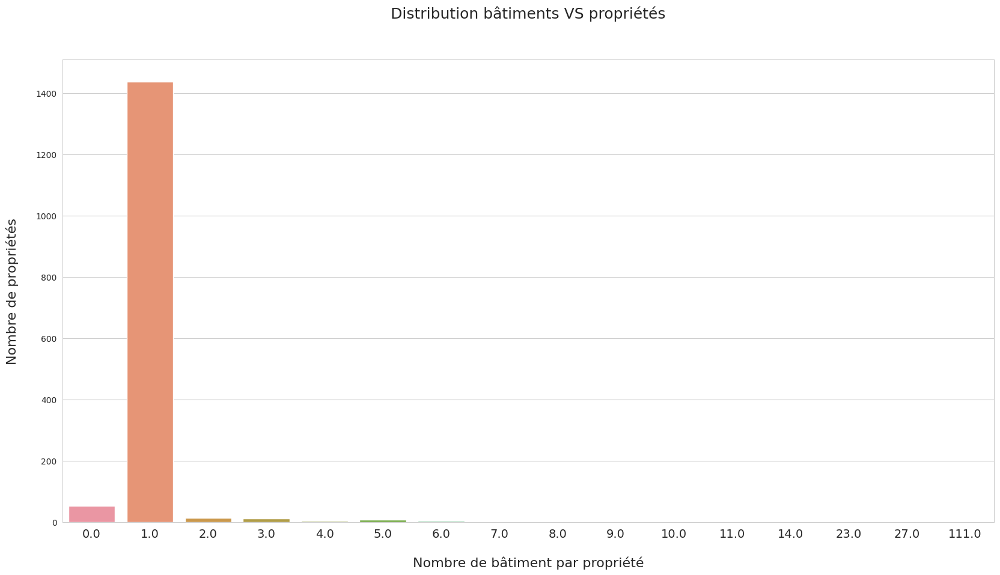

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=nb_bat_lister_par_propriete['Nbre de bâtiments'], y=nb_bat_lister_par_propriete['Nbre de propriétés listés']) 
plt.xticks(fontsize=14) 
plt.xlabel('Nombre de bâtiment par propriété', fontsize=16, labelpad=20) 
plt.ylabel('Nombre de propriétés', fontsize=16, labelpad=20) 
plt.title('Distribution bâtiments VS propriétés', pad=50, fontsize=18) 
plt.show() 

>>>> #### **Distribution bâtiments VS paliers**

In [ ]:
comptage_bat_VS_palier = df_for_exploration['NumberofFloors'].value_counts().reset_index()
comptage_bat_VS_palier = comptage_bat_VS_palier.rename(columns={'index': 'N étage', 'NumberofFloors': 'Nbre de bâts'})
comptage_bat_VS_palier

,N étage,Nbre de bâts
0,1,422
1,2,349
2,3,243
3,4,140
4,5,101
5,6,80
6,7,32
7,8,21
8,10,18
9,0,16


In [ ]:
df_for_exploration.loc[df_for_exploration['NumberofFloors'] == 0, :].index

Int64Index([ 128,  427,  428,  499,  989, 1069, 1452, 1453, 1454, 1467, 1501,
            1502, 1504, 1506, 1507, 1508],
           dtype='int64')

In [ ]:
df_for_exploration.loc[[128,  427,  428,  499,  989, 1069, 1452, 1453, 1454, 1467, 1501,
            1502, 1504, 1506, 1507, 1508]]

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
128,NonResidential,Hotel,Grand Hyatt Seattle,Seattle,DOWNTOWN,"Hotel, Other, Parking, Restaurant, Retail Store",47.613,-122.333,1999,1.000,0,934292,0,71.000,65047284.000,0.000,256831.625,1638.460,11536962.000
427,NonResidential,Medical Office,Arnold Pavilion,Seattle,EAST,Medical Office,47.610,-122.323,2004,1.000,0,225982,0,53.000,20560622.000,7815663.000,0.000,692.120,3735333.250
428,NonResidential,Mixed Use Property,2200 Westlake - SEDO,Seattle,DOWNTOWN,"Financial Office, Hotel, Multifamily Housing, ...",47.618,-122.337,2006,0.000,0,516407,0,31.000,39403320.000,0.000,99705.117,734.720,8626261.000
499,NonResidential,Other,Pacific Place,Seattle,DOWNTOWN,"Office, Other - Entertainment/Public Assembly,...",47.613,-122.335,1999,1.000,0,947987,0,71.000,46510960.000,0.000,0.000,324.250,13631581.000
989,NonResidential,Medical Office,HART First Hill LLC,Seattle,EAST,"Medical Office, Parking",47.609,-122.324,1945,1.000,0,274568,0,52.000,25311526.000,13296249.000,0.000,1110.070,3521475.750
1069,Campus,Other,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,Seattle,GREATER DUWAMISH,"Other, Parking",47.590,-122.325,1991,10.000,0,230971,0,71.000,21022288.000,0.000,56025.152,405.050,4519276.000
1452,NonResidential,Warehouse,Sandpoint #5,Seattle,NORTHEAST,"Non-Refrigerated Warehouse, Office",47.685,-122.262,1940,1.000,0,384772,0,69.000,15206762.000,0.000,61918.879,391.700,2642108.000
1453,NonResidential,Medical Office,Sandpoint #25,Seattle,NORTHEAST,Medical Office,47.682,-122.262,1960,1.000,0,30287,0,32.000,2193115.000,0.000,3777.100,32.720,532064.688
1454,NonResidential,Small- and Mid-Sized Office,Sandpoint #29,Seattle,NORTHEAST,Office,47.683,-122.263,1960,1.000,0,21931,0,32.000,3947209.250,0.000,25486.186,145.110,409903.500
1467,Nonresidential COS,Other,Magnuson,Seattle,NORTHEAST,Other - Recreation,47.682,-122.263,1929,8.000,0,502030,0,71.000,18470340.000,0.000,91104.547,549.110,2743225.000


In [ ]:
#comptage_bat_VS_palier['Nbre de bâts']
nb_bat = comptage_bat_VS_palier[comptage_bat_VS_palier['Nbre de bâts'] == 1]
nb_bat['N étage'].values

array([46, 99, 27, 76, 56, 30, 28, 55, 63, 37, 49, 47, 39])

In [ ]:
x_paliers = df_for_exploration.loc[df_for_exploration['NumberofFloors'].isin([46, 99, 27, 76, 56, 30, 28, 55, 63, 37, 49, 47, 39]), :].index
x_paliers

Int64Index([16, 169, 176, 177, 180, 218, 220, 231, 238, 494, 506, 862, 1216], dtype='int64')

In [ ]:
index_x = [16, 169, 176, 177, 180, 218, 220, 231, 238, 494, 506, 862, 1216]
df_for_exploration.loc[index_x]

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh)
16,NonResidential,Hotel,Renaissance Seattle Hotel,Seattle,DOWNTOWN,"Hotel, Parking",47.607,-122.331,1983,1.000,28,416281,85000,31.000,33556756.000,0.000,123314.750,802.890,6220773.000
169,NonResidential,Large Office,999 Third Avenue,Seattle,DOWNTOWN,"Office, Parking, Restaurant",47.605,-122.334,1983,1.000,47,1323055,0,94.000,44683660.000,0.000,1618.117,318.970,13048606.000
176,NonResidential,Large Office,Safeco Plaza,Seattle,DOWNTOWN,"Financial Office, Food Sales, Office, Other, P...",47.606,-122.334,1969,1.000,49,1123435,368980,89.000,45163308.000,0.000,67844.148,627.870,11248209.000
177,NonResidential,Large Office,Fourth & Madison,Seattle,DOWNTOWN,"Convenience Store without Gas Station, Data Ce...",47.605,-122.333,2002,1.000,37,1052469,164420,93.000,41213584.000,0.000,0.000,287.320,12079009.000
180,Nonresidential COS,Large Office,Seattle Municipal Tower (2030),Seattle,DOWNTOWN,"Office, Parking",47.605,-122.330,1990,1.000,63,1354987,159600,89.000,61576184.000,0.000,0.000,429.270,18046946.000
218,NonResidential,Large Office,1201 Third Avenue,Seattle,DOWNTOWN,"Office, Other, Parking, Restaurant",47.607,-122.336,1988,1.000,55,1400000,285000,92.000,53079164.000,2179487.750,14268.400,588.900,14499658.000
220,NonResidential,Large Office,US Bank Centre,Seattle,DOWNTOWN,"Financial Office, Office, Other, Parking, Rest...",47.611,-122.335,1989,1.000,46,1536606,512608,89.000,56606136.000,0.000,29380.699,530.180,15729209.000
231,NonResidential,Large Office,Century Square - COS Compliance,Seattle,DOWNTOWN,"Bank Branch, Office, Other, Parking, Restaurant",47.610,-122.337,1985,1.000,30,755000,134662,72.000,52226204.000,519390.000,85068.438,793.050,12661185.000
238,NonResidential,Large Office,Two Union Square,Seattle,DOWNTOWN,"Office, Other, Parking",47.610,-122.332,1989,1.000,56,1605578,389860,97.000,49517704.000,915654.875,25202.299,525.780,13505807.000
494,NonResidential,Large Office,Columbia Center - 2015,Seattle,DOWNTOWN,"Office, Parking",47.605,-122.331,1985,1.000,76,1952220,319400,86.000,92937640.000,0.000,50857.633,882.560,25747908.000


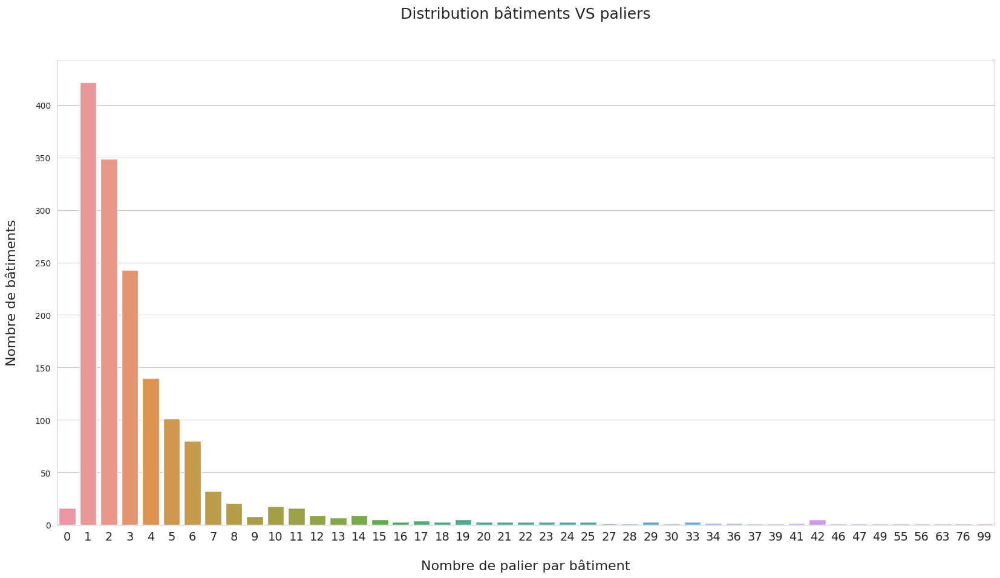

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=comptage_bat_VS_palier['N étage'], y=comptage_bat_VS_palier['Nbre de bâts']) 
plt.xticks(fontsize=14) 
plt.xlabel('Nombre de palier par bâtiment', fontsize=16, labelpad=20) 
plt.ylabel('Nombre de bâtiments', fontsize=16, labelpad=20) 
plt.title('Distribution bâtiments VS paliers', pad=50, fontsize=18) 
plt.show() 


>>>> #### **Répartition des scores ENERGY STAR**

In [ ]:
df_for_exploration['ENERGYSTARScore'].value_counts()

71.000     558
98.000      27
100.000     27
95.000      25
89.000      24
          ... 
39.000       3
11.000       3
28.000       3
7.000        3
9.000        3
Name: ENERGYSTARScore, Length: 100, dtype: int64

Text(0, 0.5, 'Score ENERGY STAR (sur 100)')

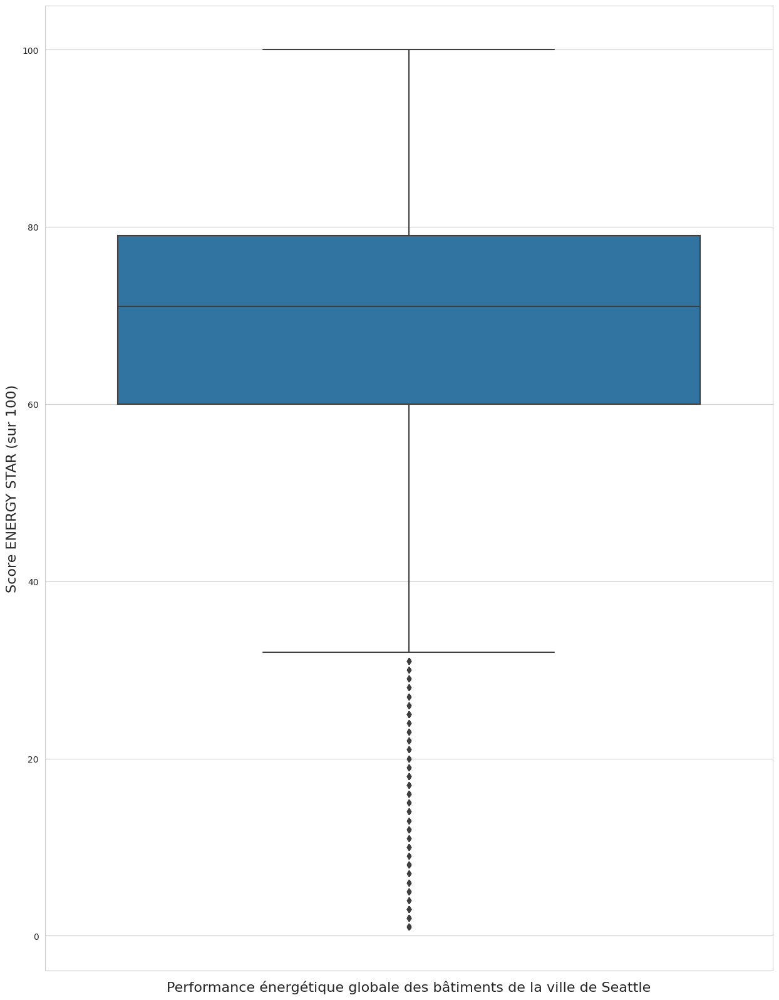

In [ ]:
plt.figure(figsize=(15,20))

sns.boxplot(y='ENERGYSTARScore', data=df_for_exploration)
plt.xlabel('Performance énergétique globale des bâtiments de la ville de Seattle', fontsize = 16)
plt.ylabel('Score ENERGY STAR (sur 100)', fontsize = 16)

A noter que la variable 'ENERGYSTARScore' est :

Une note de 1 à 100 calculée par l'EPA qui évalue la performance énergétique globale d'un bien immobilier, sur la base de données nationales permettant de contrôler les différences entre le climat, les utilisations et les opérations du bâtiment. Un score de 50 représente la médiane nationale.

**Calculer les effectifs de chaque catégorie**

In [ ]:
scores_inf_50 = df_for_exploration.loc[df_for_exploration['ENERGYSTARScore'] < 50, :].shape[0]
scores_inf_50

281

In [ ]:
scores_egal_50 = df_for_exploration.loc[df_for_exploration['ENERGYSTARScore'] == 50, :].shape[0]
scores_egal_50

6

In [ ]:
scores_sup_50 = df_for_exploration.loc[df_for_exploration['ENERGYSTARScore'] > 50, :].shape[0]
scores_sup_50

1252

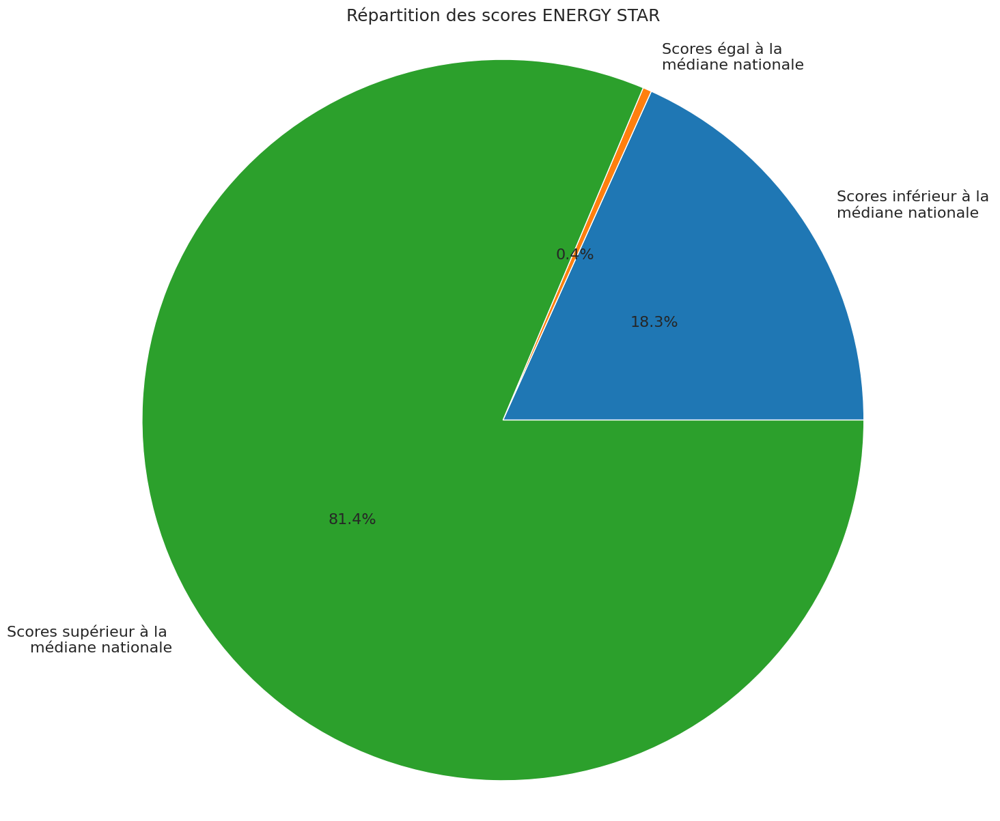

In [ ]:
# Créons la liste des effectifs
effectifs = [scores_inf_50, scores_egal_50, scores_sup_50]

# Créons la liste des étiquettes pour chaque catégorie
etiquettes = ['Scores inférieur à la \nmédiane nationale', 'Scores égal à la \nmédiane nationale', 'Scores supérieur à la \nmédiane nationale']

# Créons le pie chart
plt.figure(figsize=(15,15))

plt.pie(effectifs, labels=etiquettes, autopct='%1.1f%%', textprops={'fontsize': 16},
        pctdistance=0.5)
plt.axis('equal')
plt.title("Répartition des scores ENERGY STAR", fontsize=18)
plt.show()

>>>> #### **Analyse de la variable "nature des propriétés principales"**

In [ ]:
# Obtenons les valeurs de la variable "type de propriété principale" 
nb_propriete_principal_par_type = df_for_exploration['PrimaryPropertyType'].value_counts()
nb_propriete_principal_par_type

Small- and Mid-Sized Office    286
Other                          242
Warehouse                      185
Large Office                   168
Mixed Use Property             112
Retail Store                    85
Hotel                           75
Worship Facility                69
Distribution Center             53
K-12 School                     50
Supermarket / Grocery Store     40
Medical Office                  39
Self-Storage Facility           28
University                      22
Residence Hall                  21
Senior Care Community           20
Refrigerated Warehouse          12
Restaurant                      12
Laboratory                      10
Hospital                         8
Low-Rise Multifamily             2
Name: PrimaryPropertyType, dtype: int64

**Visualisons la distribution de la variable type de propriété principal**

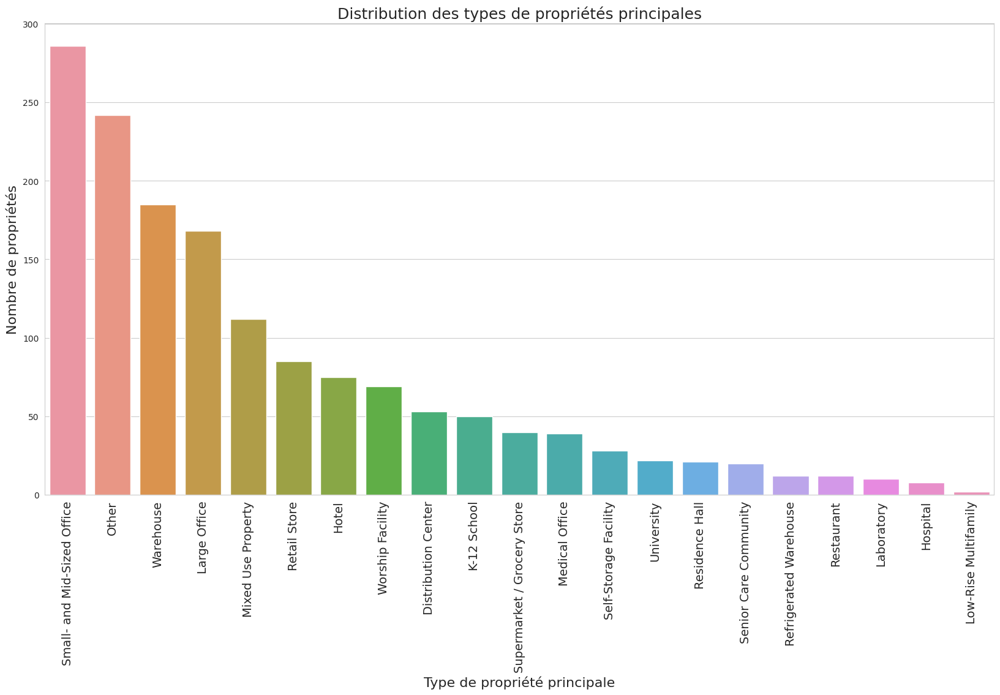

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=nb_propriete_principal_par_type.index, y=nb_propriete_principal_par_type.values) 
plt.xticks(rotation=90, fontsize=14) 
plt.xlabel('Type de propriété principale', fontsize=16) 
plt.ylabel('Nombre de propriétés', fontsize=16) 
plt.title('Distribution des types de propriétés principales', fontsize=18) 
plt.show() 


>>>> #### **Liste de tous les types d'utilisation des biens**

In [ ]:
df_for_exploration['ListOfAllPropertyUseTypes'].value_counts()

Office                                                                                    132
Office, Parking                                                                           119
Non-Refrigerated Warehouse                                                                100
Non-Refrigerated Warehouse, Office                                                         61
Other                                                                                      56
                                                                                         ... 
Office, Other, Retail Store, Swimming Pool                                                  1
Medical Office, Office, Other, Other - Services, Parking, Retail Store                      1
Parking, Restaurant                                                                         1
Fast Food Restaurant, Medical Office, Movie Theater, Parking, Retail Store                  1
Fitness Center/Health Club/Gym, Office, Other - Recreation, 

>>>>> ##### **Filtrons les bâtiments qui ont en leur sein un data center**

In [ ]:
bats_contain_data_center = df_for_exploration.loc[df_for_exploration['ListOfAllPropertyUseTypes'].str.contains('Data Center'), :]
bats_contain_data_center = bats_contain_data_center.loc[:, ['ListOfAllPropertyUseTypes', 'PrimaryPropertyType', 'PropertyName', 'PropertyGFATotal', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)', 'TotalGHGEmissions']]
display(bats_contain_data_center)
print('\n')
bats_contain_data_center.shape

,ListOfAllPropertyUseTypes,PrimaryPropertyType,PropertyName,PropertyGFATotal,SiteEnergyUse(kBtu),Electricity(kWh),TotalGHGEmissions
14,"Data Center, Library, Parking",Other,The Seattle Public Library - Central Library,412000,18588860.000,5231916.000,181.380
38,"Data Center, Office, Retail Store",Large Office,5th and Pine,168115,9536161.000,2794888.750,66.480
58,"Data Center, Medical Office, Non-Refrigerated ...",Mixed Use Property,Central Seattle,99780,15473117.000,2973421.250,481.970
69,"Data Center, Distribution Center, Office, Park...",Small- and Mid-Sized Office,KCTS9,66240,4166306.250,1221074.250,29.040
89,"Data Center, Office",Small- and Mid-Sized Office,Seattle Children's Hospital 70th/Sand Point Wa...,96300,16319835.000,4095456.000,222.020
116,"Data Center, Distribution Center, Office, Othe...",Small- and Mid-Sized Office,North Service Center,91130,9472358.000,2079127.750,175.770
120,"Data Center, Distribution Center, Office, Other",Distribution Center,SCL SSC Building A,179161,9436408.000,2570956.750,96.430
175,"Data Center, Office, Parking",Large Office,Abraham Lincoln Building (Wallysons Inc),186768,9641043.000,2194040.000,218.530
177,"Convenience Store without Gas Station, Data Ce...",Large Office,Fourth & Madison,1052469,41213584.000,12079009.000,287.320
181,"Data Center, Office, Other",Large Office,Justice Center,310490,21169502.000,4725684.500,380.370


(40, 7)

In [ ]:
# Comptons les batiments qui ont en leur sein un Data center
count_bar_avec_DC = bats_contain_data_center.shape[0]
print("Les batiments qui ont en leur sein un Data center sont au nombre de :", count_bar_avec_DC)

Les batiments qui ont en leur sein un Data center sont au nombre de : 40


In [ ]:
counts = bats_contain_data_center['PrimaryPropertyType'].value_counts()
counts

Large Office                   15
Small- and Mid-Sized Office    10
Mixed Use Property              7
Other                           5
Distribution Center             1
Laboratory                      1
Warehouse                       1
Name: PrimaryPropertyType, dtype: int64

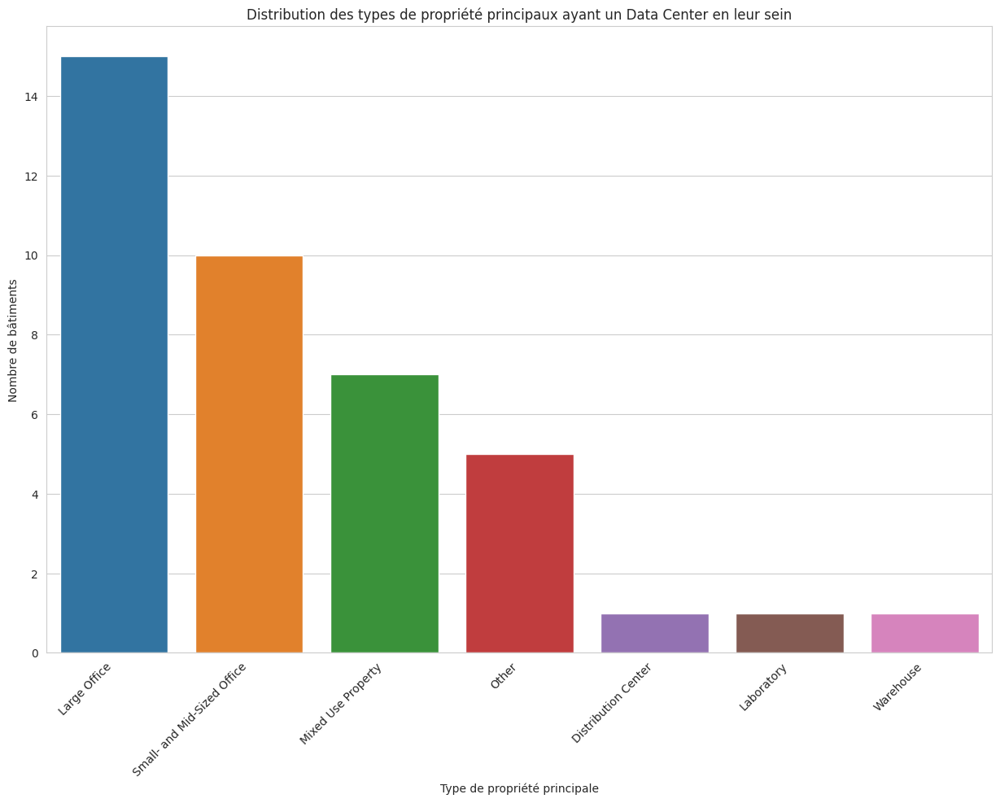

In [ ]:
# Créons un diagramme de distribution
plt.figure(figsize=(15, 10))
ax=sns.barplot(x=counts.index, y=counts.values)

# Définir les xticks avec un angle de 45 degrés
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.title('Distribution des types de propriété principaux ayant un Data Center en leur sein')
plt.xlabel('Type de propriété principale')
plt.ylabel('Nombre de bâtiments')
plt.show()

In [ ]:
bats_contain_data_center.loc[bats_contain_data_center['PrimaryPropertyType'] == 'Large Office', :]

,ListOfAllPropertyUseTypes,PrimaryPropertyType,PropertyName,PropertyGFATotal,SiteEnergyUse(kBtu),Electricity(kWh),TotalGHGEmissions
38,"Data Center, Office, Retail Store",Large Office,5th and Pine,168115,9536161.000,2794888.750,66.480
175,"Data Center, Office, Parking",Large Office,Abraham Lincoln Building (Wallysons Inc),186768,9641043.000,2194040.000,218.530
177,"Convenience Store without Gas Station, Data Ce...",Large Office,Fourth & Madison,1052469,41213584.000,12079009.000,287.320
181,"Data Center, Office, Other",Large Office,Justice Center,310490,21169502.000,4725684.500,380.370
272,"Data Center, Office, Other, Restaurant",Large Office,1000 Denny Building,287819,48406556.000,14113435.000,349.070
315,"Data Center, Office, Parking, Restaurant",Large Office,Adobe Seattle,280957,11325513.000,3219974.500,94.470
412,"Data Center, Office",Large Office,83 S KING ST BLDG (ID633),184322,9722890.000,2849615.750,67.780
429,"Data Center, Financial Office, Office, Parking...",Large Office,Russell Investments Center,1592914,56498868.000,16155898.000,481.060
452,"Data Center, Office, Parking",Large Office,501 Elliott Ave West,165111,25478086.000,7467199.000,177.620
455,"Data Center, Office, Parking",Large Office,333 Elliott West,183964,14856199.000,4354102.500,103.570


>>>>> ##### **Filtrons les bâtiments qui n'ont pas en leur sein un data center**

In [ ]:
bats_non_contain_data_center = df_for_exploration.loc[~df_for_exploration['ListOfAllPropertyUseTypes'].str.contains('Data Center'), :]
bats_non_contain_data_center = bats_non_contain_data_center.loc[:, ['ListOfAllPropertyUseTypes', 'PrimaryPropertyType', 'PropertyName', 'PropertyGFATotal', 'SiteEnergyUse(kBtu)', 'Electricity(kWh)', 'TotalGHGEmissions']]
display(bats_non_contain_data_center)
print('\n')
bats_non_contain_data_center.shape

,ListOfAllPropertyUseTypes,PrimaryPropertyType,PropertyName,PropertyGFATotal,SiteEnergyUse(kBtu),Electricity(kWh),TotalGHGEmissions
0,Hotel,Hotel,Mayflower park hotel,88434,7226362.500,1156514.250,249.980
1,"Hotel, Parking, Restaurant",Hotel,Paramount Hotel,103566,8387933.000,950425.188,295.860
2,Hotel,Hotel,5673-The Westin Seattle,956110,72587024.000,14515435.000,2089.280
3,Hotel,Hotel,HOTEL MAX,61320,6794584.000,811525.312,286.430
4,"Hotel, Parking, Swimming Pool",Hotel,WARWICK SEATTLE HOTEL (ID8),175580,14172606.000,1573448.625,505.010
...,...,...,...,...,...,...,...
1534,Other - Recreation,Other,High Point Community Center,18261,932082.125,185334.703,20.330
1535,Other - Recreation,Other,International district/Chinatown CC,16000,950276.188,116221.000,32.170
1536,"Fitness Center/Health Club/Gym, Other - Recrea...",Other,Queen Anne Pool,13157,5765898.000,525251.688,223.540
1537,"Fitness Center/Health Club/Gym, Food Service, ...",Mixed Use Property,South Park Community Center,14101,719471.188,102248.000,22.110


(1499, 7)

In [ ]:
# Compter les batiments qui n'ont pas en leur sein un Data center
count_bat_sans_DC = bats_non_contain_data_center.shape[0]
print("Le nombre de batiments qui n'ont pas en leur sein un Data center sont au nombre de :", count_bat_sans_DC)

Le nombre de batiments qui n'ont pas en leur sein un Data center sont au nombre de : 1499


In [ ]:
counts = bats_non_contain_data_center['PrimaryPropertyType'].value_counts()
counts

Small- and Mid-Sized Office    276
Other                          237
Warehouse                      184
Large Office                   153
Mixed Use Property             105
Retail Store                    85
Hotel                           75
Worship Facility                69
Distribution Center             52
K-12 School                     50
Supermarket / Grocery Store     40
Medical Office                  39
Self-Storage Facility           28
University                      22
Residence Hall                  21
Senior Care Community           20
Refrigerated Warehouse          12
Restaurant                      12
Laboratory                       9
Hospital                         8
Low-Rise Multifamily             2
Name: PrimaryPropertyType, dtype: int64

**Regardons la distribution de ces bâtiments suivant leur typologie**

In [ ]:
counts = bats_non_contain_data_center['PrimaryPropertyType'].value_counts()

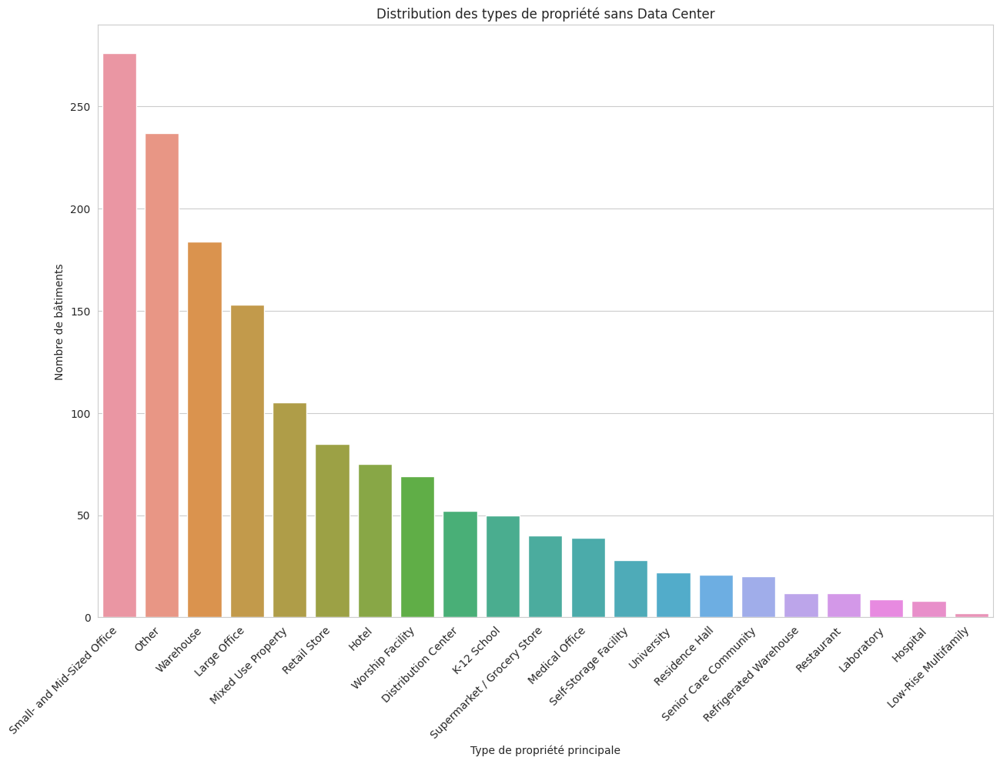

In [ ]:
# Créons un diagramme de distribution
plt.figure(figsize=(15, 10))
ax=sns.barplot(x=counts.index, y=counts.values)

# Définir les xticks avec un angle de 45 degrés
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.title('Distribution des types de propriété sans Data Center')
plt.xlabel('Type de propriété principale')
plt.ylabel('Nombre de bâtiments')
plt.show()

>>>>> ##### **Visualisons la répartition des bâtiments selon la présence d'un data center**

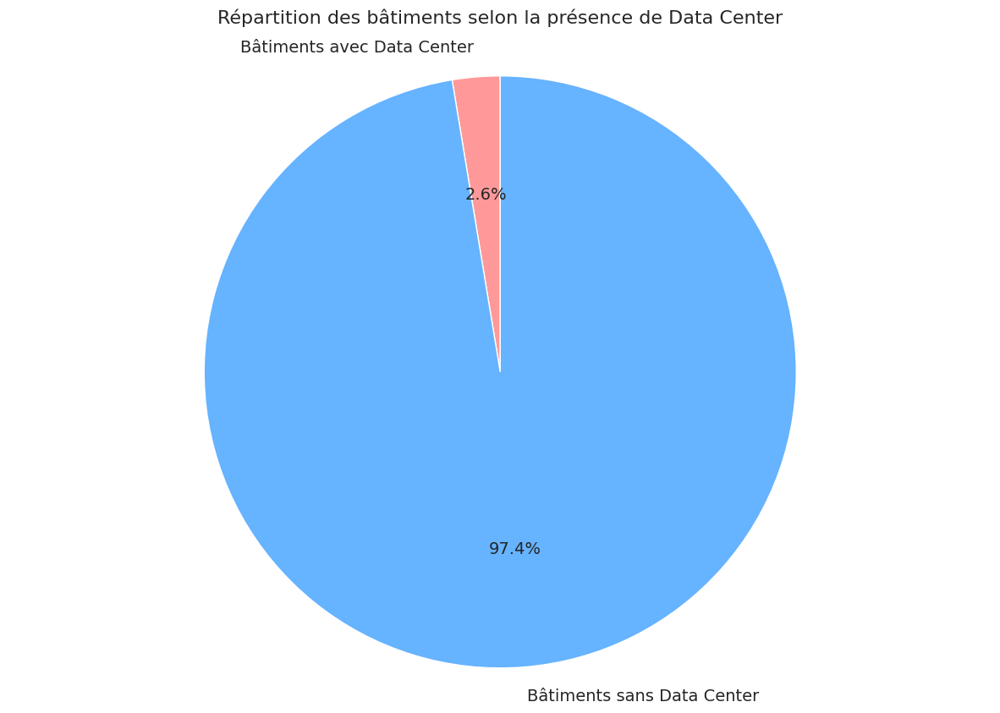

In [ ]:
plt.figure(figsize=(15,10))

# Tracer le diagramme en secteurs
sns.set_style("whitegrid")
labels = ['Bâtiments avec Data Center', 'Bâtiments sans Data Center']
sizes = [count_bar_avec_DC, count_bat_sans_DC]
colors = ['#ff9999', '#66b3ff']

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 14})
plt.axis('equal')
plt.title('Répartition des bâtiments selon la présence de Data Center', pad=20, fontsize= 16)
plt.show()

>>>> #### **Analyse du bilan annuel en fonction de l'année de construction des bâtiments**

In [ ]:
annee_construc_bat = df_for_exploration.loc[: , ['YearBuilt', 'PropertyName', 'PropertyGFATotal', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]
annee_construc_bat

,YearBuilt,PropertyName,PropertyGFATotal,SiteEnergyUse(kBtu),TotalGHGEmissions
0,1927,Mayflower park hotel,88434,7226362.500,249.980
1,1996,Paramount Hotel,103566,8387933.000,295.860
2,1969,5673-The Westin Seattle,956110,72587024.000,2089.280
3,1926,HOTEL MAX,61320,6794584.000,286.430
4,1980,WARWICK SEATTLE HOTEL (ID8),175580,14172606.000,505.010
...,...,...,...,...,...
1534,1982,High Point Community Center,18261,932082.125,20.330
1535,2004,International district/Chinatown CC,16000,950276.188,32.170
1536,1974,Queen Anne Pool,13157,5765898.000,223.540
1537,1989,South Park Community Center,14101,719471.188,22.110


In [ ]:
df_for_exploration['YearBuilt'].value_counts()

1900    43
1970    31
2000    29
1960    28
1910    28
        ..
1944     2
1901     2
1903     1
1936     1
1935     1
Name: YearBuilt, Length: 113, dtype: int64

>>>>> ##### **Bilan annuel de consommation d'énergie en fonction de l'année de construction des bâtiments**

In [ ]:
conso_Energie_VS_annee_Construc = annee_construc_bat.groupby('YearBuilt')['SiteEnergyUse(kBtu)'].sum().reset_index()
conso_Energie_VS_annee_Construc

,YearBuilt,SiteEnergyUse(kBtu)
0,1900,1002754263.875
1,1901,2873021.625
2,1902,27158355.000
3,1903,1062722.625
4,1904,56088662.750
...,...,...
108,2011,43577272.000
109,2012,126635921.250
110,2013,174893685.156
111,2014,61964634.250


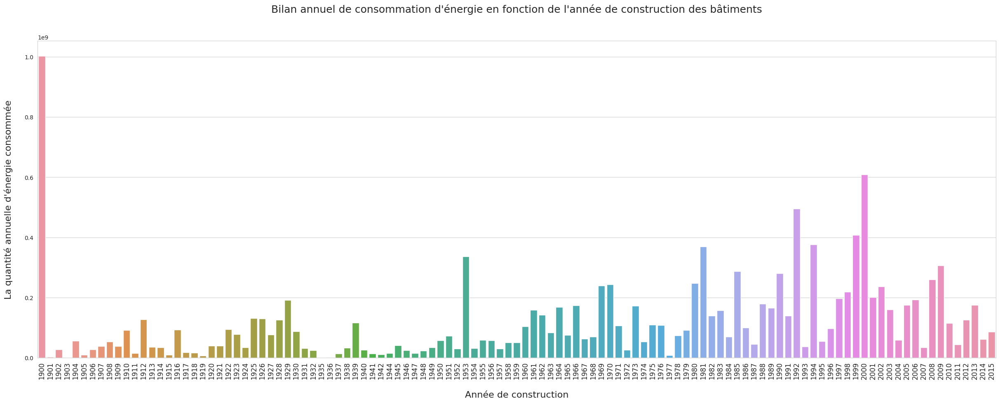

In [ ]:
plt.figure(figsize=(30,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(y=conso_Energie_VS_annee_Construc['SiteEnergyUse(kBtu)'], x=conso_Energie_VS_annee_Construc['YearBuilt']) 
plt.xticks(rotation=90, fontsize=12)
plt.xlabel('Année de construction', fontsize=16, labelpad=20) 
plt.ylabel("La quantité annuelle d'énergie consommée", fontsize=16, labelpad=20) 
plt.title("Bilan annuel de consommation d'énergie en fonction de l'année de construction des bâtiments", pad=50, fontsize=18) 

plt.show() 

>>>>> ##### **Bilan annuel des émissions de gaz à effet de serre (GES) en fonction de l'année de construction des bâtiments**

In [ ]:
emission_GES_VS_annee_Construc = annee_construc_bat.groupby('YearBuilt')['TotalGHGEmissions'].sum().reset_index()
emission_GES_VS_annee_Construc

,YearBuilt,TotalGHGEmissions
0,1900,14440.600
1,1901,72.700
2,1902,678.630
3,1903,24.250
4,1904,1288.810
...,...,...
108,2011,1045.300
109,2012,2898.400
110,2013,4782.460
111,2014,904.550


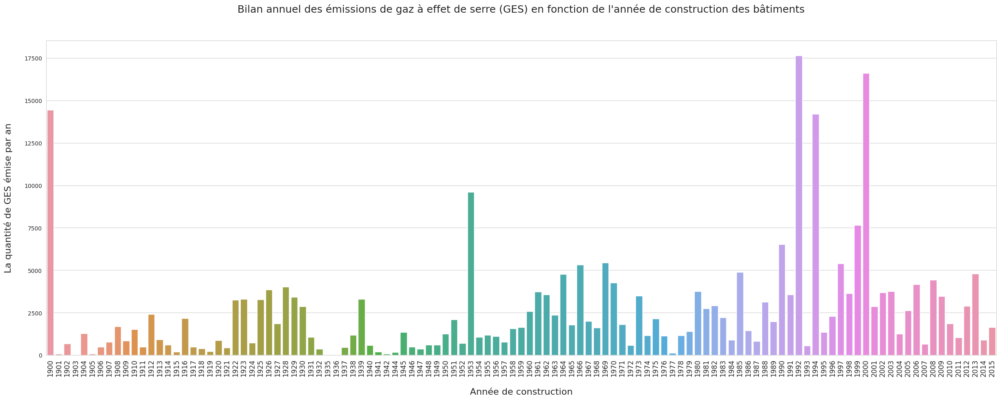

In [ ]:
plt.figure(figsize=(30,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(y=emission_GES_VS_annee_Construc['TotalGHGEmissions'], x=emission_GES_VS_annee_Construc['YearBuilt']) 
plt.xticks(rotation=90, fontsize=12) 
plt.xlabel('Année de construction', fontsize=16, labelpad=20) 
plt.ylabel("La quantité de GES émise par an", fontsize=16, labelpad=20) 
plt.title("Bilan annuel des émissions de gaz à effet de serre (GES) en fonction de l'année de construction des bâtiments", pad=50, fontsize=18) 
plt.show() 

>>>> #### **Consommation d'énergie sur site selon la présence d'un data center**

In [ ]:
Consom_energie_site = df_for_exploration.loc[:, ['PrimaryPropertyType', 'PropertyName', 'SiteEnergyUse(kBtu)']]
Consom_energie_site

,PrimaryPropertyType,PropertyName,SiteEnergyUse(kBtu)
0,Hotel,Mayflower park hotel,7226362.500
1,Hotel,Paramount Hotel,8387933.000
2,Hotel,5673-The Westin Seattle,72587024.000
3,Hotel,HOTEL MAX,6794584.000
4,Hotel,WARWICK SEATTLE HOTEL (ID8),14172606.000
...,...,...,...
1534,Other,High Point Community Center,932082.125
1535,Other,International district/Chinatown CC,950276.188
1536,Other,Queen Anne Pool,5765898.000
1537,Mixed Use Property,South Park Community Center,719471.188


In [ ]:
consom_total_type_site = Consom_energie_site.groupby('PrimaryPropertyType')['SiteEnergyUse(kBtu)'].sum()
consom_total_type_site  = consom_total_type_site.sort_values(ascending=False)
consom_total_type_site 

PrimaryPropertyType
Large Office                  2934271344.375
Other                         2092918741.571
Mixed Use Property            1284317865.126
University                    1231155262.188
Hospital                      1183433232.625
Hotel                          906857930.188
Small- and Mid-Sized Office    761120612.658
Medical Office                 466894686.750
Retail Store                   421725080.781
Supermarket / Grocery Store    403914822.375
Warehouse                      365751349.728
Laboratory                     262931276.000
Senior Care Community          230345766.500
K-12 School                    143684265.812
Distribution Center            127484097.625
Worship Facility                82999845.438
Residence Hall                  80025173.438
Restaurant                      63166776.688
Refrigerated Warehouse          44633136.938
Self-Storage Facility           26100832.113
Low-Rise Multifamily             5775536.500
Name: SiteEnergyUse(kBtu), dtype: f

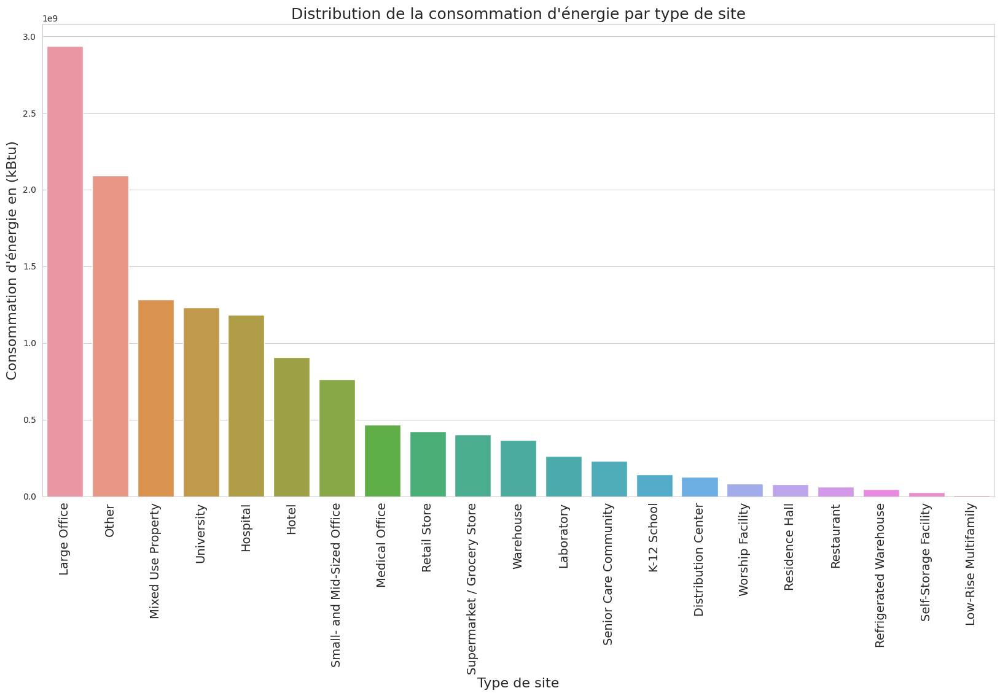

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=consom_total_type_site.index, y=consom_total_type_site.values) 
plt.xticks(rotation=90, fontsize=14) 
plt.xlabel('Type de site', fontsize=16) 
plt.ylabel("Consommation d'énergie en (kBtu)", fontsize=16) 
plt.title("Distribution de la consommation d'énergie par type de site", fontsize=18) 
plt.show() 

>>>>> ##### **Bâtiments sans Data Center**

In [ ]:
comsum_energie_bats_sans_DC = bats_non_contain_data_center.groupby('PrimaryPropertyType')['SiteEnergyUse(kBtu)'].sum()
comsum_energie_bats_sans_DC.reset_index()

,PrimaryPropertyType,SiteEnergyUse(kBtu)
0,Distribution Center,118047689.625
1,Hospital,1183433232.625
2,Hotel,906857930.188
3,K-12 School,143684265.812
4,Laboratory,251337155.000
5,Large Office,2606413940.875
6,Low-Rise Multifamily,5775536.500
7,Medical Office,466894686.750
8,Mixed Use Property,1071148756.126
9,Other,1747028781.571


In [ ]:
total_comsum_energie_bats_sans_DC = comsum_energie_bats_sans_DC.sum()
print(f"- La consommation d'énergie de tous les batiments qui n'ont pas un data center est de :", total_comsum_energie_bats_sans_DC, "(kBtu)")

- La consommation d'énergie de tous les batiments qui n'ont pas un data center est de : 12147576185.290468 (kBtu)


>>>>> ##### **Bâtiments avec Data Center**

In [ ]:
comsum_energie_bats_avec_DC = bats_contain_data_center.groupby('PrimaryPropertyType')['SiteEnergyUse(kBtu)'].sum()
comsum_energie_bats_avec_DC.reset_index()

,PrimaryPropertyType,SiteEnergyUse(kBtu)
0,Distribution Center,9436408.000
1,Laboratory,11594121.000
2,Large Office,327857403.500
3,Mixed Use Property,213169109.000
4,Other,345889960.000
5,Small- and Mid-Sized Office,60449757.875
6,Warehouse,3534690.750


In [ ]:
total_comsum_energie_bats_avec_DC = comsum_energie_bats_avec_DC.sum()
print(f"- La consommation d'énergie de tous les batiments ayant un data center est de :", total_comsum_energie_bats_avec_DC, "(kBtu)")

- La consommation d'énergie de tous les batiments ayant un data center est de : 971931450.125 (kBtu)


>>>>> ##### **Visualisation de la répartition de la consommation des bâtiments selon la présence de Data Center**

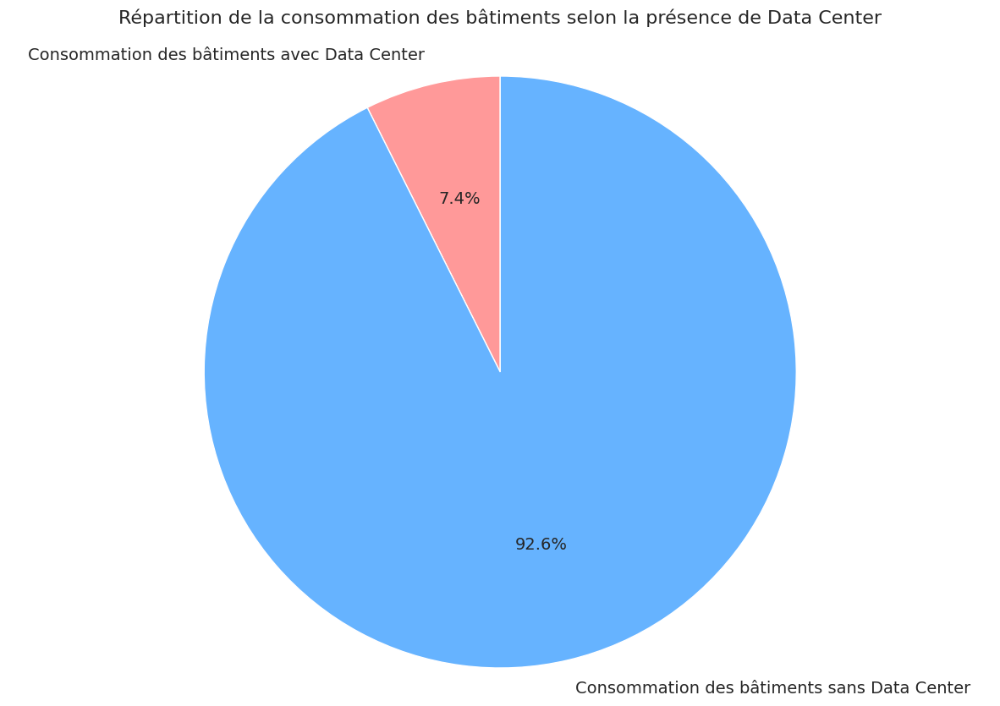

In [ ]:
plt.figure(figsize=(15,10))

# Tracer le diagramme en secteurs
sns.set_style("whitegrid")
labels = ['Consommation des bâtiments avec Data Center', 'Consommation des bâtiments sans Data Center']
sizes = [total_comsum_energie_bats_avec_DC, total_comsum_energie_bats_sans_DC]
colors = ['#ff9999', '#66b3ff']

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 14})
plt.axis('equal')
plt.title('Répartition de la consommation des bâtiments selon la présence de Data Center', pad=20, fontsize= 16)
plt.show()

>>>> #### **Total des émissions de gaz à effet de serre selon la présence d'un data center**

In [ ]:
emissions_site_GES = df_for_exploration.loc[:, ['PrimaryPropertyType', 'PropertyName', 'TotalGHGEmissions']]
emissions_site_GES

,PrimaryPropertyType,PropertyName,TotalGHGEmissions
0,Hotel,Mayflower park hotel,249.980
1,Hotel,Paramount Hotel,295.860
2,Hotel,5673-The Westin Seattle,2089.280
3,Hotel,HOTEL MAX,286.430
4,Hotel,WARWICK SEATTLE HOTEL (ID8),505.010
...,...,...,...
1534,Other,High Point Community Center,20.330
1535,Other,International district/Chinatown CC,32.170
1536,Other,Queen Anne Pool,223.540
1537,Mixed Use Property,South Park Community Center,22.110


In [ ]:
emission_GES_total_type_site = emissions_site_GES.groupby('PrimaryPropertyType')['TotalGHGEmissions'].sum()
emission_GES_total_type_site = emission_GES_total_type_site.sort_values(ascending=False)
emission_GES_total_type_site 

PrimaryPropertyType
Other                         45707.140
Hospital                      42208.220
Large Office                  34794.560
Mixed Use Property            34085.840
Hotel                         29144.680
University                    19294.470
Small- and Mid-Sized Office   11736.170
Medical Office                10216.240
Supermarket / Grocery Store    8903.750
Laboratory                     8494.240
Retail Store                   8010.700
Warehouse                      7932.510
Senior Care Community          7437.990
K-12 School                    4861.680
Worship Facility               2993.400
Distribution Center            2661.960
Restaurant                     2310.170
Residence Hall                 2126.580
Self-Storage Facility           674.770
Refrigerated Warehouse          451.370
Low-Rise Multifamily             51.940
Name: TotalGHGEmissions, dtype: float64

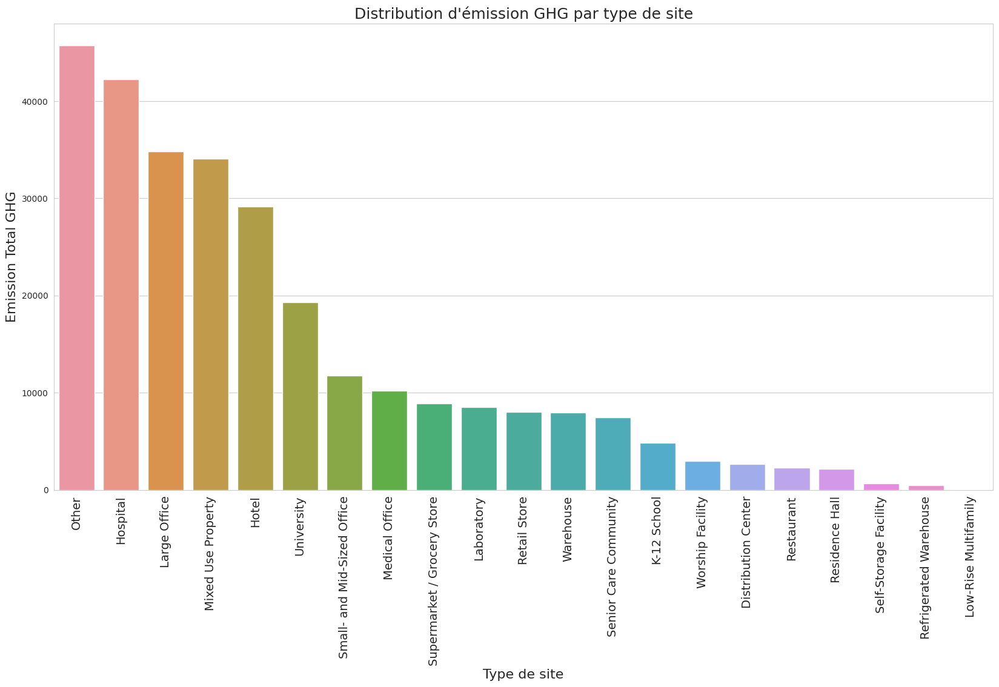

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=emission_GES_total_type_site.index, y=emission_GES_total_type_site.values) 
plt.xticks(rotation=90, fontsize=14) 
plt.xlabel('Type de site', fontsize=16) 
plt.ylabel("Emission Total GHG", fontsize=16) 
plt.title("Distribution d'émission GHG par type de site", fontsize=18) 
plt.show() 

>>>>> ##### **Bâtiments sans Data Center**

In [ ]:
emission_GES_bats_sans_DC = bats_non_contain_data_center.groupby('PrimaryPropertyType')['TotalGHGEmissions'].sum()
emission_GES_bats_sans_DC.reset_index()

,PrimaryPropertyType,TotalGHGEmissions
0,Distribution Center,2565.530
1,Hospital,42208.220
2,Hotel,29144.680
3,K-12 School,4861.680
4,Laboratory,8224.530
5,Large Office,31946.670
6,Low-Rise Multifamily,51.940
7,Medical Office,10216.240
8,Mixed Use Property,29520.290
9,Other,43121.760


In [ ]:
total_emission_GES_bats_sans_DC = emission_GES_bats_sans_DC.sum()
print(f"- La quantité totale d'émissions de gaz à effet de serre des batiments qui n'ont pas un data center est de :", total_emission_GES_bats_sans_DC, "kg CO2e/MBtu")

- La quantité totale d'émissions de gaz à effet de serre des batiments qui n'ont pas un data center est de : 272795.58 kg CO2e/MBtu


>>>>> ##### **Bâtiments avec Data Center**

In [ ]:
emission_GES_bats_avec_DC = bats_contain_data_center.groupby('PrimaryPropertyType')['TotalGHGEmissions'].sum()
emission_GES_bats_avec_DC.reset_index()

,PrimaryPropertyType,TotalGHGEmissions
0,Distribution Center,96.430
1,Laboratory,269.710
2,Large Office,2847.890
3,Mixed Use Property,4565.550
4,Other,2585.380
5,Small- and Mid-Sized Office,826.610
6,Warehouse,111.230


In [ ]:
total_emission_GES_bats_avec_DC = emission_GES_bats_avec_DC.sum()
print(f"- La quantité totale d'émissions de gaz à effet de serre des batiments ayant un data center est de :", total_emission_GES_bats_avec_DC, "kg CO2e/MBtu")

- La quantité totale d'émissions de gaz à effet de serre des batiments ayant un data center est de : 11302.8 kg CO2e/MBtu


>>>>> ##### **Visualisation du taux d'émission selon la présence de Data Center**

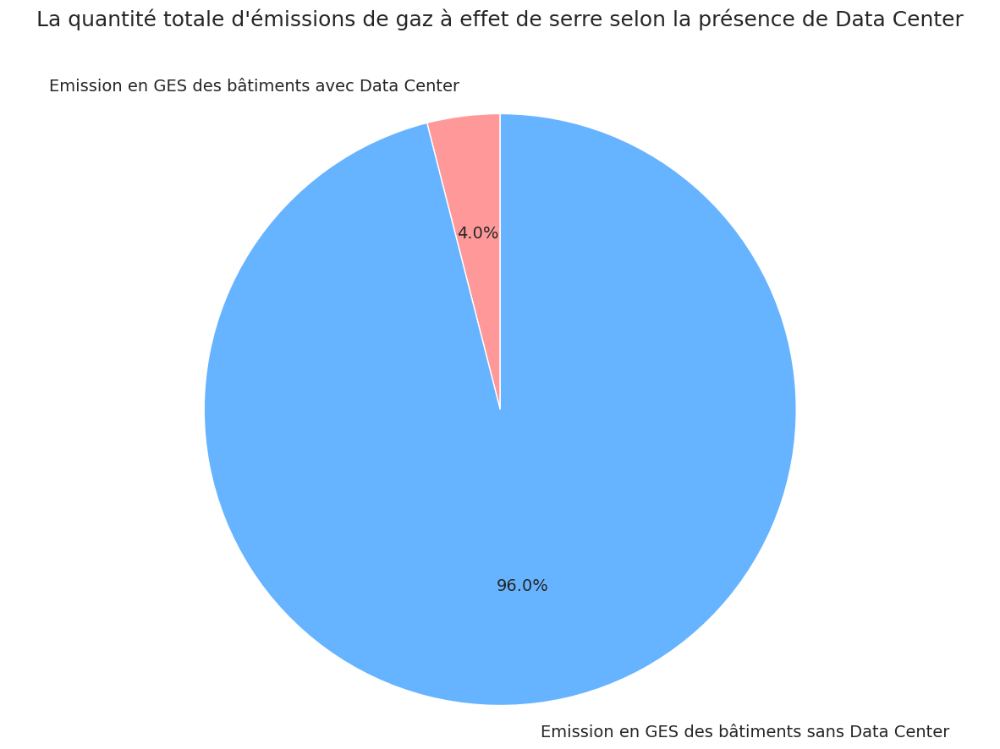

In [ ]:
plt.figure(figsize=(15,10))

# Tracer le diagramme en secteurs
sns.set_style("whitegrid")
labels = ['Emission en GES des bâtiments avec Data Center', 'Emission en GES des bâtiments sans Data Center']
sizes = [total_emission_GES_bats_avec_DC, total_emission_GES_bats_sans_DC]
colors = ['#ff9999', '#66b3ff']

plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90, textprops={'fontsize': 14})
plt.axis('equal')
plt.title("La quantité totale d'émissions de gaz à effet de serre selon la présence de Data Center", pad=50, fontsize= 18)
plt.show()

>>> ### **Analyse bivariée**

In [ ]:
# Ajoutons une colonne "DataCenter" pour distinguer les bâtiments avec et sans data center
df_for_exploration["DataCenter"] = df_for_exploration["ListOfAllPropertyUseTypes"].str.contains("Data Center")

In [ ]:
df_for_exploration.head()

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh),DataCenter
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,47.612,-122.338,1927,1.000,12,88434,0,60.000,7226362.500,2003882.000,12764.529,249.980,1156514.250,False
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",47.613,-122.334,1996,1.000,11,103566,15064,61.000,8387933.000,0.000,51450.816,295.860,950425.188,False
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,47.614,-122.338,1969,1.000,41,956110,196718,43.000,72587024.000,21566554.000,14938.000,2089.280,14515435.000,False
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,47.614,-122.337,1926,1.000,10,61320,0,56.000,6794584.000,2214446.250,18112.131,286.430,811525.312,False
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",47.614,-122.340,1980,1.000,18,175580,62000,75.000,14172606.000,0.000,88039.984,505.010,1573448.625,False


>>>> #### **Etude comparative entre les variables ci-dessous aux variables cibles:**

- Nbre de paliers (**NumberofFloors**)
- Année de construction (**YearBuilt**)
- Nbre de bâtiments par propriété (**NumberofBuildings**)

>>>>> ##### Relation entre la variable **NumberofFloors** et les **variables cibles**

In [ ]:
df_for_exploration[['NumberofFloors', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]

,NumberofFloors,SiteEnergyUse(kBtu),TotalGHGEmissions
0,12,7226362.500,249.980
1,11,8387933.000,295.860
2,41,72587024.000,2089.280
3,10,6794584.000,286.430
4,18,14172606.000,505.010
...,...,...,...
1534,1,932082.125,20.330
1535,1,950276.188,32.170
1536,1,5765898.000,223.540
1537,1,719471.188,22.110


In [ ]:
df_for_exploration[['NumberofFloors', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']].value_counts()

NumberofFloors  SiteEnergyUse(kBtu)  TotalGHGEmissions
0               2159170.250          51.390               1
4               9155568.000          220.260              1
                465533.312           3.250                1
                270838.500           9.710                1
                241478.594           1.680                1
                                                         ..
2               945245.625           43.840               1
                935580.312           38.860               1
                920430.625           6.420                1
                917100.312           38.590               1
99              326001.188           2.270                1
Length: 1539, dtype: int64

>>>>>> ###### Variable **NumberofFloors** VS variable **SiteEnergyUse(kBtu)**

In [ ]:
conso_energie_VS_nb_palier = df_for_exploration.groupby('NumberofFloors')['SiteEnergyUse(kBtu)'].sum().sort_values(ascending=False)
conso_energie_VS_nb_palier = conso_energie_VS_nb_palier.reset_index()
conso_energie_VS_nb_palier = conso_energie_VS_nb_palier.rename(columns= {'NumberofFloors' : 'Nbre de paliers par propriété', 'SiteEnergyUse(kBtu)' : 'Consommation d\'énergie sur site'})
conso_energie_VS_nb_palier

,Nbre de paliers par propriété,Consommation d'énergie sur site
0,1,1562027203.815
1,3,1510261083.989
2,2,1357730990.283
3,0,1165503909.500
4,5,1128122196.328
5,6,964483002.594
6,4,730384345.344
7,8,722558881.750
8,10,498477381.000
9,14,430022865.000


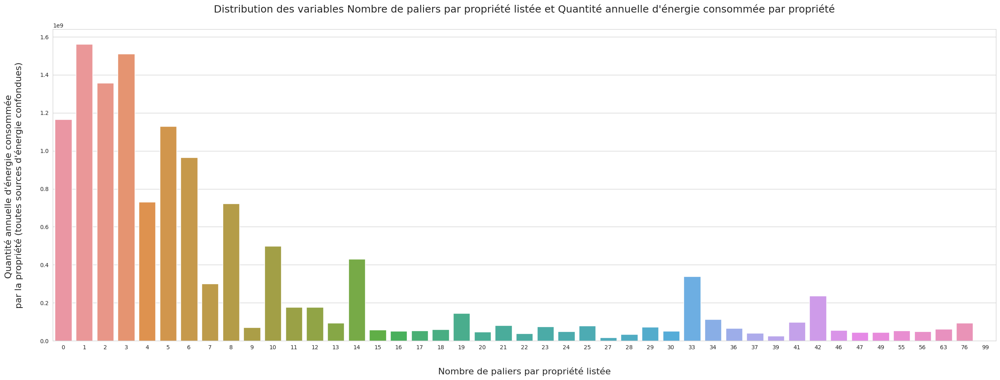

In [ ]:
plt.figure(figsize=(30,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=conso_energie_VS_nb_palier['Nbre de paliers par propriété'], y=conso_energie_VS_nb_palier["Consommation d'énergie sur site"]) 

plt.xlabel("Nombre de paliers par propriété listée", fontsize=16, labelpad=30)
plt.ylabel("Quantité annuelle d'énergie consommée \npar la propriété (toutes sources d'énergie confondues)", fontsize=16, labelpad=30)
plt.title("Distribution des variables Nombre de paliers par propriété listée et Quantité annuelle d'énergie consommée par propriété", pad=30, fontsize=18)
plt.show()

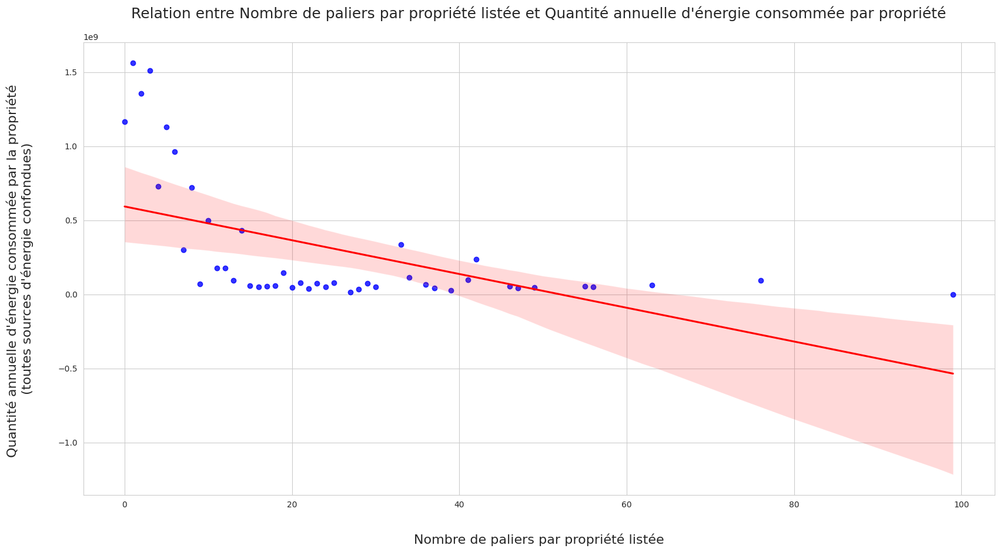

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(x=conso_energie_VS_nb_palier['Nbre de paliers par propriété'], y=conso_energie_VS_nb_palier["Consommation d'énergie sur site"], data=conso_energie_VS_nb_palier, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.xlabel("Nombre de paliers par propriété listée", fontsize=16, labelpad=30)
plt.ylabel("Quantité annuelle d'énergie consommée par la propriété \n(toutes sources d'énergie confondues)", fontsize=16, labelpad=30)
plt.title("Relation entre Nombre de paliers par propriété listée et Quantité annuelle d'énergie consommée par propriété", pad=30, fontsize=18)

plt.show()

Afin d'analyser plus en détail cette relation, faisons un test d'hypothèse pour déterminer si une hypothèse nulle doit être rejetée ou acceptée.

In [ ]:
# Créons une variable indépendante X et une variable dépendante Y
X = conso_energie_VS_nb_palier['Nbre de paliers par propriété']
Y = conso_energie_VS_nb_palier["Consommation d'énergie sur site"]

# Ajoutons une constante à X pour ajuster l'interception dans la régression
X = sm.add_constant(X)

# Ajustons un modèle de régression linéaire
model = sm.OLS(Y, X).fit()

# Obtenons les coefficients de régression
beta_0, beta_1 = model.params

# Obtenons la valeur p pour le test de la pente
t, p = stats.ttest_1samp(model.params, 0)

# Affichons la valeur p
print('La valeur p pour le test t est :', p)

La valeur p pour le test t est : 0.5122231751483648


Notre valeur p pour le test t est égale à 0,512 , cela signifie qu'elle est supérieure à un niveau de signification communément utilisé de 0,05.

Cela suggère que nous ne pouvons pas rejeter l'hypothèse nulle selon laquelle la pente de la droite de régression est nulle ou non significative. Autrement dit, il n'y a pas suffisamment de preuves pour conclure qu'il y a une relation significative entre les variables

>>>>>> ###### Variable **NumberofFloors** VS variable **TotalGHGEmissions**

In [ ]:
emission_GES_VS_nb_palier = df_for_exploration.groupby('NumberofFloors')['TotalGHGEmissions'].sum().sort_values(ascending=False)
emission_GES_VS_nb_palier = emission_GES_VS_nb_palier.reset_index()
emission_GES_VS_nb_palier = emission_GES_VS_nb_palier.rename(columns= {'NumberofFloors' : 'Nbre de paliers par propriété', 'TotalGHGEmissions' : 'Emission de GES sur site'})
emission_GES_VS_nb_palier

,Nbre de paliers par propriété,Emission de GES sur site
0,3,40337.020
1,1,39629.860
2,2,30516.510
3,5,25102.240
4,8,20819.580
5,0,17867.050
6,6,15708.780
7,4,14666.180
8,14,14584.230
9,10,13109.360


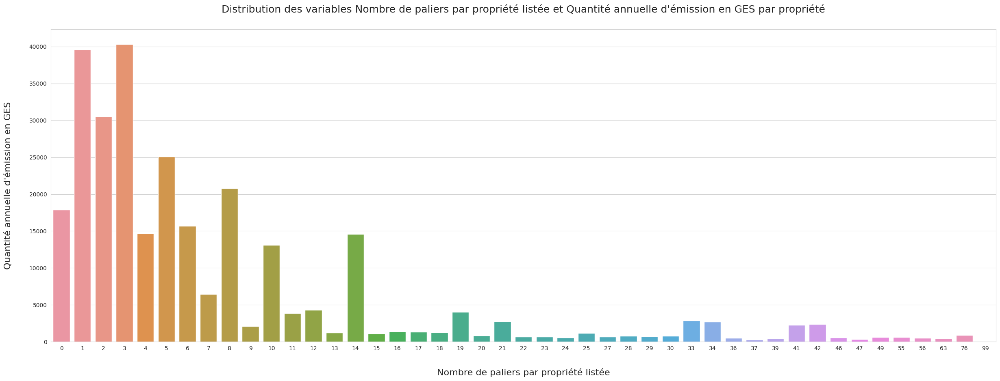

In [ ]:
plt.figure(figsize=(30,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=emission_GES_VS_nb_palier['Nbre de paliers par propriété'], y=emission_GES_VS_nb_palier["Emission de GES sur site"]) 

plt.xlabel("Nombre de paliers par propriété listée", fontsize=16, labelpad=30)
plt.ylabel("Quantité annuelle d'émission en GES", fontsize=16, labelpad=30)
plt.title("Distribution des variables Nombre de paliers par propriété listée et Quantité annuelle d'émission en GES par propriété", pad=30, fontsize=18)
plt.show()

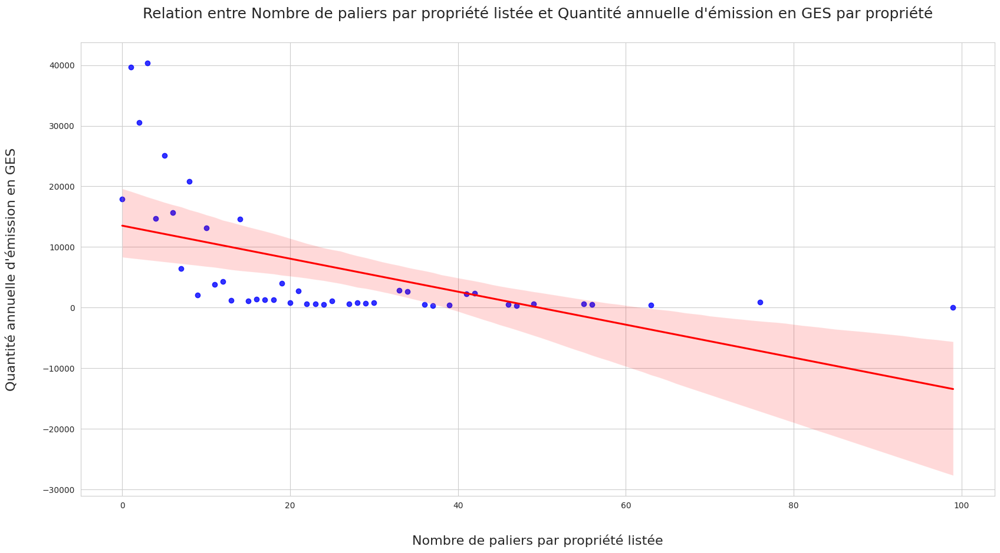

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(x=emission_GES_VS_nb_palier['Nbre de paliers par propriété'], y=emission_GES_VS_nb_palier["Emission de GES sur site"], data=emission_GES_VS_nb_palier, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.xlabel("Nombre de paliers par propriété listée", fontsize=16, labelpad=30)
plt.ylabel("Quantité annuelle d'émission en GES", fontsize=16, labelpad=30)
plt.title("Relation entre Nombre de paliers par propriété listée et Quantité annuelle d'émission en GES par propriété", pad=30, fontsize=18)

plt.show()

Afin d'analyser plus en détail cette relation, faisons un test d'hypothèse pour déterminer si une hypothèse nulle doit être rejetée ou acceptée.

In [ ]:
# Créons une variable indépendante X et une variable dépendante Y
X = emission_GES_VS_nb_palier['Nbre de paliers par propriété']
Y = emission_GES_VS_nb_palier["Emission de GES sur site"]

# Ajoutons une constante à X pour ajuster l'interception dans la régression
X = sm.add_constant(X)

# Ajustons un modèle de régression linéaire
model = sm.OLS(Y, X).fit()

# Obtenons les coefficients de régression
beta_0, beta_1 = model.params

# Obtenons la valeur p pour le test de la pente
t, p = stats.ttest_1samp(model.params, 0)

# Affichons la valeur p
print('La valeur p pour le test t est :', p)

La valeur p pour le test t est : 0.5128109546841297


Notre valeur p pour le test t est égale à 0,512 , cela signifie qu'elle est supérieure à un niveau de signification communément utilisé de 0,05.

Cela suggère que nous ne pouvons pas rejeter l'hypothèse nulle selon laquelle la pente de la droite de régression est nulle ou non significative. Autrement dit, il n'y a pas suffisamment de preuves pour conclure qu'il y a une relation significative entre les variables

>>>>> ##### Relation entre la variable **YearBuilt** et les **variables cibles**

In [ ]:
df_for_exploration[['YearBuilt', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]

,YearBuilt,SiteEnergyUse(kBtu),TotalGHGEmissions
0,1927,7226362.500,249.980
1,1996,8387933.000,295.860
2,1969,72587024.000,2089.280
3,1926,6794584.000,286.430
4,1980,14172606.000,505.010
...,...,...,...
1534,1982,932082.125,20.330
1535,2004,950276.188,32.170
1536,1974,5765898.000,223.540
1537,1989,719471.188,22.110


In [ ]:
df_for_exploration[['YearBuilt', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']].value_counts()

YearBuilt  SiteEnergyUse(kBtu)  TotalGHGEmissions
1900       90558.703            0.630                1
1989       719471.188           22.110               1
1981       576405.125           9.460                1
           440419.188           12.920               1
           345866.688           2.410                1
                                                    ..
1951       642645.188           4.480                1
           608755.375           28.780               1
1950       9290214.000          72.020               1
           7588060.500          156.180              1
2015       39364116.000         1000.060             1
Length: 1539, dtype: int64

>>>>>> ###### Variable **YearBuilt** VS variable **SiteEnergyUse(kBtu)**

In [ ]:
conso_energie_VS_year_built = df_for_exploration.groupby('YearBuilt')['SiteEnergyUse(kBtu)'].sum().sort_values(ascending=False)
conso_energie_VS_year_built = conso_energie_VS_year_built.reset_index()
conso_energie_VS_year_built = conso_energie_VS_year_built.rename(columns= {'YearBuilt' : 'Année de construction', 'SiteEnergyUse(kBtu)' : 'Consommation d\'énergie sur site'})
conso_energie_VS_year_built

,Année de construction,Consommation d'énergie sur site
0,1900,1002754263.875
1,2000,609252115.562
2,1992,495801133.781
3,1999,407314630.312
4,1994,375562527.375
...,...,...
108,1919,6983262.625
109,1901,2873021.625
110,1903,1062722.625
111,1935,1001964.000


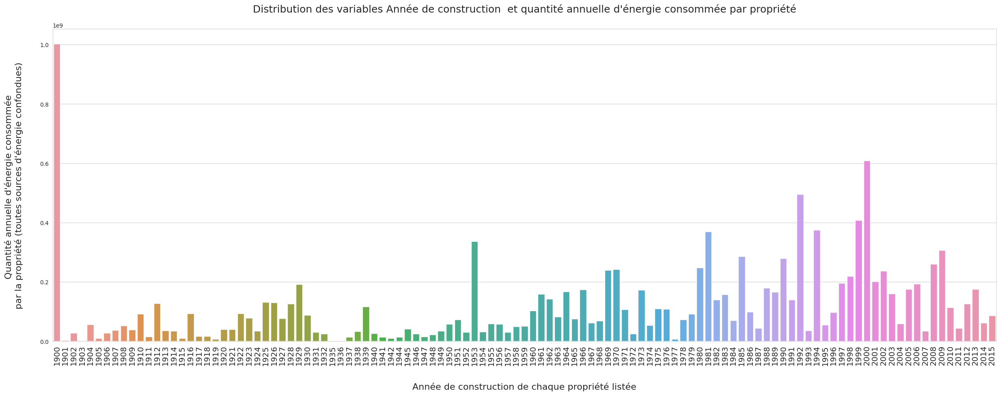

In [ ]:
plt.figure(figsize=(30,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=conso_energie_VS_year_built['Année de construction'], y=conso_energie_VS_year_built["Consommation d'énergie sur site"]) 
plt.xticks(rotation=90, fontsize=14) 
plt.xlabel("Année de construction de chaque propriété listée", fontsize=16, labelpad=30)
plt.ylabel("Quantité annuelle d'énergie consommée \npar la propriété (toutes sources d'énergie confondues)", fontsize=16, labelpad=30)
plt.title("Distribution des variables Année de construction  et quantité annuelle d'énergie consommée par propriété", pad=30, fontsize=18)
plt.show()

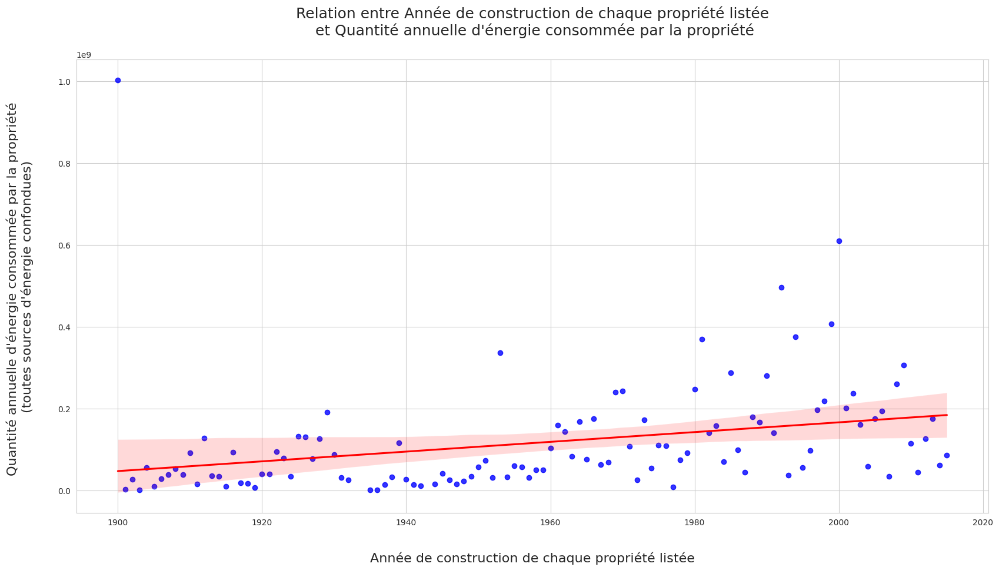

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(x=conso_energie_VS_year_built['Année de construction'], y=conso_energie_VS_year_built["Consommation d'énergie sur site"], data=conso_energie_VS_year_built, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.xlabel("Année de construction de chaque propriété listée", fontsize=16, labelpad=30)
plt.ylabel("Quantité annuelle d'énergie consommée par la propriété \n(toutes sources d'énergie confondues)", fontsize=16, labelpad=30)
plt.title("Relation entre Année de construction de chaque propriété listée\n et Quantité annuelle d'énergie consommée par la propriété", pad=30, fontsize=18)

plt.show()

Afin d'analyser plus en détail cette relation, faisons un test d'hypothèse pour déterminer si une hypothèse nulle doit être rejetée ou acceptée.

In [ ]:
# Créons une variable indépendante X et une variable dépendante Y
X = conso_energie_VS_year_built['Année de construction']
Y = conso_energie_VS_year_built["Consommation d'énergie sur site"]

# Ajoutons une constante à X pour ajuster l'interception dans la régression
X = sm.add_constant(X)

# Ajustons un modèle de régression linéaire
model = sm.OLS(Y, X).fit()

# Obtenons les coefficients de régression
beta_0, beta_1 = model.params

# Obtenons la valeur p pour le test de la pente
t, p = stats.ttest_1samp(model.params, 0)

# Affichons la valeur p
print('La valeur p pour le test t est :', p)

La valeur p pour le test t est : 0.5003421529445904


Notre valeur p pour le test t est égale à 0,50 , cela signifie qu'elle est supérieure à un niveau de signification communément utilisé de 0,05.

Cela suggère que nous ne pouvons pas rejeter l'hypothèse nulle selon laquelle la pente de la droite de régression est nulle ou non significative. Autrement dit, il n'y a pas suffisamment de preuves pour conclure qu'il y a une relation significative entre les variables

>>>>>> ###### Variable **YearBuilt** VS variable **TotalGHGEmissions**

In [ ]:
emission_GES_VS_year_built = df_for_exploration.groupby('YearBuilt')['TotalGHGEmissions'].sum().sort_values(ascending=False)
emission_GES_VS_year_built = emission_GES_VS_year_built.reset_index()
emission_GES_VS_year_built = emission_GES_VS_year_built.rename(columns= {'YearBuilt' : 'Année de construction', 'TotalGHGEmissions' : 'Emission annuelle de GES'})
emission_GES_VS_year_built

,Année de construction,Emission annuelle de GES
0,1992,17646.450
1,2000,16598.110
2,1900,14440.600
3,1994,14199.570
4,1953,9608.710
...,...,...
108,1942,72.930
109,1901,72.700
110,1903,24.250
111,1935,17.450


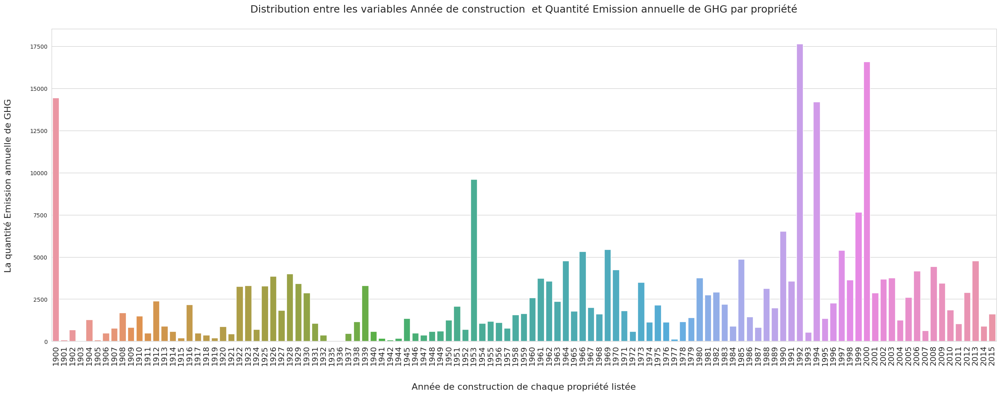

In [ ]:
plt.figure(figsize=(30,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=emission_GES_VS_year_built['Année de construction'], y=emission_GES_VS_year_built["Emission annuelle de GES"]) 
plt.xticks(rotation=90, fontsize=14) 
plt.xlabel("Année de construction de chaque propriété listée", fontsize=16, labelpad=30)
plt.ylabel("La quantité Emission annuelle de GHG", fontsize=16, labelpad=30)
plt.title("Distribution entre les variables Année de construction  et Quantité Emission annuelle de GHG par propriété", pad=30, fontsize=18)
plt.show()

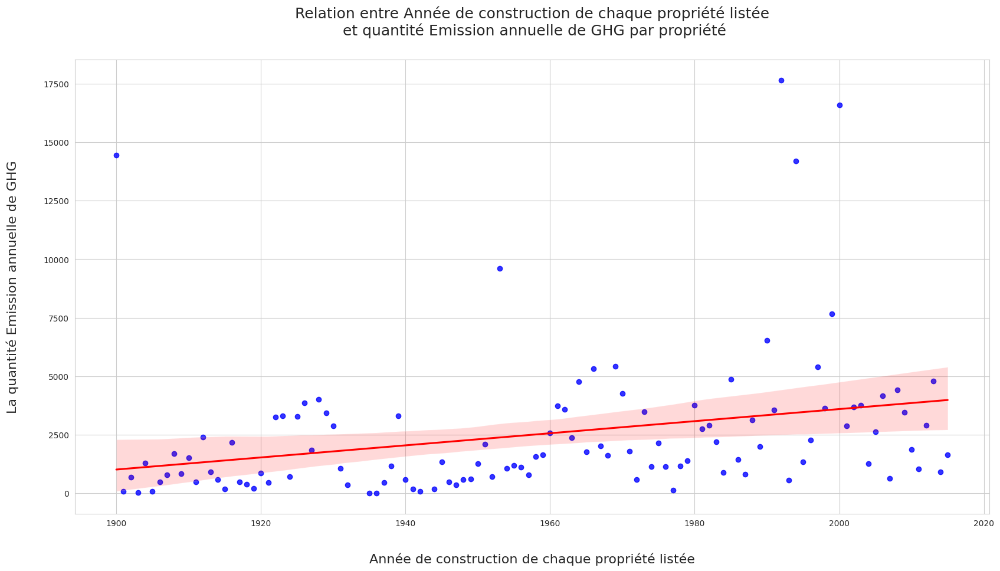

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(x=emission_GES_VS_year_built['Année de construction'], y=emission_GES_VS_year_built["Emission annuelle de GES"], data=emission_GES_VS_year_built, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.xlabel("Année de construction de chaque propriété listée", fontsize=16, labelpad=30)
plt.ylabel("La quantité Emission annuelle de GHG", fontsize=16, labelpad=30)
plt.title("Relation entre Année de construction de chaque propriété listée\n et quantité Emission annuelle de GHG par propriété", pad=30, fontsize=18)

# définir les limites d'axes x et y
#plt.ylim(-50, 200)

plt.show()

Afin d'analyser plus en détail cette relation, faisons un test d'hypothèse pour déterminer si une hypothèse nulle doit être rejetée ou acceptée.

In [ ]:
# Créons une variable indépendante X et une variable dépendante Y
X = emission_GES_VS_year_built['Année de construction']
Y = emission_GES_VS_year_built["Emission annuelle de GES"]

# Ajoutons une constante à X pour ajuster l'interception dans la régression
X = sm.add_constant(X)

# Ajustons un modèle de régression linéaire
model = sm.OLS(Y, X).fit()

# Obtenons les coefficients de régression
beta_0, beta_1 = model.params

# Obtenons la valeur p pour le test de la pente
t, p = stats.ttest_1samp(model.params, 0)

# Affichons la valeur p
print('La valeur p pour le test t est :', p)

La valeur p pour le test t est : 0.5003421337651954


Notre valeur p pour le test t est égale à 0,50 , cela signifie qu'elle est supérieure à un niveau de signification communément utilisé de 0,05.

Cela suggère que nous ne pouvons pas rejeter l'hypothèse nulle selon laquelle la pente de la droite de régression est nulle ou non significative. Autrement dit, il n'y a pas suffisamment de preuves pour conclure qu'il y a une relation significative entre les variables

>>>>> ###### Relation entre la variable **NumberofBuildings** et les **variables cibles**

In [ ]:
df_for_exploration[['NumberofBuildings', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]

,NumberofBuildings,SiteEnergyUse(kBtu),TotalGHGEmissions
0,1.000,7226362.500,249.980
1,1.000,8387933.000,295.860
2,1.000,72587024.000,2089.280
3,1.000,6794584.000,286.430
4,1.000,14172606.000,505.010
...,...,...,...
1534,1.000,932082.125,20.330
1535,1.000,950276.188,32.170
1536,1.000,5765898.000,223.540
1537,1.000,719471.188,22.110


In [ ]:
df_for_exploration[['NumberofBuildings', 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']].value_counts()

NumberofBuildings  SiteEnergyUse(kBtu)  TotalGHGEmissions
0.000              287763.500           2.010                1
1.000              7531325.000          184.810              1
                   5155090.500          127.100              1
                   5144392.000          146.930              1
                   5136604.500          143.340              1
                                                            ..
                   1469556.250          23.850               1
                   1467060.250          19.820               1
                   1467029.750          54.440               1
                   1465795.750          34.030               1
111.000            873923712.000        11140.560            1
Length: 1539, dtype: int64

>>>>>> ###### Variable **NumberofBuildings** VS variable **SiteEnergyUse(kBtu)**

In [ ]:
conso_energie_VS_nb_bat_par_propriete = df_for_exploration.groupby('NumberofBuildings')['SiteEnergyUse(kBtu)'].sum().sort_values(ascending=False)
conso_energie_VS_nb_bat_par_propriete = conso_energie_VS_nb_bat_par_propriete.reset_index()
conso_energie_VS_nb_bat_par_propriete = conso_energie_VS_nb_bat_par_propriete.rename(columns= {'NumberofBuildings' : 'Nbre de bâts. par propriétés listés', 'SiteEnergyUse(kBtu)' : 'Consommation d\'énergie sur site'})
conso_energie_VS_nb_bat_par_propriete

,Nbre de bâts. par propriétés listés,Consommation d'énergie sur site
0,1.000,10208148554.150
1,111.000,873923712.000
2,0.000,480326491.625
3,6.000,410676057.750
4,9.000,293090784.000
5,7.000,291614432.000
6,3.000,144889925.750
7,8.000,117431116.000
8,14.000,53466684.000
9,2.000,48061398.516


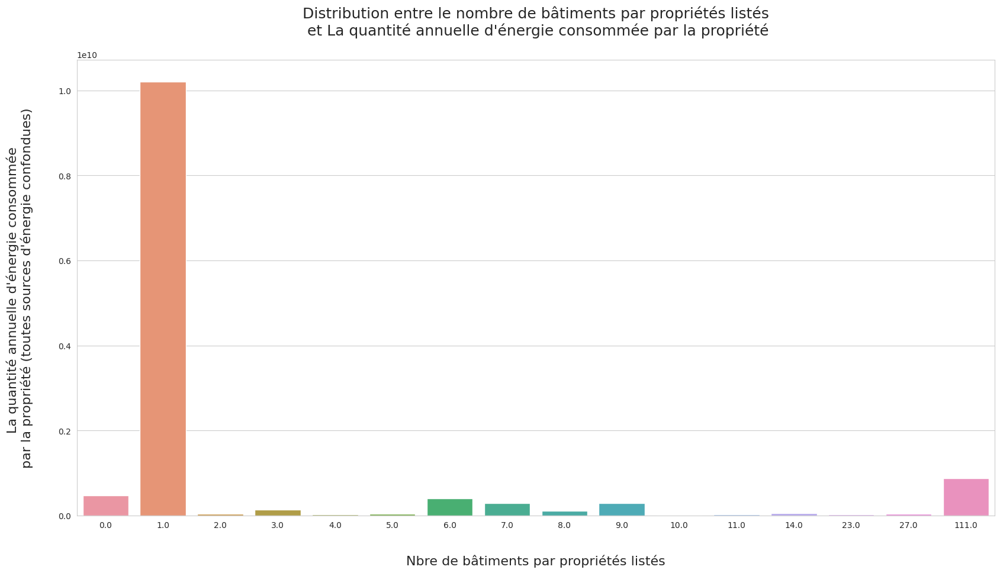

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=conso_energie_VS_nb_bat_par_propriete['Nbre de bâts. par propriétés listés'], y=conso_energie_VS_nb_bat_par_propriete["Consommation d'énergie sur site"]) 
#plt.xticks(rotation=90, fontsize=14) 
plt.xlabel("Nbre de bâtiments par propriétés listés", fontsize=16, labelpad=30)
plt.ylabel("La quantité annuelle d'énergie consommée \npar la propriété (toutes sources d'énergie confondues)", fontsize=16, labelpad=30)
plt.title("Distribution entre le nombre de bâtiments par propriétés listés\n et La quantité annuelle d'énergie consommée par la propriété", pad=30, fontsize=18)
plt.show()

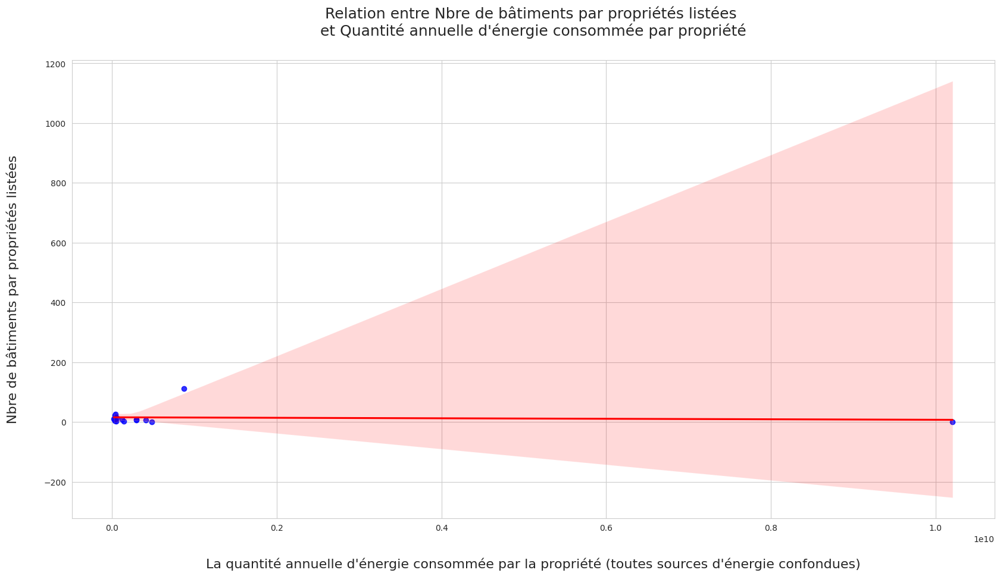

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(y=conso_energie_VS_nb_bat_par_propriete['Nbre de bâts. par propriétés listés'], x=conso_energie_VS_nb_bat_par_propriete["Consommation d'énergie sur site"], data=conso_energie_VS_nb_bat_par_propriete, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.ylabel("Nbre de bâtiments par propriétés listées", fontsize=16, labelpad=30)
plt.xlabel("La quantité annuelle d'énergie consommée par la propriété (toutes sources d'énergie confondues)", fontsize=16, labelpad=30)
plt.title("Relation entre Nbre de bâtiments par propriétés listées \net Quantité annuelle d'énergie consommée par propriété", pad=30, fontsize=18)

plt.show()

A travers ce graphe, on constate qu'il ya une relation non linéaire entre les variables x et y. Plus précisément, cela peut indiquer une relation inversement proportionnelle entre les variables.

Afin d'analyser plus en détail cette relation, faisons un test d'hypothèse pour déterminer si une hypothèse nulle doit être rejetée ou acceptée.

In [ ]:
# Créons une variable indépendante X et une variable dépendante Y
X = conso_energie_VS_nb_bat_par_propriete['Nbre de bâts. par propriétés listés']
Y = conso_energie_VS_nb_bat_par_propriete["Consommation d'énergie sur site"]

# Ajoutons une constante à X pour ajuster l'interception dans la régression
X = sm.add_constant(X)

# Ajustons un modèle de régression linéaire
model = sm.OLS(Y, X).fit()

# Obtenons les coefficients de régression
beta_0, beta_1 = model.params

# Obtenons la valeur p pour le test de la pente
t, p = stats.ttest_1samp(model.params, 0)

# Affichons la valeur p
print('La valeur p pour le test t est :', p)


La valeur p pour le test t est : 0.5050286717095396


Notre valeur p pour le test t est égale à 0,505, cela signifie qu'elle est supérieure à un niveau de signification communément utilisé de 0,05.

Cela suggère que nous ne pouvons pas rejeter l'hypothèse nulle selon laquelle la pente de la droite de régression est nulle ou non significative. Autrement dit, il n'y a pas suffisamment de preuves pour conclure qu'il y a une relation significative entre les variables.

>>>>>> ###### Variable **NumberofBuildings** VS variable **TotalGHGEmissions**

In [ ]:
emission_GES_VS_nb_bat_par_propriete = df_for_exploration.groupby('NumberofBuildings')['TotalGHGEmissions'].sum().sort_values(ascending=False)
emission_GES_VS_nb_bat_par_propriete = emission_GES_VS_nb_bat_par_propriete.reset_index()
emission_GES_VS_nb_bat_par_propriete = emission_GES_VS_nb_bat_par_propriete.rename(columns= {'NumberofBuildings' : 'Nbre de bâts. par propriétés listés', 'TotalGHGEmissions' : 'Emission GES sur site'})
emission_GES_VS_nb_bat_par_propriete

,Nbre de bâts. par propriétés listés,Emission GES sur site
0,1.000,213133.270
1,6.000,13303.420
2,7.000,12307.160
3,111.000,11140.560
4,0.000,11003.930
5,9.000,10734.570
6,8.000,3827.220
7,3.000,2885.630
8,5.000,1072.540
9,2.000,966.560


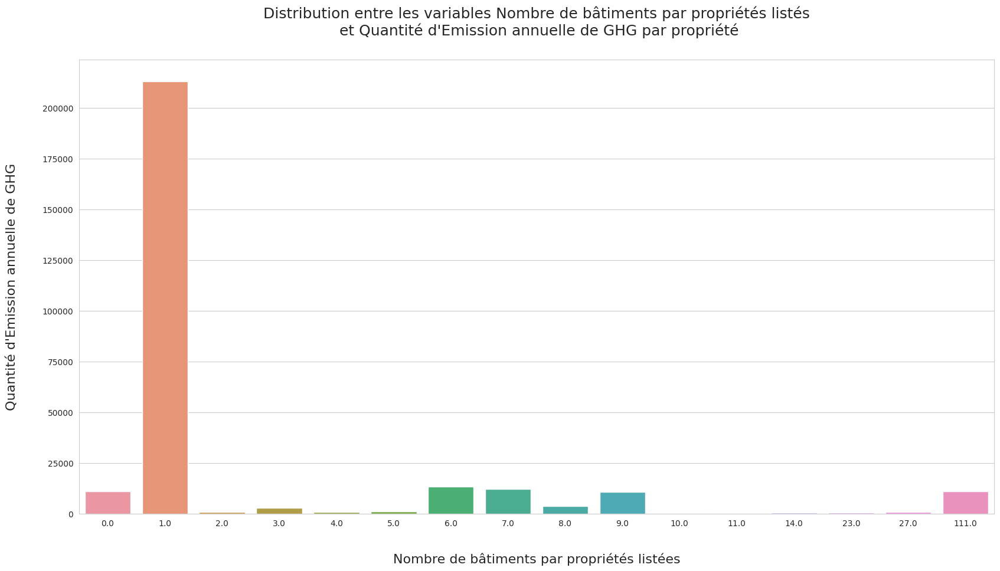

In [ ]:
plt.figure(figsize=(20,10))

# Créer un graphique à barres avec seaborn
sns.set_style("whitegrid") 
sns.barplot(x=emission_GES_VS_nb_bat_par_propriete['Nbre de bâts. par propriétés listés'], y=emission_GES_VS_nb_bat_par_propriete["Emission GES sur site"]) 

plt.xlabel("Nombre de bâtiments par propriétés listées", fontsize=16, labelpad=30)
plt.ylabel("Quantité d'Emission annuelle de GHG", fontsize=16, labelpad=30)
plt.title("Distribution entre les variables Nombre de bâtiments par propriétés listés\n et Quantité d'Emission annuelle de GHG par propriété", pad=30, fontsize=18)
plt.show()

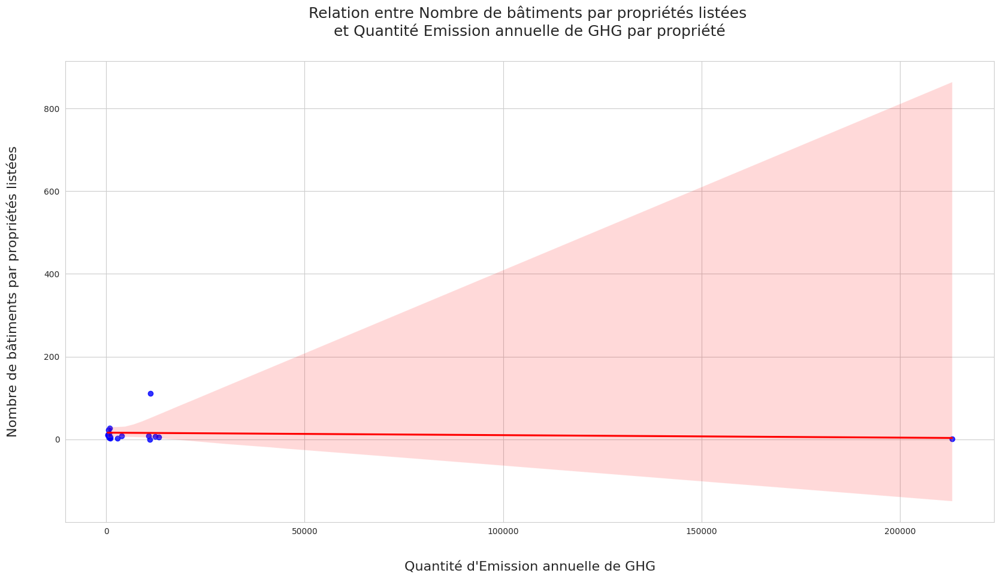

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(y=emission_GES_VS_nb_bat_par_propriete['Nbre de bâts. par propriétés listés'], x=emission_GES_VS_nb_bat_par_propriete["Emission GES sur site"], data=emission_GES_VS_nb_bat_par_propriete, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.ylabel("Nombre de bâtiments par propriétés listées", fontsize=16, labelpad=30)
plt.xlabel("Quantité d'Emission annuelle de GHG", fontsize=16, labelpad=30)
plt.title("Relation entre Nombre de bâtiments par propriétés listées \net Quantité Emission annuelle de GHG par propriété", pad=30, fontsize=18)

# définir les limites d'axes x et y
#plt.ylim(-50, 200)

plt.show()

A travers ce graphe, on constate qu'il ya une relation non linéaire entre les variables x et y. Plus précisément, cela peut indiquer une relation inversement proportionnelle entre les variables.

Afin d'analyser plus en détail cette relation, faisons un test d'hypothèse pour déterminer si une hypothèse nulle doit être rejetée ou acceptée.

In [ ]:
# Créons une variable indépendante X et une variable dépendante Y
X = emission_GES_VS_nb_bat_par_propriete['Nbre de bâts. par propriétés listés']
Y = emission_GES_VS_nb_bat_par_propriete["Emission GES sur site"]

# Ajoutons une constante à X pour ajuster l'interception dans la régression
X = sm.add_constant(X)

# Ajustons un modèle de régression linéaire
model = sm.OLS(Y, X).fit()

# Obtenons les coefficients de régression
beta_0, beta_1 = model.params

# Obtenons la valeur p pour le test de la pente
t, p = stats.ttest_1samp(model.params, 0)

# Affichons la valeur p
print('La valeur p pour le test t est :', p)

La valeur p pour le test t est : 0.5069294654953945


Notre valeur p pour le test t est égale à 0,506, cela signifie qu'elle est supérieure à un niveau de signification communément utilisé de 0,05.

Cela suggère que nous ne pouvons pas rejeter l'hypothèse nulle selon laquelle la pente de la droite de régression est nulle ou non significative. Autrement dit, il n'y a pas suffisamment de preuves pour conclure qu'il y a une relation significative entre les variables.

>>>>> ##### Visualisation des distributions de chaque variable **SiteEnergyUse(kBtu)** et **TotalGHGEmissions**

Visualisation des distributions de chaque variable :

**Traçons la distribution SiteEnergyUse(kBtu)**

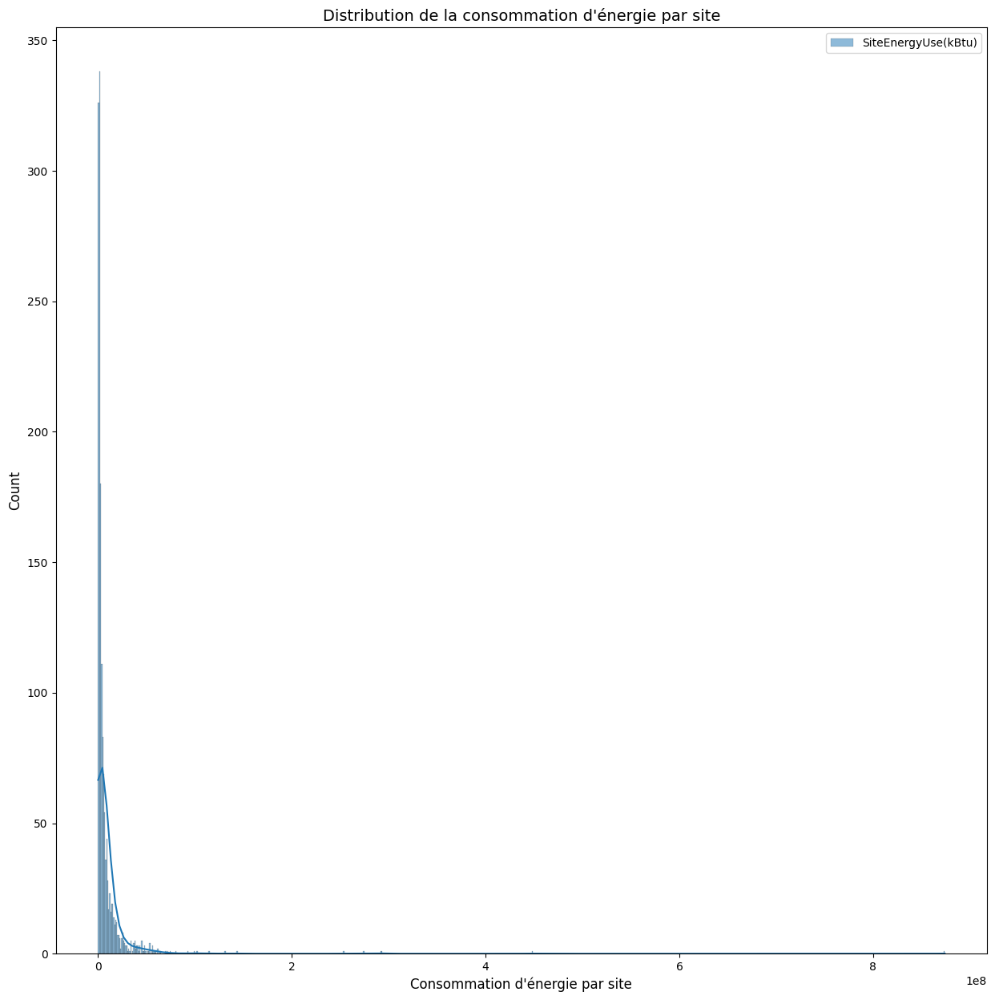

In [ ]:
plt.figure(figsize=(15,15))

# Tracer l'histogramme
sns.histplot(df_for_exploration['SiteEnergyUse(kBtu)'], label='SiteEnergyUse(kBtu)', kde=True)

# Afficher la légende et les étiquettes d'axes
plt.legend(loc='upper right')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Consommation d\'énergie par site', fontsize=12)
plt.title('Distribution de la consommation d\'énergie par site', fontsize=14)

# définir les limites d'axes x et y
#plt.xlim(0, 2.1e8)

# Afficher le graphique
plt.show()

In [ ]:
from scipy.stats import kstest

# effectuer le test de Kolmogorov-Smirnov
kstest_result = kstest(df_for_exploration['SiteEnergyUse(kBtu)'], 'norm')

# extraire la P-valeur du résultat du test
p_value = kstest_result.pvalue

print('Test de Kolmogorov-Smirnov : p-value =', p_value)


Test de Kolmogorov-Smirnov : p-value = 0.0


**Traçons la distribution GHGEmissions**

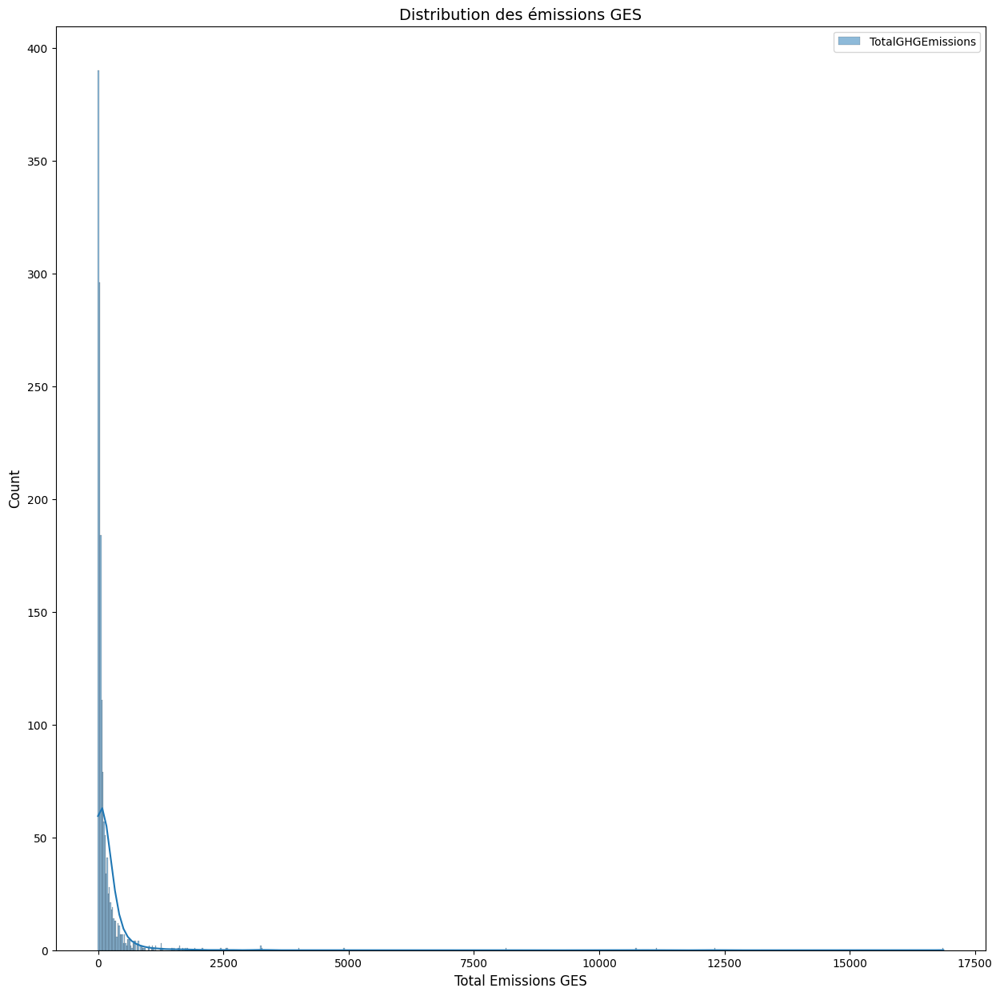

In [ ]:
plt.figure(figsize=(15,15))

# Tracer l'histogramme
sns.histplot(df_for_exploration['TotalGHGEmissions'], label='TotalGHGEmissions', kde=True)

# Afficher la légende et les étiquettes d'axes
plt.legend(loc='upper right')
plt.ylabel('Count', fontsize=12)
plt.xlabel('Total Emissions GES', fontsize=12)
plt.title('Distribution des émissions GES', fontsize=14)

# définir les limites d'axes x et y
#plt.xlim(0, 5000)

# Afficher le graphique
plt.show()

In [ ]:
from scipy.stats import kstest

# effectuer le test de Kolmogorov-Smirnov
kstest_result = kstest(df_for_exploration['TotalGHGEmissions'], 'norm')

display(kstest_result)

# extraire la P-valeur du résultat du test
p_value = kstest_result.pvalue

print('Test de Kolmogorov-Smirnov : p-value =', p_value)


KstestResult(statistic=0.9702623810475901, pvalue=0.0, statistic_location=2.62, statistic_sign=-1)

Test de Kolmogorov-Smirnov : p-value = 0.0


In [ ]:
df_for_exploration.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'NaturalGas(therms)', 'TotalGHGEmissions',
       'Electricity(kWh)'],
      dtype='object')

<ipython-input-37-2fdc18d025a5>:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=df_for_exploration, x="SiteEnergyUse(kBtu)", y="TotalGHGEmissions", palette="viridis")


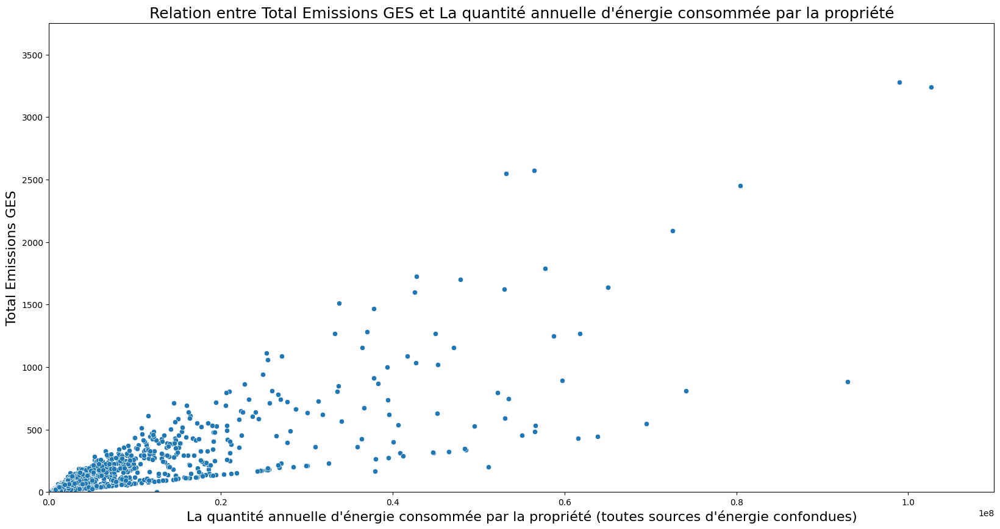

In [ ]:
# Créons un scatterplot avec hue="DataCenter" pour distinguer les bâtiments avec et sans data center
plt.figure(figsize=(20,10))
sns.scatterplot(data=df_for_exploration, x="SiteEnergyUse(kBtu)", y="TotalGHGEmissions", palette="viridis")

plt.ylabel("Total Emissions GES", fontsize=16)
plt.xlabel("La quantité annuelle d'énergie consommée par la propriété (toutes sources d'énergie confondues)", fontsize=16)
plt.title("Relation entre Total Emissions GES et La quantité annuelle d'énergie consommée par la propriété", fontsize=18)

# définissons les limites d'axes x et y
plt.xlim(0, 1.1e8)
plt.ylim(0, 3750)

plt.show()

>>>>> ##### Etude comparative entre les variables **ENERGYSTARScore** et **TotalGHGEmissions**

Calcul des statistiques descriptives :

In [ ]:
# Calcul des statistiques descriptives pour chaque variable
print('Energy Star Scores: ')
print(df_for_exploration[['ENERGYSTARScore', 'TotalGHGEmissions']].describe())


Energy Star Scores: 
       ENERGYSTARScore  TotalGHGEmissions
count         1539.000           1539.000
mean            66.227            184.599
std             23.393            757.089
min              1.000             -0.800
25%             60.000             20.395
50%             71.000             49.620
75%             79.000            144.950
max            100.000          16870.980


Étude de la corrélation entre les deux variables :

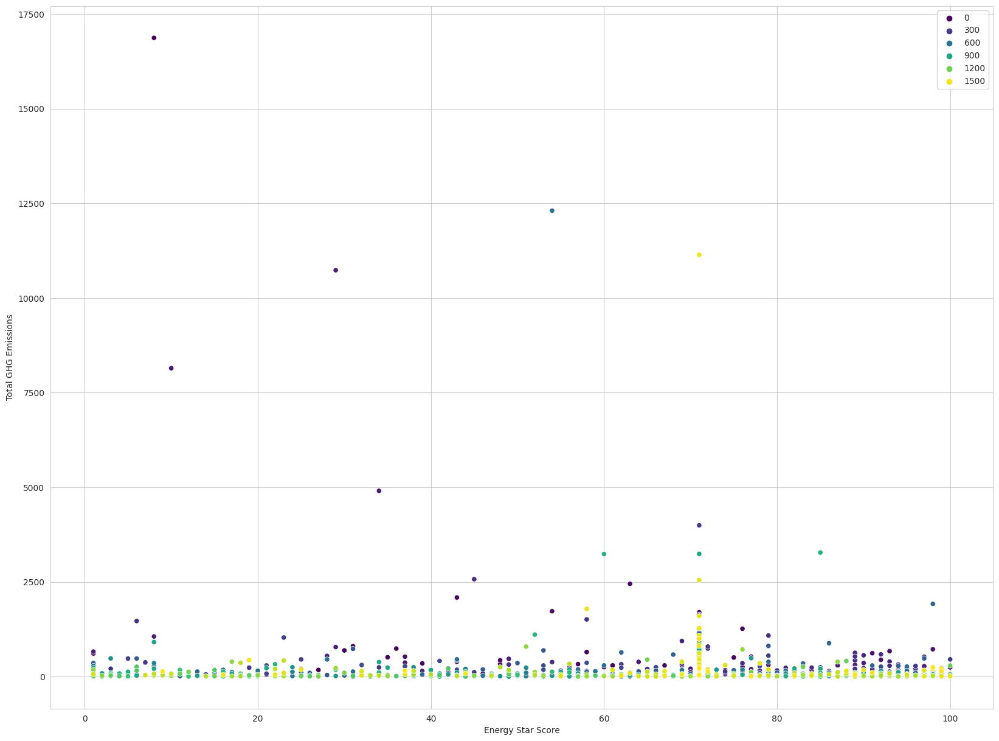



Correlation coefficient:  -0.09293314110378957


In [ ]:
plt.figure(figsize=(20,15))

# Tracer un graphique de dispersion pour les deux variables
sns.scatterplot(x='ENERGYSTARScore', y='TotalGHGEmissions', hue=df_for_exploration.index, data=df_for_exploration, palette="viridis")
plt.xlabel('Energy Star Score')
plt.ylabel('Total GHG Emissions')
plt.show()

print('\n')

# Calcul du coefficient de corrélation de Pearson
corr_coef = np.corrcoef(df_for_exploration['ENERGYSTARScore'], df_for_exploration['TotalGHGEmissions'])[0,1]
print('Correlation coefficient: ', corr_coef)



Régression linéaire :

In [ ]:
import statsmodels.api as sm

# Effectuer une régression linéaire
X = df_for_exploration['ENERGYSTARScore']
Y = df_for_exploration['TotalGHGEmissions']
X = sm.add_constant(X)
model = sm.OLS(Y, X)
results = model.fit()

# Afficher les résultats
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:      TotalGHGEmissions   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     13.39
Date:                Tue, 11 Apr 2023   Prob (F-statistic):           0.000262
Time:                        01:49:54   Log-Likelihood:                -12379.
No. Observations:                1539   AIC:                         2.476e+04
Df Residuals:                    1537   BIC:                         2.477e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             383.7891     57.729     

Test d'hypothèse :

In [ ]:
from scipy.stats import ttest_ind

# Effectuer un test t pour comparer les moyennes des scores Energy Star
# pour les bâtiments avec des émissions de GES élevées et faibles
high_emissions = df_for_exploration[df_for_exploration['TotalGHGEmissions'] > df_for_exploration['TotalGHGEmissions'].mean()]
low_emissions = df_for_exploration[df_for_exploration['TotalGHGEmissions'] < df_for_exploration['TotalGHGEmissions'].mean()]

t_statistic, p_value = ttest_ind(high_emissions['ENERGYSTARScore'], low_emissions['ENERGYSTARScore'])

print('T-Statistic: ', t_statistic)
print('P-Value: ', p_value)


T-Statistic:  -2.097878981169592
P-Value:  0.03607876289580304


>>>>> ##### **Analyse entre variable quantative et variable cible**

>>>>>> ###### Relation entre la variable **SiteEnergyUse(kBtu)** et la variable **PropertyGFATotal**

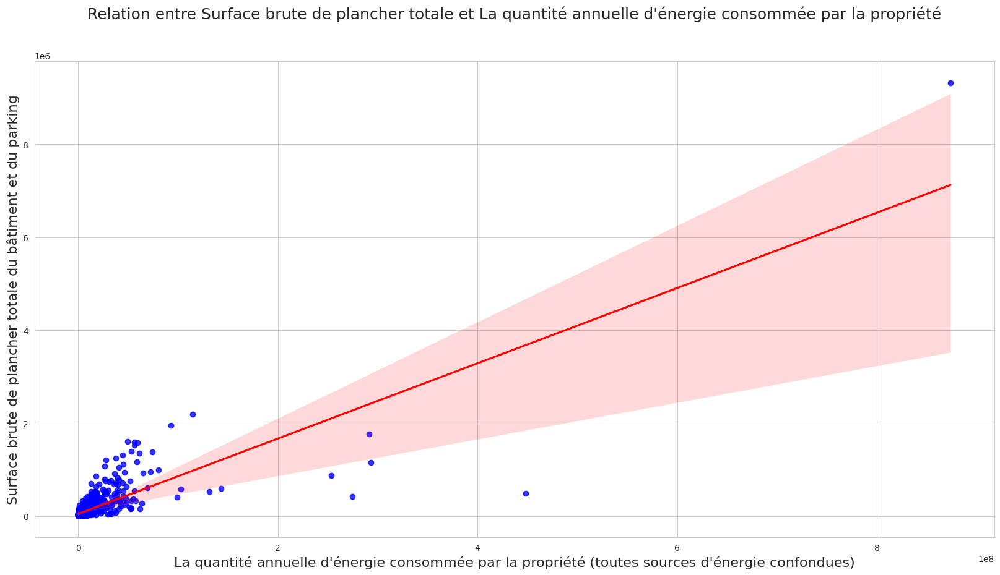

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(x='SiteEnergyUse(kBtu)', y='PropertyGFATotal', data=df_for_exploration, scatter_kws={'color':'blue'}, line_kws={'color':'red'})
plt.ylabel("Surface brute de plancher totale du bâtiment et du parking", fontsize=16)
plt.xlabel("La quantité annuelle d'énergie consommée par la propriété (toutes sources d'énergie confondues)", fontsize=16)
plt.title("Relation entre Surface brute de plancher totale et La quantité annuelle d'énergie consommée par la propriété", pad=50, fontsize=18)

# définir les limites d'axes x et y
#plt.xlim(0, 6.1e8)
#plt.ylim(0, 6.1e6)

plt.show()

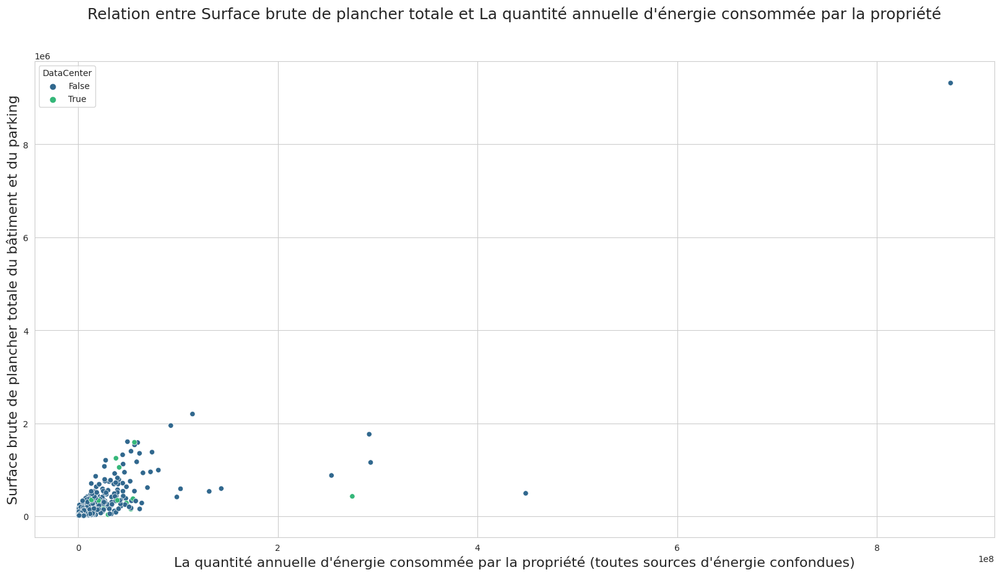

In [ ]:
# Créons un scatterplot avec hue="DataCenter" pour distinguer les bâtiments avec et sans data center
plt.figure(figsize=(20,10))
sns.scatterplot(data=df_for_exploration, x="SiteEnergyUse(kBtu)", y="PropertyGFATotal", hue="DataCenter", palette="viridis")

plt.ylabel("Surface brute de plancher totale du bâtiment et du parking", fontsize=16)
plt.xlabel("La quantité annuelle d'énergie consommée par la propriété (toutes sources d'énergie confondues)", fontsize=16)
plt.title("Relation entre Surface brute de plancher totale et La quantité annuelle d'énergie consommée par la propriété", pad=50, fontsize=18)

# définissons les limites d'axes x et y
#plt.xlim(0, 6.1e8)
#plt.ylim(0, 6.1e6)

plt.show()

(array([0.e+00, 1.e-08, 2.e-08, 3.e-08, 4.e-08, 5.e-08]),
 [Text(0, 0.0, '0'),
  Text(0, 1e-08, '1'),
  Text(0, 2e-08, '2'),
  Text(0, 3.0000000000000004e-08, '3'),
  Text(0, 4e-08, '4'),
  Text(0, 5e-08, '5')])

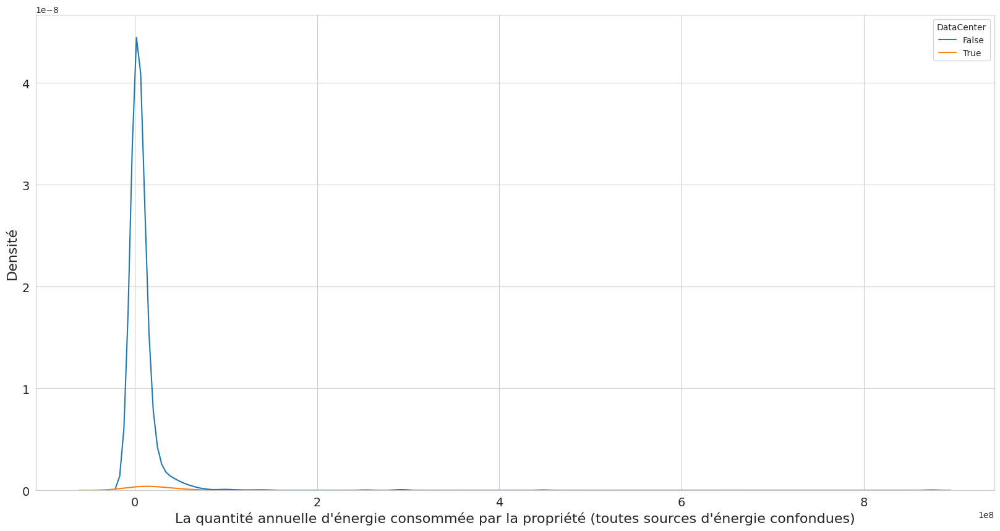

In [ ]:
plt.figure(figsize=(20,10))

sns.kdeplot(data=df_for_exploration, x='SiteEnergyUse(kBtu)', hue="DataCenter")
plt.xlabel("La quantité annuelle d'énergie consommée par la propriété (toutes sources d'énergie confondues)",fontsize=16)
plt.ylabel("Densité",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

>>>>>> ###### Relation entre la variable **TotalGHGEmissions** et la variable **PropertyGFATotal**

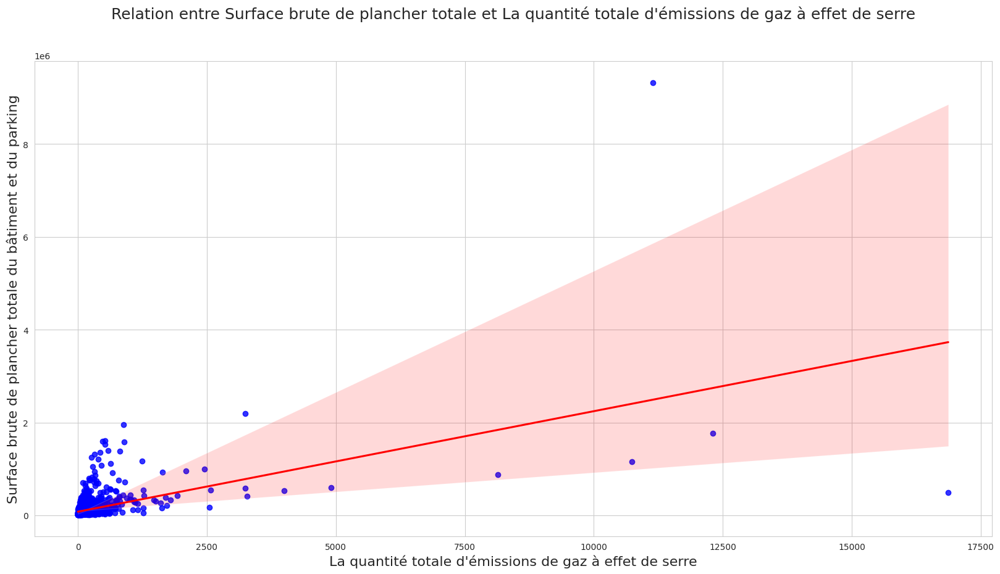

In [ ]:
plt.figure(figsize=(20,10))

# Traçons un diagramme de dispersion avec une ligne de régression linéaire ajustée.
sns.regplot(x='TotalGHGEmissions', y='PropertyGFATotal', data=df_for_exploration, scatter_kws={'color':'blue'}, line_kws={'color':'red'})

plt.ylabel("Surface brute de plancher totale du bâtiment et du parking", fontsize=16)
plt.xlabel("La quantité totale d'émissions de gaz à effet de serre", fontsize=16)
plt.title("Relation entre Surface brute de plancher totale et La quantité totale d'émissions de gaz à effet de serre", pad=50, fontsize=18)

# définir les limites d'axes x et y
#plt.xlim(0, )
#plt.ylim(0, 8.1e6)

plt.show()

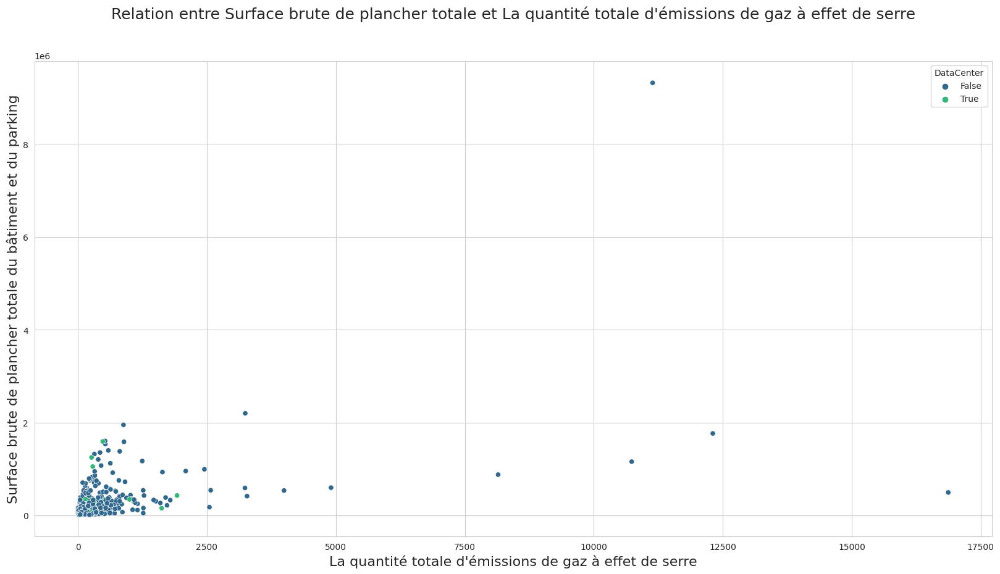

In [ ]:
# Créons un scatterplot avec hue="DataCenter" pour distinguer les bâtiments avec et sans data center
plt.figure(figsize=(20,10))
sns.scatterplot(data=df_for_exploration, x="TotalGHGEmissions", y="PropertyGFATotal", hue="DataCenter", palette="viridis")

plt.ylabel("Surface brute de plancher totale du bâtiment et du parking", fontsize=16)
plt.xlabel("La quantité totale d'émissions de gaz à effet de serre", fontsize=16)
plt.title("Relation entre Surface brute de plancher totale et La quantité totale d'émissions de gaz à effet de serre", pad=50, fontsize=18)

# définissons les limites d'axes x et y
#plt.xlim(0, )
#plt.ylim(0, 8.1e6)

plt.show()

(array([0.     , 0.00025, 0.0005 , 0.00075, 0.001  , 0.00125, 0.0015 ,
        0.00175, 0.002  ]),
 [Text(0, 0.0, '0.00000'),
  Text(0, 0.00025, '0.00025'),
  Text(0, 0.0005, '0.00050'),
  Text(0, 0.00075, '0.00075'),
  Text(0, 0.001, '0.00100'),
  Text(0, 0.00125, '0.00125'),
  Text(0, 0.0015, '0.00150'),
  Text(0, 0.00175, '0.00175'),
  Text(0, 0.002, '0.00200')])

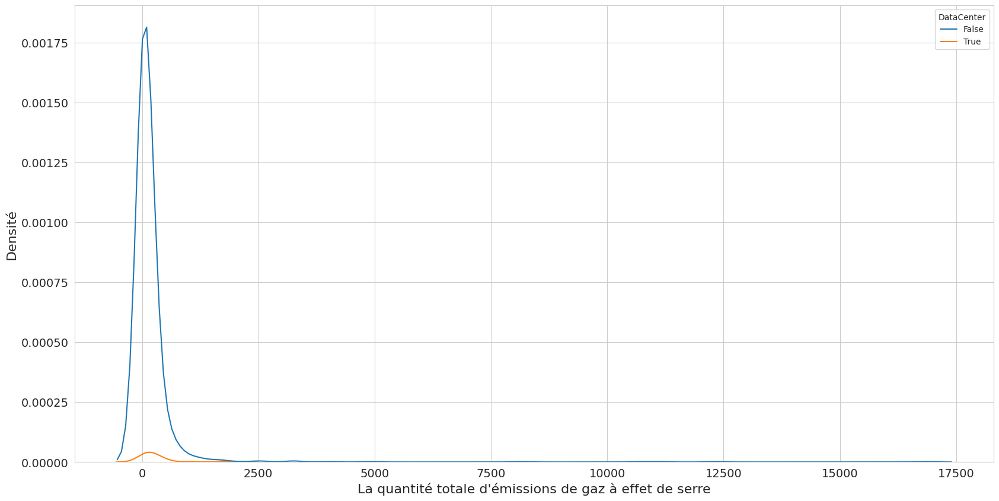

In [ ]:
plt.figure(figsize=(20,10))

sns.kdeplot(data=df_for_exploration, x='TotalGHGEmissions', hue="DataCenter")
plt.xlabel("La quantité totale d'émissions de gaz à effet de serre",fontsize=16)
plt.ylabel("Densité",fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

>>>>> ##### **Analyse entre variable qualitative et variable cible**

>>>>>> ###### Relation entre la variable '**SiteEnergyUse(kBtu)**' et la variable '**BuldingType**'

Text(0.5, 1.0, "Répartition de la consommation d'énergie en fonction du type de bâtiment")

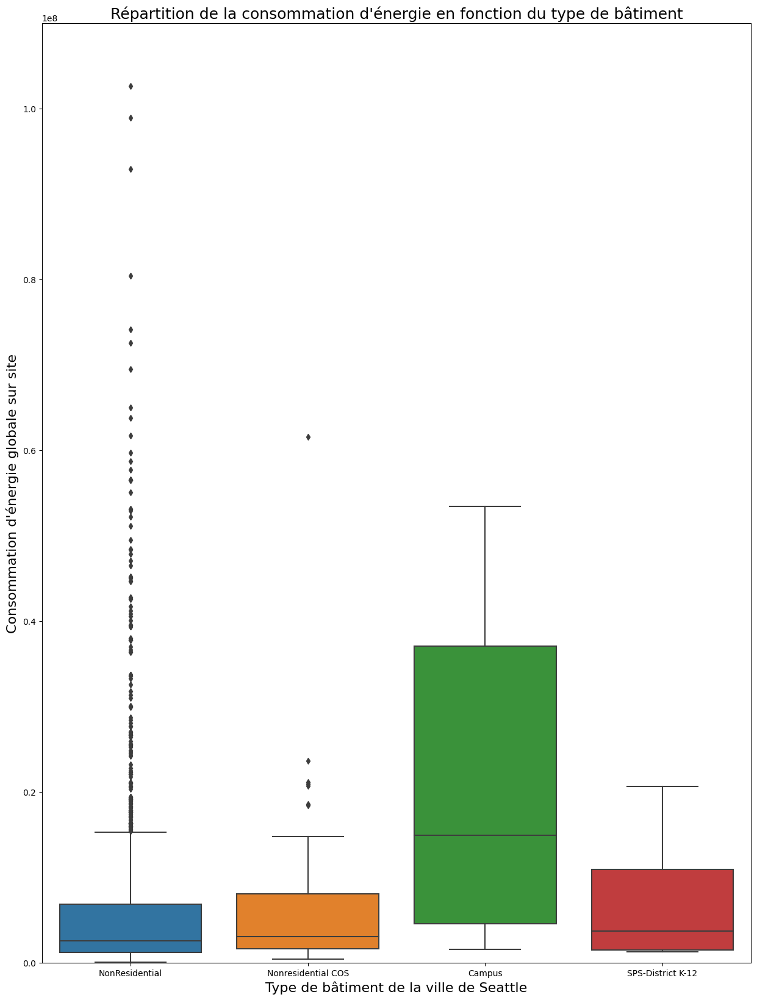

In [ ]:
plt.figure(figsize=(15,20))

sns.boxplot(x='BuildingType', y='SiteEnergyUse(kBtu)', data=df_for_exploration)
plt.xlabel('Type de bâtiment de la ville de Seattle', fontsize = 16)
plt.ylabel('Consommation d\'énergie globale sur site', fontsize = 16)

# définir les limites d'axes x et y
plt.ylim(0, 1.1e8)

plt.title('Répartition de la consommation d\'énergie en fonction du type de bâtiment', fontsize=18)

>>>>>> ###### Relation entre la variable '**GHGEmissions**' et la variable '**BuldingType**'

Text(0.5, 1.0, 'Répartition des émissions GES globale  en fonction du type de bâtiment')

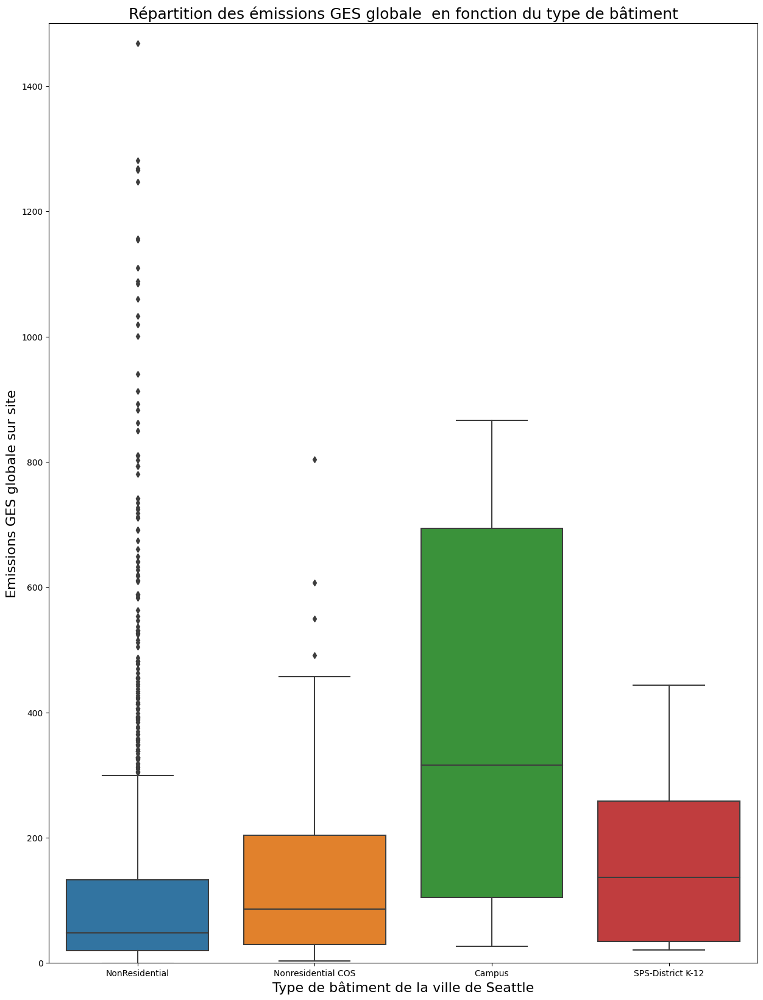

In [ ]:
plt.figure(figsize=(15,20))

sns.boxplot(x='BuildingType', y='TotalGHGEmissions', data=df_for_exploration)
plt.xlabel('Type de bâtiment de la ville de Seattle', fontsize = 16)
plt.ylabel('Emissions GES globale sur site', fontsize = 16)

# définir les limites d'axes x et y
plt.ylim(0, 1500)

plt.title('Répartition des émissions GES globale  en fonction du type de bâtiment', fontsize=18)

>>>>>> ###### Relation entre la variable **'TotalGHGEmissions'** et la variable **'YearBuilt'**

In [ ]:
df_for_exploration.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'NaturalGas(therms)', 'TotalGHGEmissions',
       'Electricity(kWh)'],
      dtype='object')

Text(0.5, 1.0, "Répartition des émissions GES globale  en fonction de l'année de construction des bâtiments")

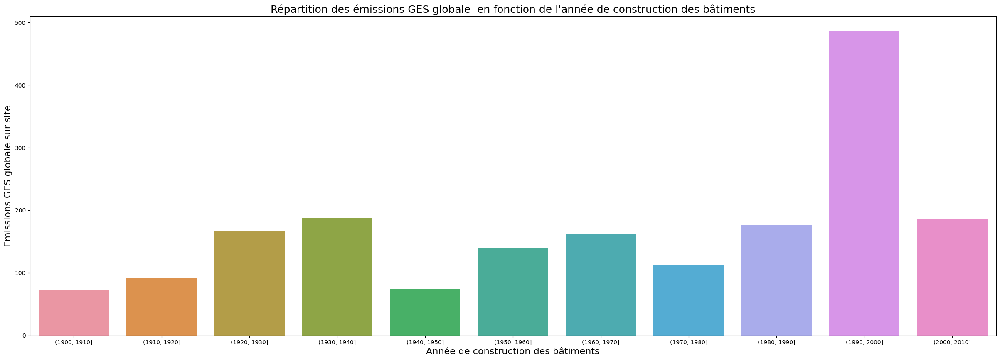

In [ ]:
plt.figure(figsize=(30,10))
bins = pd.cut(df_for_exploration['YearBuilt'], bins=range(1900, 2015, 10))

grouper = df_for_exploration.groupby(bins)['TotalGHGEmissions'].mean()
sns.barplot(x=grouper.index, y=grouper.values)

plt.xlabel('Année de construction des bâtiments', fontsize = 16)
plt.ylabel('Emissions GES globale sur site', fontsize = 16)

plt.title('Répartition des émissions GES globale  en fonction de l\'année de construction des bâtiments', fontsize=18)

>>>>>> ###### Relation entre la variable **'SiteEnergyUse(kBtu)'** et la variable **'YearBuilt'**

Text(0.5, 1.0, "Répartition de la consommation d'énergie globale  en fonction de l'année de construction des bâtiments")

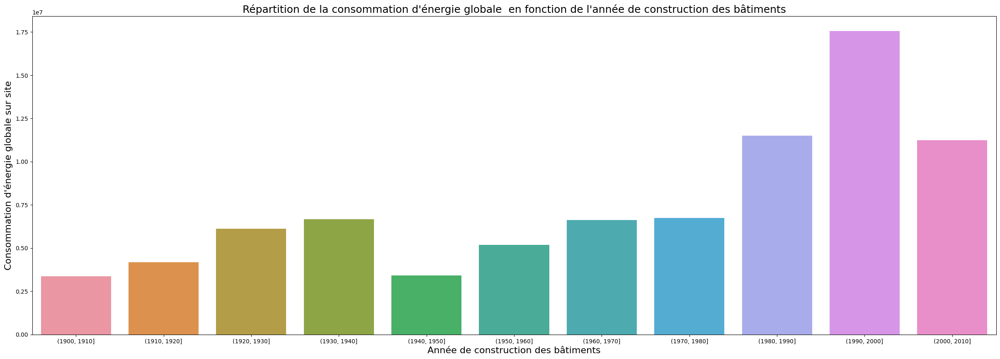

In [ ]:
plt.figure(figsize=(30,10))
bins = pd.cut(df_for_exploration['YearBuilt'], bins=range(1900, 2015, 10))

grouper = df_for_exploration.groupby(bins)['SiteEnergyUse(kBtu)'].mean()
sns.barplot(x=grouper.index, y=grouper.values)

plt.xlabel('Année de construction des bâtiments', fontsize = 16)
plt.ylabel('Consommation d\'énergie globale sur site', fontsize = 16)

plt.title('Répartition de la consommation d\'énergie globale  en fonction de l\'année de construction des bâtiments', fontsize=18)

>>>>>> ###### Relation entre la variable '**SiteEnergyUse(kBtu)**' et la variable '**PrimaryPropertyType**'

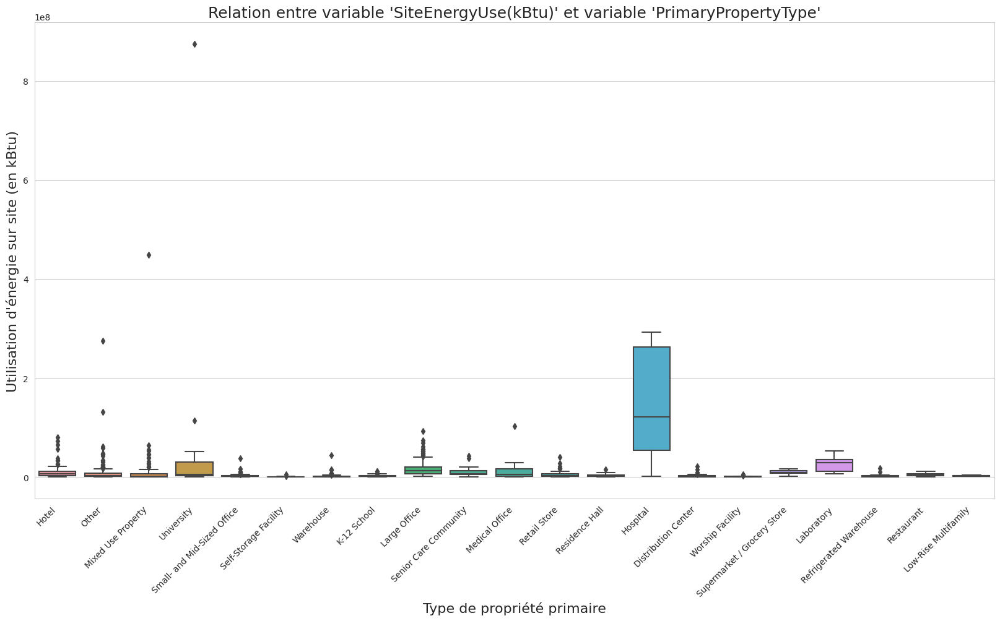

In [ ]:
plt.figure(figsize=(20,10))

# Créer un diagramme en boîte avec seaborn
sns.boxplot(x='PrimaryPropertyType', y='SiteEnergyUse(kBtu)', data=df_for_exploration)

plt.xticks(rotation=45, ha='right')
plt.title('Relation entre variable \'SiteEnergyUse(kBtu)\' et variable \'PrimaryPropertyType\'', fontsize=18)
plt.xlabel('Type de propriété primaire', fontsize=16)
plt.ylabel('Utilisation d\'énergie sur site (en kBtu)', fontsize=16)

# définissons les limites d'axes x et y
#plt.ylim(0, 4.1e8)

plt.show()

>>>>>>> ####### **Propriétés sans un Data Center en leur sein**

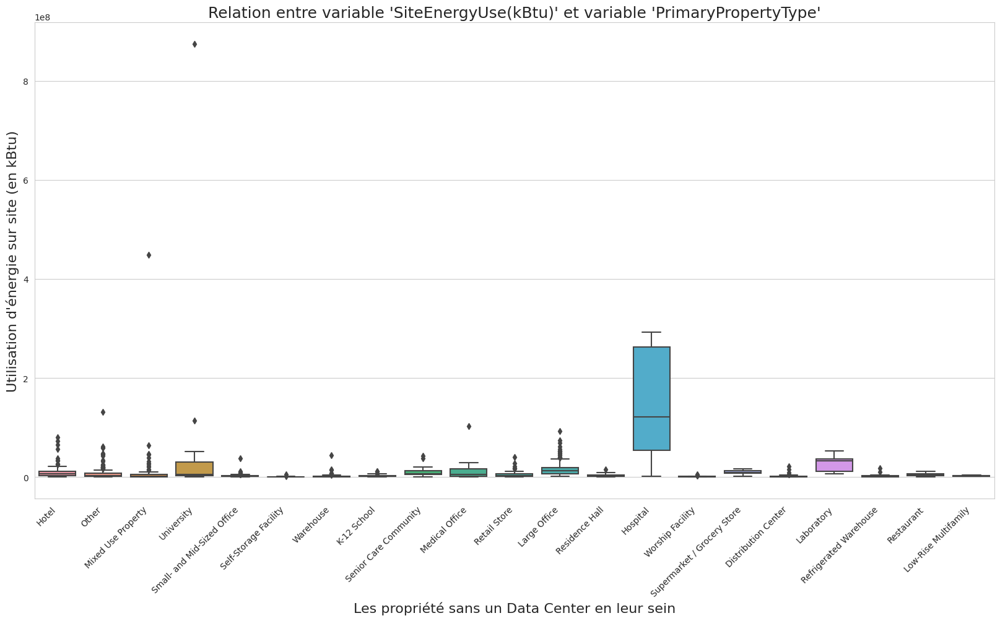

In [ ]:
plt.figure(figsize=(20,10))

# Créer un diagramme en boîte avec seaborn
sns.boxplot(x='PrimaryPropertyType', y='SiteEnergyUse(kBtu)', data=bats_non_contain_data_center)

plt.xticks(rotation=45, ha='right')
plt.title('Relation entre variable \'SiteEnergyUse(kBtu)\' et variable \'PrimaryPropertyType\'', fontsize=18)
plt.xlabel('Les propriété sans un Data Center en leur sein', fontsize=16)
plt.ylabel('Utilisation d\'énergie sur site (en kBtu)', fontsize=16)

# définissons les limites d'axes x et y
#plt.ylim(0, 1.1e8)

plt.show()

>>>>>>> ####### **Propriétés ayant un Data Center en leur sein**

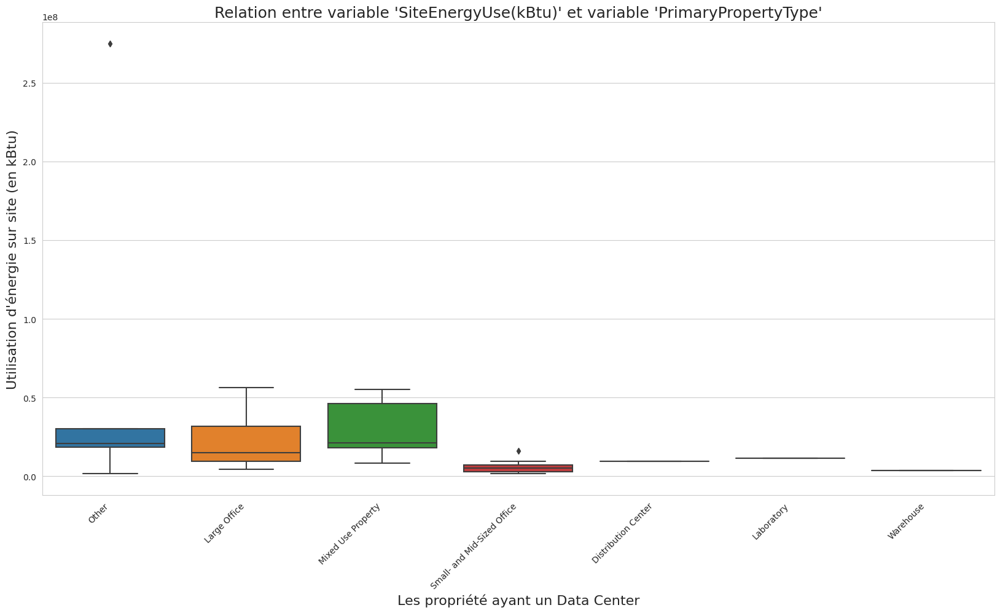

In [ ]:
plt.figure(figsize=(20,10))

# Créer un diagramme en boîte avec seaborn
sns.boxplot(x='PrimaryPropertyType', y='SiteEnergyUse(kBtu)', data=bats_contain_data_center)

plt.xticks(rotation=45, ha='right')
plt.title('Relation entre variable \'SiteEnergyUse(kBtu)\' et variable \'PrimaryPropertyType\'', fontsize=18)
plt.xlabel('Les propriété ayant un Data Center', fontsize=16)
plt.ylabel('Utilisation d\'énergie sur site (en kBtu)', fontsize=16)

# définissons les limites d'axes x et y
#plt.ylim(0, 1.1e8)

plt.show()

>>>>>> ###### Relation entre la variable **'TotalGHGEmissions'** et la variable **'PrimaryPropertyType'**

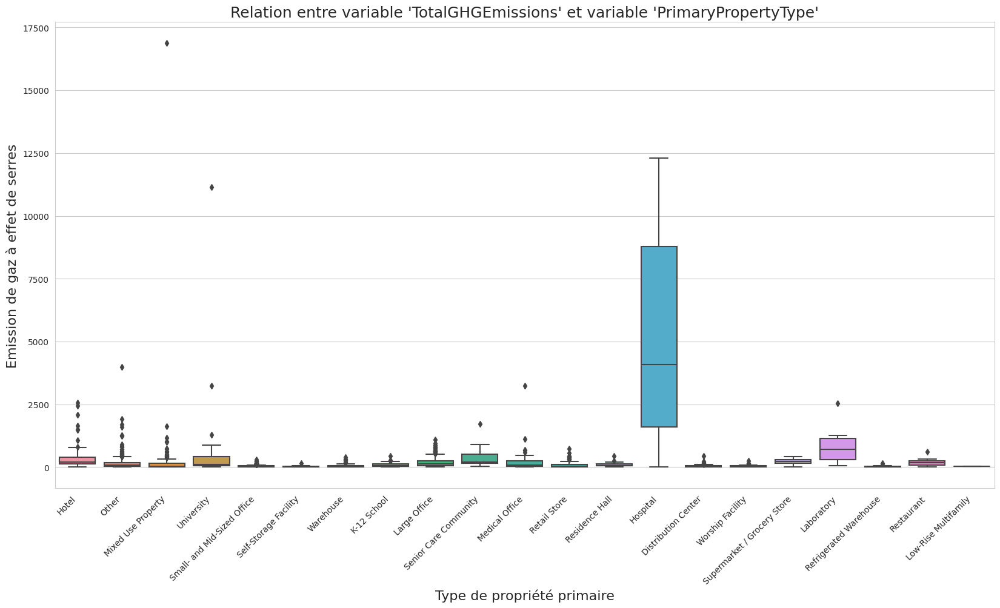

In [ ]:
plt.figure(figsize=(20,10))

# Créer un diagramme en boîte avec seaborn
sns.boxplot(x='PrimaryPropertyType', y='TotalGHGEmissions', data=df_for_exploration)

plt.xticks(rotation=45, ha='right')
plt.title('Relation entre variable \'TotalGHGEmissions\' et variable \'PrimaryPropertyType\'', fontsize=18)
plt.xlabel('Type de propriété primaire', fontsize=16)
plt.ylabel('Emission de gaz à effet de serres', fontsize=16)

# définissons les limites d'axes x et y
#plt.ylim(0, 4.1e8)

plt.show()

>>>>>>> ####### **Propriétés sans un Data Center en leur sein**

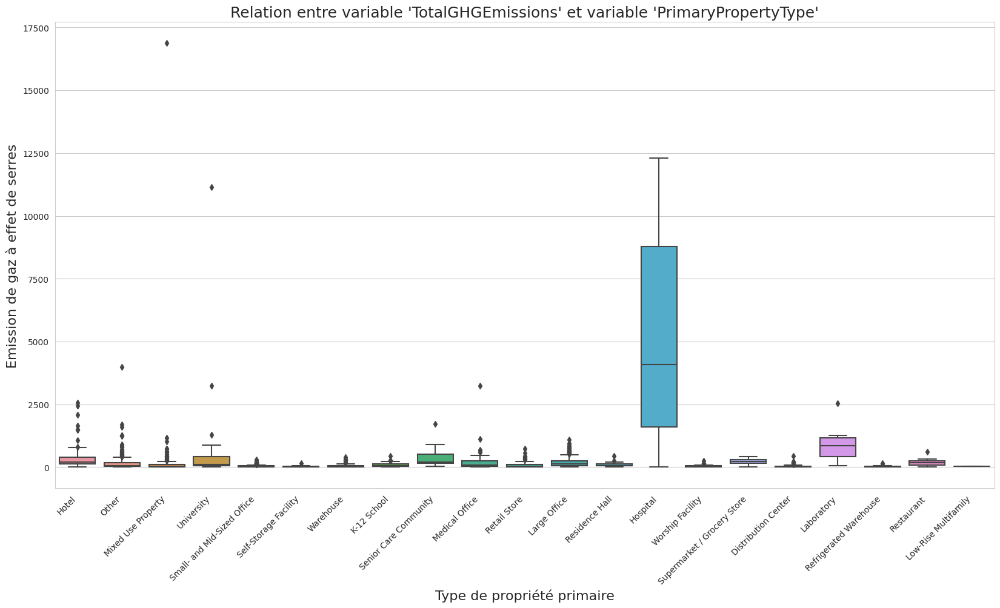

In [ ]:
plt.figure(figsize=(20,10))

# Créer un diagramme en boîte avec seaborn
sns.boxplot(x='PrimaryPropertyType', y='TotalGHGEmissions', data=bats_non_contain_data_center)

plt.xticks(rotation=45, ha='right')
plt.title('Relation entre variable \'TotalGHGEmissions\' et variable \'PrimaryPropertyType\'', fontsize=18)
plt.xlabel('Type de propriété primaire', fontsize=16)
plt.ylabel('Emission de gaz à effet de serres', fontsize=16)

# définissons les limites d'axes x et y
#plt.ylim(0, 1.1e8)

plt.show()

>>>>>>> ####### **Propriétés ayant un Data Center en leur sein**

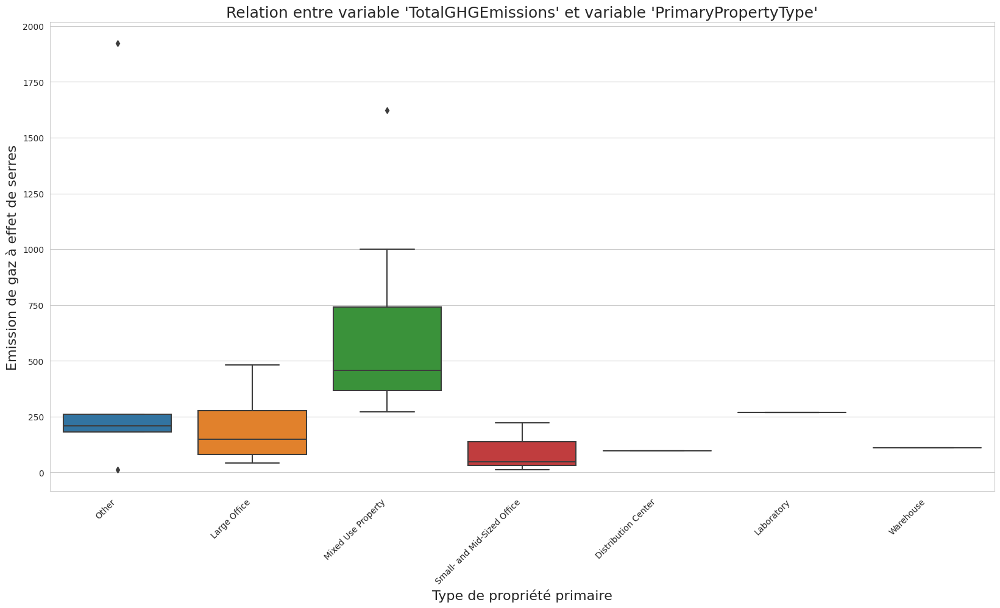

In [ ]:
plt.figure(figsize=(20,10))

# Créer un diagramme en boîte avec seaborn
sns.boxplot(x='PrimaryPropertyType', y='TotalGHGEmissions', data=bats_contain_data_center)

plt.xticks(rotation=45, ha='right')
plt.title('Relation entre variable \'TotalGHGEmissions\' et variable \'PrimaryPropertyType\'', fontsize=18)
plt.xlabel('Type de propriété primaire', fontsize=16)
plt.ylabel('Emission de gaz à effet de serres', fontsize=16)

# définissons les limites d'axes x et y
#plt.ylim(0, 1.1e8)

plt.show()

>>> ### **HEATMAP de corrélation**

In [ ]:
df_for_exploration.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'Latitude', 'Longitude',
       'YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'NaturalGas(therms)', 'TotalGHGEmissions',
       'Electricity(kWh)', 'DataCenter'],
      dtype='object')

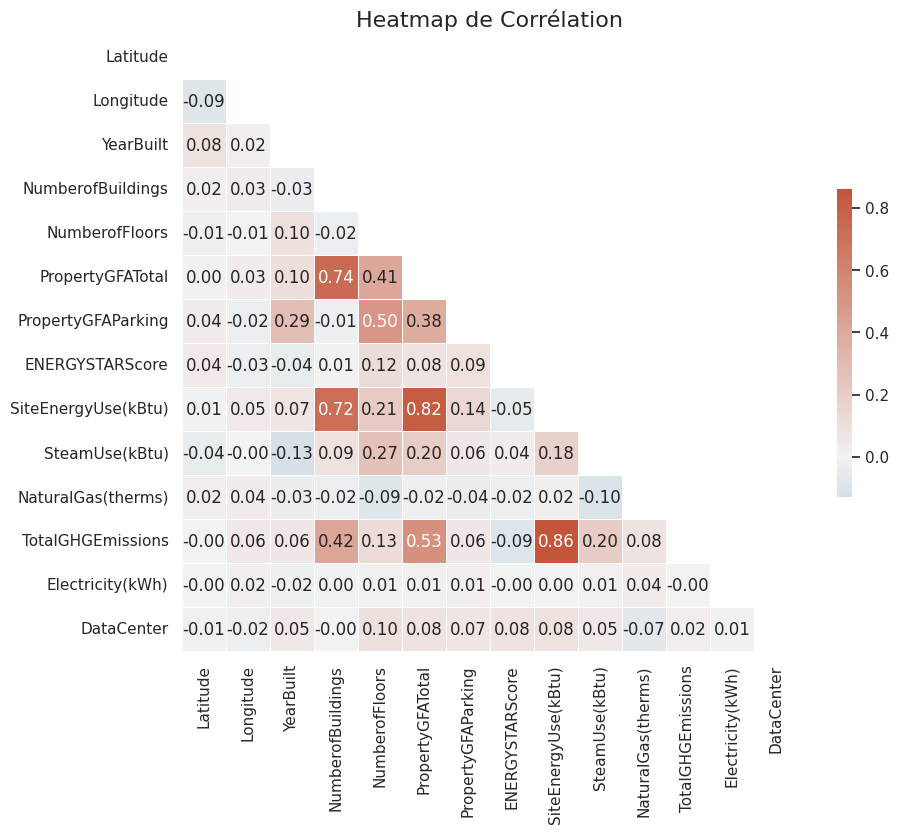

In [ ]:
# créer une matrice de corrélation pour les colonnes sélectionnées
corr_matrix = df_for_exploration.corr()

# créer une heatmap de corrélation en triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.set(style="white")
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True, fmt=".2f",
            xticklabels=corr_matrix.columns, yticklabels=corr_matrix.columns, ax=ax)

plt.title('Heatmap de Corrélation', fontsize=16)
plt.show()


>> ## **Préparation des données avant la sauvegarde**

>>> ### Changeons le type 'Booléen' de la variable **DataCenter** en type 'binaire'

In [ ]:
df_for_exploration['DataCenter'].dtype

dtype('bool')

In [ ]:
df_for_exploration['DataCenter'].value_counts()

False    1499
True       40
Name: DataCenter, dtype: int64

In [ ]:
df_for_exploration['DataCenter'] = df_for_exploration['DataCenter'].replace({False: 0, True: 1})
df_for_exploration['DataCenter']

0       0
1       0
2       0
3       0
4       0
       ..
1534    0
1535    0
1536    0
1537    0
1538    0
Name: DataCenter, Length: 1539, dtype: int64

In [ ]:
df_for_exploration['DataCenter'].value_counts()

0    1499
1      40
Name: DataCenter, dtype: int64

In [ ]:
df_for_exploration.head()

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,Electricity(kWh),DataCenter
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,47.612,-122.338,1927,1.000,12,88434,0,60.000,7226362.500,2003882.000,12764.529,249.980,1156514.250,0
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",47.613,-122.334,1996,1.000,11,103566,15064,61.000,8387933.000,0.000,51450.816,295.860,950425.188,0
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,47.614,-122.338,1969,1.000,41,956110,196718,43.000,72587024.000,21566554.000,14938.000,2089.280,14515435.000,0
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,47.614,-122.337,1926,1.000,10,61320,0,56.000,6794584.000,2214446.250,18112.131,286.430,811525.312,0
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",47.614,-122.340,1980,1.000,18,175580,62000,75.000,14172606.000,0.000,88039.984,505.010,1573448.625,0


>>> ### **Binarisation nos variables énergétiques** :


>>>> - Electricity(kWh), 
>>>> - SteamUse(kBtu), 
>>>> - NaturalGas(therms)


La condition: 0 si <=0 ou 1>0

In [ ]:
def binarize(x):
    if x <= 0:
        return 0
    else:
        return 1

df_for_exploration['Electricity(kWh)'] = df_for_exploration['Electricity(kWh)'].apply(binarize)
df_for_exploration['SteamUse(kBtu)'] = df_for_exploration['SteamUse(kBtu)'].apply(binarize)
df_for_exploration['NaturalGas(therms)'] = df_for_exploration['NaturalGas(therms)'].apply(binarize)


>>> ### Vérifions la répartition des 0 et 1 

>>>>>Supprimer la variable s'il y'a trop de 1 ou 0 dans la répartition 

In [ ]:
df_for_exploration['NaturalGas(therms)'].value_counts()

1    1099
0     440
Name: NaturalGas(therms), dtype: int64

In [ ]:
df_for_exploration['SteamUse(kBtu)'].value_counts()

0    1427
1     112
Name: SteamUse(kBtu), dtype: int64

In [ ]:
df_for_exploration['Electricity(kWh)'].value_counts()

1    1536
0       3
Name: Electricity(kWh), dtype: int64

Dans la variable Electricity(kWh), il y a quasiment que des 1.

Nous pouvons donc supprimer la variable


>>> ### Suppression des variables non necessaire dans la modélisation: **Latitude**, **Longitude** et **Electricity(kWh)**

In [ ]:
deleted_vars = ['Latitude', 'Longitude', 'Electricity(kWh)']
df_for_modelisation = df_for_exploration.drop(deleted_vars, axis=1)

In [ ]:
df_for_modelisation.head()

,BuildingType,PrimaryPropertyType,PropertyName,City,Neighborhood,ListOfAllPropertyUseTypes,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,ENERGYSTARScore,SiteEnergyUse(kBtu),SteamUse(kBtu),NaturalGas(therms),TotalGHGEmissions,DataCenter
0,NonResidential,Hotel,Mayflower park hotel,Seattle,DOWNTOWN,Hotel,1927,1.000,12,88434,0,60.000,7226362.500,1,1,249.980,0
1,NonResidential,Hotel,Paramount Hotel,Seattle,DOWNTOWN,"Hotel, Parking, Restaurant",1996,1.000,11,103566,15064,61.000,8387933.000,0,1,295.860,0
2,NonResidential,Hotel,5673-The Westin Seattle,Seattle,DOWNTOWN,Hotel,1969,1.000,41,956110,196718,43.000,72587024.000,1,1,2089.280,0
3,NonResidential,Hotel,HOTEL MAX,Seattle,DOWNTOWN,Hotel,1926,1.000,10,61320,0,56.000,6794584.000,1,1,286.430,0
4,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),Seattle,DOWNTOWN,"Hotel, Parking, Swimming Pool",1980,1.000,18,175580,62000,75.000,14172606.000,0,1,505.010,0


In [ ]:
df_for_modelisation.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'YearBuilt',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'SteamUse(kBtu)', 'NaturalGas(therms)', 'TotalGHGEmissions',
       'DataCenter'],
      dtype='object')

>> ## **Sauvegarde du dataframe pour la modélisation**

In [ ]:
df_for_modelisation.to_csv('df_for_modelisation.csv', index=False)

# <a name="C3"> **PHASE PRE-PREDICTION** </a>

>>>>>**Préparation des données**

> ## **Chargement des données**

In [ ]:
df_for_modelisation = pd.read_csv('df_for_modelisation.csv')

> ## **Vérifions qu'il existe bien une corrélation entre les variables continues et traget**

In [ ]:
df_for_modelisation.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1539 entries, 0 to 1538
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   BuildingType               1539 non-null   object 
 1   PrimaryPropertyType        1539 non-null   object 
 2   PropertyName               1539 non-null   object 
 3   City                       1539 non-null   object 
 4   Neighborhood               1539 non-null   object 
 5   ListOfAllPropertyUseTypes  1539 non-null   object 
 6   YearBuilt                  1539 non-null   int64  
 7   NumberofBuildings          1539 non-null   float64
 8   NumberofFloors             1539 non-null   int64  
 9   PropertyGFATotal           1539 non-null   int64  
 10  PropertyGFAParking         1539 non-null   int64  
 11  ENERGYSTARScore            1539 non-null   float64
 12  SiteEnergyUse(kBtu)        1539 non-null   float64
 13  SteamUse(kBtu)             1539 non-null   int64

Selectionnons les variables continues

In [ ]:
vars_continues = df_for_modelisation.select_dtypes(include=['float64'])
vars_continues

,NumberofBuildings,ENERGYSTARScore,SiteEnergyUse(kBtu),TotalGHGEmissions
0,1.000,60.000,7226362.500,249.980
1,1.000,61.000,8387933.000,295.860
2,1.000,43.000,72587024.000,2089.280
3,1.000,56.000,6794584.000,286.430
4,1.000,75.000,14172606.000,505.010
...,...,...,...,...
1534,1.000,71.000,932082.125,20.330
1535,1.000,71.000,950276.188,32.170
1536,1.000,71.000,5765898.000,223.540
1537,1.000,71.000,719471.188,22.110


In [ ]:
var_energyStarScore = df_for_modelisation['ENERGYSTARScore']
var_energyStarScore

0      60.000
1      61.000
2      43.000
3      56.000
4      75.000
        ...  
1534   71.000
1535   71.000
1536   71.000
1537   71.000
1538   71.000
Name: ENERGYSTARScore, Length: 1539, dtype: float64

Existe-t-il une correlation ?

In [ ]:
!pip install pingouin 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.6/198.6 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7048 sha256=f37d80a1b9f9755b594b2f9d47fd5f7189555e8107a433dfe53bea55dc1e53a0
  Stored in directory: /root/.cache/pip/wheels/04/bb/0d/2d02ec45f29c48d6192476bfb59c5a0e64b605e7212374dd15
Successfully built littleutils


In [ ]:
import pingouin as pg

In [ ]:
vars_continues.columns

Index(['NumberofBuildings', 'ENERGYSTARScore', 'SiteEnergyUse(kBtu)',
       'TotalGHGEmissions'],
      dtype='object')

>> ### Corrélation avec la variable target **SiteEnergyUse(kBtu)**

In [ ]:
pg.corr(x=df_for_modelisation['YearBuilt'], y=df_for_modelisation['SiteEnergyUse(kBtu)'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,0.068,"[0.02, 0.12]",0.007,1.145,0.764


> La valeur de p est inférieur au seuil de 0.05, cela implique que **la corrélation est très significative**

In [ ]:
pg.corr(x=df_for_modelisation['SteamUse(kBtu)'], y=df_for_modelisation['SiteEnergyUse(kBtu)'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,0.180,"[0.13, 0.23]",0.000,3.234e+09,1.000


> La valeur de p de 0.000 est inférieur au seuil de 0.05, cela implique que la corrélation est très significative

In [ ]:
pg.corr(x=df_for_modelisation['NumberofBuildings'], y=df_for_modelisation['SiteEnergyUse(kBtu)'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,0.722,"[0.7, 0.74]",0.000,5.911e+243,1.000


> la valeur de p est très faible (7.306183e-248), ce qui indique que la **corrélation est statistiquement significative**.

In [ ]:
pg.corr(x=df_for_modelisation['ENERGYSTARScore'], y=df_for_modelisation['SiteEnergyUse(kBtu)'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,-0.046,"[-0.1, 0.0]",0.071,0.162,0.438


> La p-valeur est de 0.071448, ce qui indique qu'il n'y a **pas de corrélation entre ces deux variables**, puisque la p-valeur de 0.071448, est supérieur au seuil de 0.05 généralement utilisé pour déterminer la significativité statistique

>> ### Corrélation avec la variable target **TotalGHGEmissions**

In [ ]:
pg.corr(x=df_for_modelisation['YearBuilt'], y=df_for_modelisation['TotalGHGEmissions'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,0.060,"[0.01, 0.11]",0.018,0.528,0.660


In [ ]:
pg.corr(x=df_for_modelisation['SteamUse(kBtu)'], y=df_for_modelisation['TotalGHGEmissions'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,0.204,"[0.16, 0.25]",0.000,4.896e+12,1.000


In [ ]:
pg.corr(x=df_for_modelisation['NumberofBuildings'], y=df_for_modelisation['TotalGHGEmissions'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,0.421,"[0.38, 0.46]",0.000,3.026e+63,1.000


Ici, le coefficient r est de 0.420848, ce qui suggère une corrélation positive modérée entre les deux variables

In [ ]:
pg.corr(x=df_for_modelisation['ENERGYSTARScore'], y=df_for_modelisation['TotalGHGEmissions'])

,n,r,CI95%,p-val,BF10,power
pearson,1539,-0.093,"[-0.14, -0.04]",0.000,24.868,0.955


La valeur de r est de -0.092933, ce qui suggère une corrélation négative faible entre les deux variables.

> Les p-valeur obtenues sont toutes inférieur au seuil de 0.05 généralement utilisé pour déterminer la significativité statistique.

> A cet egard, on peut suggerer qu'il y a **une corrélation significative entre les deux variables continues et la variable target**.

> ## **Vérifions s'il y a des variables avec une forte asymétrie**

In [ ]:
vars_for_skewness = df_for_modelisation.select_dtypes(include=['float64', 'int64']) # sélectionnons les variables numériques

vars_for_skewness = vars_for_skewness.drop(columns=['ENERGYSTARScore']) # excluons la colonne "ENERGYSTARScore" qui n'est pas corrélée à la variable target 'SiteEnergyUse(kBtu)'

vars_for_skewness.columns

Index(['YearBuilt', 'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)',
       'NaturalGas(therms)', 'TotalGHGEmissions', 'DataCenter'],
      dtype='object')

Calculons la mesure d'asymétrie pour chaque variable

In [ ]:
skewness = vars_for_skewness.skew()
skewness

YearBuilt             -0.282
NumberofBuildings     31.805
NumberofFloors         5.859
PropertyGFATotal      18.839
PropertyGFAParking     5.040
SiteEnergyUse(kBtu)   18.172
SteamUse(kBtu)         3.293
NaturalGas(therms)    -0.949
TotalGHGEmissions     14.645
DataCenter             5.964
dtype: float64

Trouvons les variables avec une forte asymétrie (valeur absolue supérieure à 1)

In [ ]:
vars_trop_asym = skewness[abs(skewness) > 1].index.tolist()
vars_trop_asym

['NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'SiteEnergyUse(kBtu)',
 'SteamUse(kBtu)',
 'TotalGHGEmissions',
 'DataCenter']

> ## **Verifions s'il existe une corrélation entre les variables trop asymétrique et les variables targets**

Selectionnons qui ont une forte asymétrie

In [ ]:
vars_trop_asym = df_for_modelisation[['NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions', 'DataCenter']]

vars_for_correlation = vars_trop_asym.drop(columns=['TotalGHGEmissions', 'SiteEnergyUse(kBtu)']) # Excluons les variables targets et 'DataCenter'
vars_for_correlation.columns

Index(['NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'DataCenter'],
      dtype='object')

>> ### Corrélation avec la variable target **SiteEnergyUse(kBtu)**

In [ ]:
for var in vars_for_correlation.columns:
    corr = df_for_modelisation[var].corr(df_for_modelisation['SiteEnergyUse(kBtu)'], method='pearson')
    print(f"la correlation entre '{var}' et SiteEnergyUse(kBtu) est: {corr:.2f}")

la correlation entre 'NumberofFloors' et SiteEnergyUse(kBtu) est: 0.21
la correlation entre 'PropertyGFATotal' et SiteEnergyUse(kBtu) est: 0.82
la correlation entre 'PropertyGFAParking' et SiteEnergyUse(kBtu) est: 0.14
la correlation entre 'DataCenter' et SiteEnergyUse(kBtu) est: 0.08


>> ### Corrélation avec la variable target **TotalGHGEmissions**

In [ ]:
for var in vars_for_correlation.columns:
    corr = df_for_modelisation[var].corr(df_for_modelisation['TotalGHGEmissions'], method='pearson')
    print(f"la correlation entre '{var}' et TotalGHGEmissions est: {corr:.2f}")

la correlation entre 'NumberofFloors' et TotalGHGEmissions est: 0.13
la correlation entre 'PropertyGFATotal' et TotalGHGEmissions est: 0.53
la correlation entre 'PropertyGFAParking' et TotalGHGEmissions est: 0.06
la correlation entre 'DataCenter' et TotalGHGEmissions est: 0.02


>> ### Supprimons la variable corrélée avec les variables targets

In [ ]:
vars_trop_asym = vars_trop_asym.drop(columns='DataCenter').columns
vars_trop_asym

Index(['NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'SiteEnergyUse(kBtu)', 'TotalGHGEmissions'],
      dtype='object')

> ## **Effectuons une transformation logarithmique des variables ayant une forte asymétyrie**

In [ ]:
vars_trop_asym = df_for_modelisation[['NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']]
vars_trop_asym.head()

,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SiteEnergyUse(kBtu),TotalGHGEmissions
0,12,88434,0,7226362.500,249.980
1,11,103566,15064,8387933.000,295.860
2,41,956110,196718,72587024.000,2089.280
3,10,61320,0,6794584.000,286.430
4,18,175580,62000,14172606.000,505.010


In [ ]:
# Ajoutons 1 à toutes les valeurs
vars_trop_asym = df_for_modelisation[['NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
 'SiteEnergyUse(kBtu)', 'TotalGHGEmissions']] + 1
vars_trop_asym.head()

,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SiteEnergyUse(kBtu),TotalGHGEmissions
0,13,88435,1,7226363.500,250.980
1,12,103567,15065,8387934.000,296.860
2,42,956111,196719,72587025.000,2090.280
3,11,61321,1,6794585.000,287.430
4,19,175581,62001,14172607.000,506.010


In [ ]:
# Appliquons la transformation logarithmique à toutes les colonnes
vars_trop_asym_log = np.log(vars_trop_asym)

# Vérifions la transformation
vars_trop_asym_log.head()

,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SiteEnergyUse(kBtu),TotalGHGEmissions
0,2.565,11.390,0.000,15.793,5.525
1,2.485,11.548,9.620,15.942,5.693
2,3.738,13.771,12.190,18.100,7.645
3,2.398,11.024,0.000,15.732,5.661
4,2.944,12.076,11.035,16.467,6.227


> ## **Encodons les variables qualitatives**

In [ ]:
vars_quali = df_for_modelisation.select_dtypes(include=['object'])
vars_quali.columns

Index(['BuildingType', 'PrimaryPropertyType', 'PropertyName', 'City',
       'Neighborhood', 'ListOfAllPropertyUseTypes'],
      dtype='object')

Supprimons les colonnes non nécéssaires

In [ ]:
vars_quali_for_encoding = df_for_modelisation.drop(columns=['ListOfAllPropertyUseTypes', 'Neighborhood', 'City', 'PropertyName'])
vars_quali_for_encoding.columns

Index(['BuildingType', 'PrimaryPropertyType', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'ENERGYSTARScore', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)',
       'NaturalGas(therms)', 'TotalGHGEmissions', 'DataCenter'],
      dtype='object')

>> ### Effectuons un ORDINAL encoding sur la variable **YearBuilt**

In [ ]:
from sklearn.preprocessing import OrdinalEncoder

# Créer une instance de l'encodeur ordinal
encoder = OrdinalEncoder()

In [ ]:
# Créer un tableau 2D contenant la variable YearBuilt
year_built_array = df_for_modelisation['YearBuilt'].values.reshape(-1, 1)
year_built_array

array([[1927],
       [1996],
       [1969],
       ...,
       [1974],
       [1989],
       [1938]])

In [ ]:
# Effectuer l'encodage ordinal
Year_built_encoded = encoder.fit_transform(year_built_array)
Year_built_encoded

array([[27.],
       [93.],
       [66.],
       ...,
       [71.],
       [86.],
       [36.]])

In [ ]:
# Ajouter la variable encodée à votre dataframe
df_for_modelisation['YearBuiltEncoded'] = Year_built_encoded
df_for_modelisation['YearBuiltEncoded']

0       27.000
1       93.000
2       66.000
3       26.000
4       77.000
         ...  
1534    79.000
1535   101.000
1536    71.000
1537    86.000
1538    36.000
Name: YearBuiltEncoded, Length: 1539, dtype: float64

In [ ]:
df = pd.concat([var_energyStarScore, df_for_modelisation['YearBuiltEncoded'], vars_trop_asym_log], axis=1)
df.head()

,ENERGYSTARScore,YearBuiltEncoded,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SiteEnergyUse(kBtu),TotalGHGEmissions
0,60.000,27.000,2.565,11.390,0.000,15.793,5.525
1,61.000,93.000,2.485,11.548,9.620,15.942,5.693
2,43.000,66.000,3.738,13.771,12.190,18.100,7.645
3,56.000,26.000,2.398,11.024,0.000,15.732,5.661
4,75.000,77.000,2.944,12.076,11.035,16.467,6.227


>> ### Effectuons un ONE HOT encoding sur la variable **BuildingType** 

In [ ]:
# Sélectionner la variable 'BuildingType'
buildingtype = vars_quali_for_encoding['BuildingType']
buildingtype.value_counts()



NonResidential        1425
Nonresidential COS      81
Campus                  23
SPS-District K-12       10
Name: BuildingType, dtype: int64

In [ ]:
# Effectuer le One Hot Encoding
one_hot = pd.get_dummies(buildingtype)
one_hot

,Campus,NonResidential,Nonresidential COS,SPS-District K-12
0,0,1,0,0
1,0,1,0,0
2,0,1,0,0
3,0,1,0,0
4,0,1,0,0
...,...,...,...,...
1534,0,0,1,0
1535,0,0,1,0
1536,0,0,1,0
1537,0,0,1,0


In [ ]:
final_df = pd.concat([one_hot, df_for_modelisation['PrimaryPropertyType'], df], axis=1)
final_df.head()

,Campus,NonResidential,Nonresidential COS,SPS-District K-12,PrimaryPropertyType,ENERGYSTARScore,YearBuiltEncoded,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SiteEnergyUse(kBtu),TotalGHGEmissions
0,0,1,0,0,Hotel,60.000,27.000,2.565,11.390,0.000,15.793,5.525
1,0,1,0,0,Hotel,61.000,93.000,2.485,11.548,9.620,15.942,5.693
2,0,1,0,0,Hotel,43.000,66.000,3.738,13.771,12.190,18.100,7.645
3,0,1,0,0,Hotel,56.000,26.000,2.398,11.024,0.000,15.732,5.661
4,0,1,0,0,Hotel,75.000,77.000,2.944,12.076,11.035,16.467,6.227


> ## **Préparons la dataframe avant la sauvegarde**



In [ ]:
df_for_prediction = final_df
df_for_prediction.head()

,Campus,NonResidential,Nonresidential COS,SPS-District K-12,PrimaryPropertyType,ENERGYSTARScore,YearBuiltEncoded,NumberofFloors,PropertyGFATotal,PropertyGFAParking,SiteEnergyUse(kBtu),TotalGHGEmissions
0,0,1,0,0,Hotel,60.000,27.000,2.565,11.390,0.000,15.793,5.525
1,0,1,0,0,Hotel,61.000,93.000,2.485,11.548,9.620,15.942,5.693
2,0,1,0,0,Hotel,43.000,66.000,3.738,13.771,12.190,18.100,7.645
3,0,1,0,0,Hotel,56.000,26.000,2.398,11.024,0.000,15.732,5.661
4,0,1,0,0,Hotel,75.000,77.000,2.944,12.076,11.035,16.467,6.227


> ## **Sauvegarde du dataframe pour la prédiction**

In [ ]:
df_for_prediction.to_csv('df_for_prediction.csv', index=False)